# Overview (Female Candidate)

In [1]:
# path to user functions
import sys  
sys.path.append('../Src/')

import pandas as pd
import pickle
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns
import sys

from scipy import stats
from importlib.metadata import version

# set seaborn theme
sns.set_theme()

# python modules
# import utilities as u
import plot
import ranker
import utilities as u
# import heart_ranker as ranker
# import heart_utilities as u

# initializing variables
SEED = 1776

# Create a dictionary of versions
versions = {
    "Python": sys.version.split()[0],
    "Pandas": pd.__version__,
    "NumPy": np.__version__,
    "Seaborn": sns.__version__,
    "Matplot": sys.modules['matplotlib'].__version__,
    # "Sk-Learn": sys.modules['sklearn'].__version__,
    "Scipy": sys.modules['scipy'].__version__,
}

# Display as a clean DataFrame
df_versions = pd.DataFrame(list(versions.items()), columns=['Library', 'Version'])
print(df_versions)

# adjust pandas display options to max
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
# adjust pandas display options to ensure full display of content
pd.set_option('display.max_colwidth', None)

   Library  Version
0   Python  3.11.13
1   Pandas    3.0.2
2    NumPy    2.3.2
3  Seaborn   0.13.2
4  Matplot   3.10.5
5    Scipy   1.16.1


## Import Data

In [2]:
# import data
df = pd.read_parquet("../Data/Candidate_Female_Heart.parquet")
# display shape
df.shape

(8064, 148)

## Female

In [3]:
# display info
df.info(max_cols=df.shape[1])

<class 'pandas.DataFrame'>
RangeIndex: 8064 entries, 0 to 8063
Data columns (total 148 columns):
 #    Column                                        Non-Null Count  Dtype   
---   ------                                        --------------  -----   
 0    PreviousTransplantNumber_CAN                  8064 non-null   category
 1    WaitListDiagnosisCode_CAN                     8064 non-null   category
 2    Gender_CAN                                    8064 non-null   category
 3    BloodGroup_CAN                                8064 non-null   category
 4    Citizenship_CAN                               8064 non-null   category
 5    ResidencyStateRegistration_CAN                8064 non-null   category
 6    EducationLevel_CAN                            8064 non-null   category
 7    LifeSupportRegistration_ECMO_CAN              8064 non-null   category
 8    LifeSupportRegistration_IABP_CAN              8064 non-null   category
 9    LifeSupportInhaled_CAN                        8064

In [4]:
# Empty DataFrame # list for record keeping
mapping_df = pd.DataFrame(columns=['feature', 'consolidate', 'type', 'gender'])
gender_value = 'Female'
type_value = 'CAN'
remove_cols = []

| Feature                     | Bonferroni        | Holm‑Bonferroni   | FDR (Benjamini–Hochberg) |
|-----------------------------|-------------------|-------------------|---------------------------|
| **Strictness**              | Highest           | High              | Lowest                    |
| **Statistical Power**       | Lowest            | Moderate          | Highest                   |
| **Primary Risk**            | Type II Error     | Type II Error     | Type I Error              |
| **Best Use Case**           | 2–5 comparisons; scientific “proof” | General use; balanced control | Feature engineering; large category sets |


| Error Type     | Meaning                                      | Risk in Medical Modeling                        | Caused By                          |
|----------------|----------------------------------------------|--------------------------------------------------|------------------------------------|
| **Type I**     | False positive (detecting a difference that isn't real) | Over-splitting, spurious risk groups, misleading clinical interpretation | Too lenient alpha, weak correction |
| **Type II**    | False negative (missing a real difference)    | Collapsing meaningful categories, losing signal, underestimating risk     | Low power, strict correction, small effects |



#### Previous Transplant Number

In [5]:
# info
feature = u.get_feature_info(df, 'PreviousTransplantNumber', cat=True)

                             count unique top  freq
PreviousTransplantNumber_CAN  8064      4   0  7662

:::: NaN Count:
PreviousTransplantNumber_CAN    0 

--- PreviousTransplantNumber_CAN ---
dtype: category
Categories: ['0', '1', '2', '3']
Ordered: False



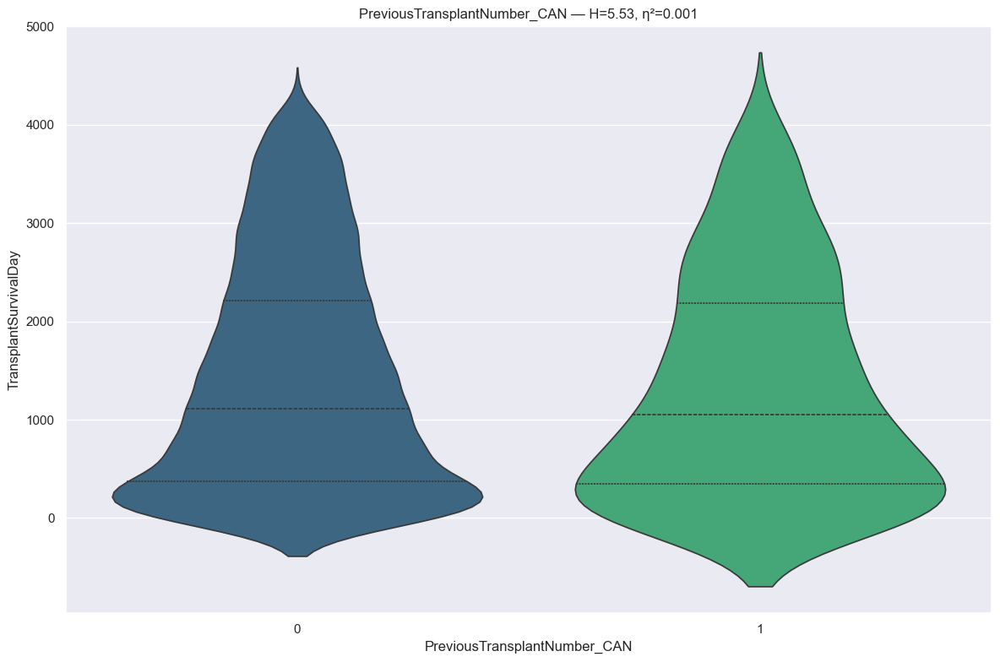

RANKING REPORT: PreviousTransplantNumber_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :   7662 records
 * 1                                                 :    371 records
BYPASSED CATEGORIES (n < min_n):
 * 2                                                 :     28 records
 * 3                                                 :      3 records
--------------------------------------------------------------------------------
Kruskal H: 5.5266 | P-value: 1.872910e-02 | Effect η²: 0.0006
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
0            vs 1            | p=1.8730e-02 | thr=0.0500 | r=-0.072 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - 0

>>> Group_2 (1 categories)
  - 1

>>> Other (

In [6]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [7]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PreviousTransplantNumber_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :   7662 records
 * 1                                                 :    371 records
BYPASSED CATEGORIES (n < min_n):
 * 2                                                 :     28 records
 * 3                                                 :      3 records
--------------------------------------------------------------------------------
Kruskal H: 5.5266 | P-value: 1.872910e-02 | Effect η²: 0.0006
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - 0

>>> Group_2 (1 categories)
  - 1

>>> Other (2 categories)
  - 2
  - 3



In [8]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### WaitList Diagnosis Code

In [9]:
# info
feature = u.get_feature_info(df, 'WaitListDiagnosisCode', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique                           top  freq
WaitListDiagnosisCode_CAN  8064     34  DILATED MYOPATHY: IDIOPATHIC  2814

:::: NaN Count:
WaitListDiagnosisCode_CAN    0 



{'WaitListDiagnosisCode_CAN': CategoricalDtype(categories=['ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY',
                   'CANCER',
                   'CONGENITAL HEART DEFECT - HYPOPLASTIC LEFT HEART SYNDROME - UNOPERATED',
                   'CONGENITAL HEART DEFECT - PRIOR SURGERY UNKNOWN',
                   'CONGENITAL HEART DEFECT - WITH SURGERY',
                   'CONGENITAL HEART DEFECT - WITHOUT SURGERY',
                   'CORONARY ARTERY DISEASE',
                   'COVID-19: DILATED MYOPATHY: ACTIVE MYOCARDITIS',
                   'COVID-19: DILATED MYOPATHY: HISTORY OF MYOCARDITIS',
                   'DILATED MYOPATHY: ADRIAMYCIN',
                   'DILATED MYOPATHY: ALCOHOLIC', 'DILATED MYOPATHY: FAMILIAL',
                   'DILATED MYOPATHY: IDIOPATHIC', 'DILATED MYOPATHY: ISCHEMIC',
                   'DILATED MYOPATHY: MYOCARDITIS',
                   'DILATED MYOPATHY: OTHER SPECIFY',
                   'DILATED MYOPATHY: POST PARTUM', 'DILA

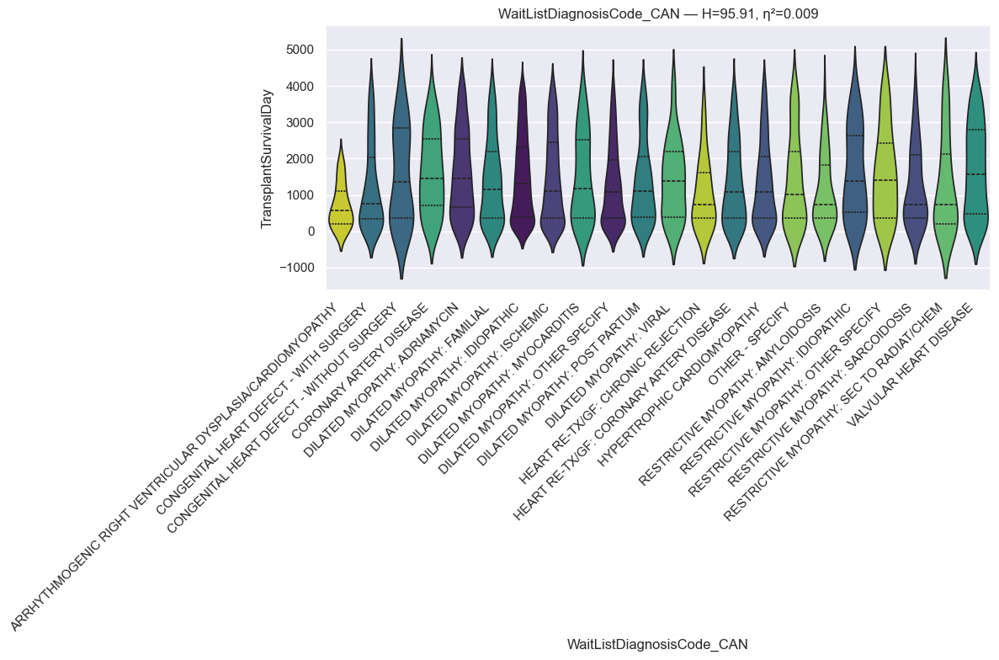

RANKING REPORT: WaitListDiagnosisCode_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:     51 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    367 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     34 records
 * CORONARY ARTERY DISEASE                           :     99 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    341 records
 * DILATED MYOPATHY: FAMILIAL                        :    355 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   2814 records
 * DILATED MYOPATHY: ISCHEMIC                        :   1217 records
 * DILATED MYOPATHY: MYOCARDITIS                     :    104 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :    874 records
 * DILATED MYOPATHY: POST PARTUM                     :    372 records
 * DILATED MYOPATHY: VIRAL                           :     69 records
 * HEART RE-TX/GF: CHRONIC REJECTION                 :     47 records
 * HEART RE

In [10]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [11]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: WaitListDiagnosisCode_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:     51 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    367 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     34 records
 * CORONARY ARTERY DISEASE                           :     99 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    341 records
 * DILATED MYOPATHY: FAMILIAL                        :    355 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   2814 records
 * DILATED MYOPATHY: ISCHEMIC                        :   1217 records
 * DILATED MYOPATHY: MYOCARDITIS                     :    104 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :    874 records
 * DILATED MYOPATHY: POST PARTUM                     :    372 records
 * DILATED MYOPATHY: VIRAL                           :     69 records
 * HEART RE-TX/GF: CHRONIC REJECTION                 :     47 records
 * HEART RE

In [12]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Gender

In [13]:
# info
feature = u.get_feature_info(df, 'Gender', cat=False)
# dtype
{col: df[col].dtype for col in feature}

           count unique top  freq
Gender_CAN  8064      1   F  8064

:::: NaN Count:
Gender_CAN    0 



{'Gender_CAN': CategoricalDtype(categories=['F', 'M'], ordered=False, categories_dtype=str)}

In [14]:
# add to remove_cols list
remove_cols.extend(feature)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Blood Group

In [15]:
# info
feature = u.get_feature_info(df, 'BloodGroup', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                     count unique        top  freq
BloodGroupMatchLevel  8064      2  Identical  6807
BloodGroup_CAN        8064      8          O  3300

:::: NaN Count:
BloodGroupMatchLevel    0
BloodGroup_CAN          0 



{'BloodGroupMatchLevel': CategoricalDtype(categories=['Compatible', 'Identical', 'Incompatible'], ordered=False, categories_dtype=str),
 'BloodGroup_CAN': CategoricalDtype(categories=['A', 'A1', 'A1B', 'A2', 'A2B', 'AB', 'B', 'O'], ordered=False, categories_dtype=str)}

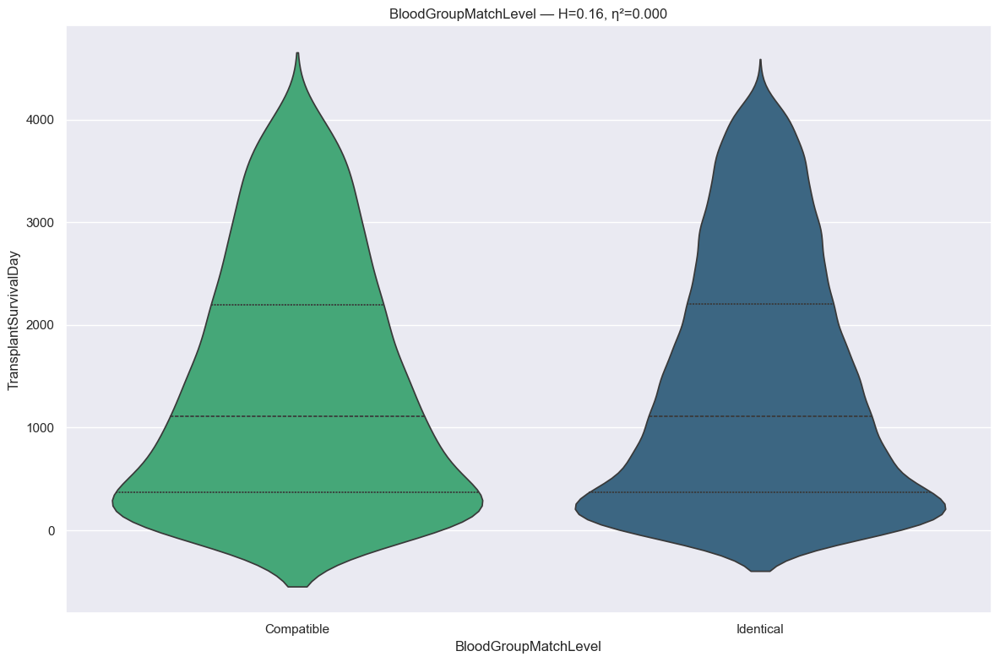

RANKING REPORT: BloodGroupMatchLevel (n ≥ 30)
INCLUDED CATEGORIES:
 * Compatible                                        :   1257 records
 * Identical                                         :   6807 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.1583 | P-value: 6.906926e-01 | Effect η²: 0.0000
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.10)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - Compatible
  - Identical

BloodGroupMatchLevel  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
           Identical         1426.829440                1112.0                 4195.0    

In [16]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "holm",
    "suppress_pairwise": True,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [17]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Citizenship

In [18]:
# info
feature = u.get_feature_info(df, 'Citizenship', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique         top  freq
Citizenship_CAN  8064      7  US Citizen  7822

:::: NaN Count:
Citizenship_CAN    0 



{'Citizenship_CAN': CategoricalDtype(categories=['NON-RESIDENT ALIEN',
                   'Non-US Citizen/Non-US Resident, Traveled to US for Reason Other Than Transplant',
                   'Non-US Citizen/Non-US Resident, Traveled to US for Transplant',
                   'Non-US Citizen/US Resident', 'RESIDENT ALIEN', 'US Citizen',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

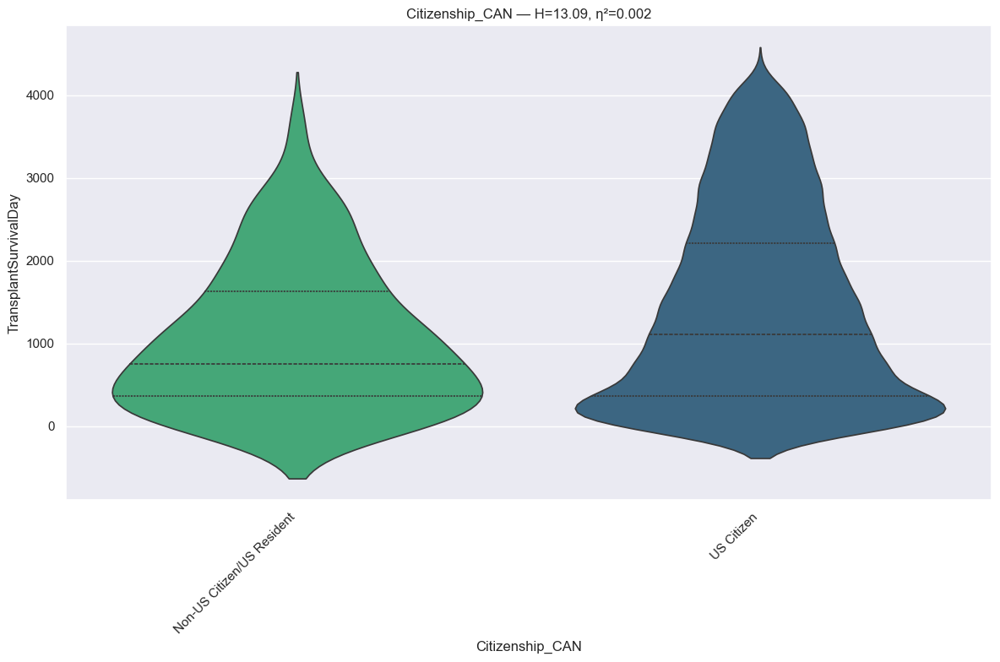

RANKING REPORT: Citizenship_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Non-US Citizen/US Resident                        :    163 records
 * US Citizen                                        :   7822 records
BYPASSED CATEGORIES (n < min_n):
 * NON-RESIDENT ALIEN                                :      5 records
 * Non-US Citizen/Non-US Resident, Traveled to US for Reason Other Than Transplant:     22 records
 * Non-US Citizen/Non-US Resident, Traveled to US for Transplant:     28 records
 * RESIDENT ALIEN                                    :     20 records
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 13.0929 | P-value: 2.964118e-04 | Effect η²: 0.0015
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Non-US Citizen/US Resident vs US Citizen   | p=2.9643e-0

In [19]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "min_n": 30,
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [20]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: Citizenship_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Non-US Citizen/US Resident                        :    163 records
 * US Citizen                                        :   7822 records
BYPASSED CATEGORIES (n < min_n):
 * NON-RESIDENT ALIEN                                :      5 records
 * Non-US Citizen/Non-US Resident, Traveled to US for Reason Other Than Transplant:     22 records
 * Non-US Citizen/Non-US Resident, Traveled to US for Transplant:     28 records
 * RESIDENT ALIEN                                    :     20 records
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 13.0929 | P-value: 2.964118e-04 | Effect η²: 0.0015
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed

In [21]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Residency State Registration

In [22]:
# info
feature = u.get_feature_info(df, 'ResidencyStateRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                               count unique top freq
ResidencyStateRegistration_CAN  8064     54  CA  882

:::: NaN Count:
ResidencyStateRegistration_CAN    0 



{'ResidencyStateRegistration_CAN': CategoricalDtype(categories=['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL',
                   'GA', 'GU', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA',
                   'MA', 'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND',
                   'NE', 'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA',
                   'PR', 'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'Unknown', 'VA',
                   'VI', 'VT', 'WA', 'WI', 'WV', 'WY', 'ZZ'],
 , ordered=False, categories_dtype=str)}

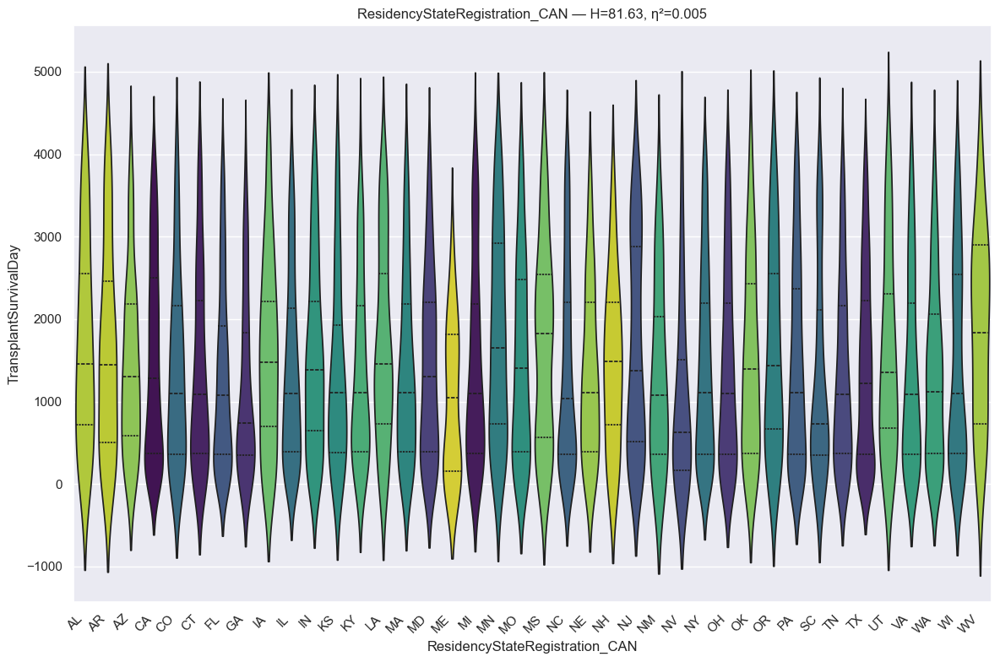

RANKING REPORT: ResidencyStateRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * AL                                                :     68 records
 * AR                                                :     64 records
 * AZ                                                :    125 records
 * CA                                                :    882 records
 * CO                                                :     99 records
 * CT                                                :    144 records
 * FL                                                :    520 records
 * GA                                                :    178 records
 * IA                                                :     87 records
 * IL                                                :    359 records
 * IN                                                :    211 records
 * KS                                                :     88 records
 * KY                                                :    126 records
 * LA        

In [23]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [24]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: ResidencyStateRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * AL                                                :     68 records
 * AR                                                :     64 records
 * AZ                                                :    125 records
 * CA                                                :    882 records
 * CO                                                :     99 records
 * CT                                                :    144 records
 * FL                                                :    520 records
 * GA                                                :    178 records
 * IA                                                :     87 records
 * IL                                                :    359 records
 * IN                                                :    211 records
 * KS                                                :     88 records
 * KY                                                :    126 records
 * LA        

In [25]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Education Level

In [26]:
# info
feature = u.get_feature_info(df, 'EducationLevel', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                   count unique                        top  freq
EducationLevel_CAN  8064      7  HIGH SCHOOL (9-12) or GED  2857

:::: NaN Count:
EducationLevel_CAN    0 



{'EducationLevel_CAN': CategoricalDtype(categories=['ASSOCIATE/BACHELOR DEGREE',
                   'ATTENDED COLLEGE/TECHNICAL SCHOOL', 'GRADE SCHOOL (0-8)',
                   'HIGH SCHOOL (9-12) or GED', 'NONE',
                   'POST-COLLEGE GRADUATE DEGREE', 'Unknown'],
 , ordered=False, categories_dtype=str)}

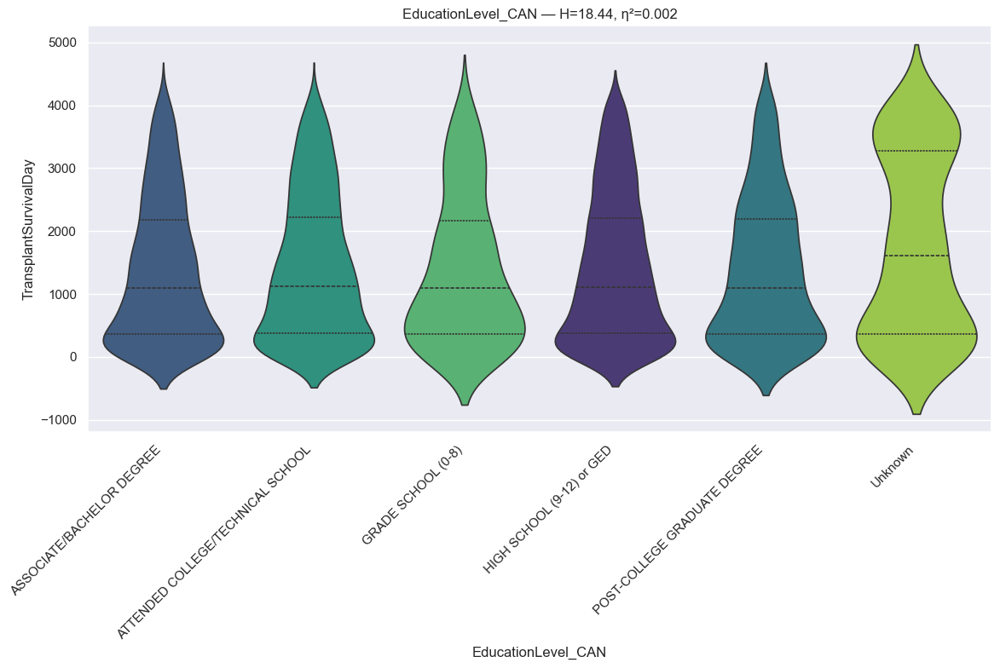

RANKING REPORT: EducationLevel_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ASSOCIATE/BACHELOR DEGREE                         :   1747 records
 * ATTENDED COLLEGE/TECHNICAL SCHOOL                 :   2190 records
 * GRADE SCHOOL (0-8)                                :    255 records
 * HIGH SCHOOL (9-12) or GED                         :   2857 records
 * POST-COLLEGE GRADUATE DEGREE                      :    695 records
 * Unknown                                           :    303 records
BYPASSED CATEGORIES (n < min_n):
 * NONE                                              :     17 records
--------------------------------------------------------------------------------
Kruskal H: 18.4401 | P-value: 2.442488e-03 | Effect η²: 0.0017
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0033 | r_threshold: 0.10)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::

In [27]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": True,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [28]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: EducationLevel_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ASSOCIATE/BACHELOR DEGREE                         :   1747 records
 * ATTENDED COLLEGE/TECHNICAL SCHOOL                 :   2190 records
 * GRADE SCHOOL (0-8)                                :    255 records
 * HIGH SCHOOL (9-12) or GED                         :   2857 records
 * POST-COLLEGE GRADUATE DEGREE                      :    695 records
 * Unknown                                           :    303 records
BYPASSED CATEGORIES (n < min_n):
 * NONE                                              :     17 records
--------------------------------------------------------------------------------
Kruskal H: 18.4401 | P-value: 2.442488e-03 | Effect η²: 0.0017
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') ::

In [29]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life-Support Registration ECMO
* ECMO (Extracorporeal Membrane Oxygenation) serves as a critical, increasingly used "bridge" to heart transplantation or ventricular assist devices (LVAD) for patients in severe cardiogenic shock. The Extracorporeal Life Support Organization (ELSO) Registry tracks these cases, which have shown growing utilization—up to 22.2% in 2019—with high-risk patients often bridged to transplant within 24 hours of admission for best outcomes.

In [30]:
# info
feature = u.get_feature_info(df, 'LifeSupportRegistration_ECMO_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                 count unique top  freq
LifeSupportRegistration_ECMO_CAN  8064      2  No  7913

:::: NaN Count:
LifeSupportRegistration_ECMO_CAN    0 



{'LifeSupportRegistration_ECMO_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

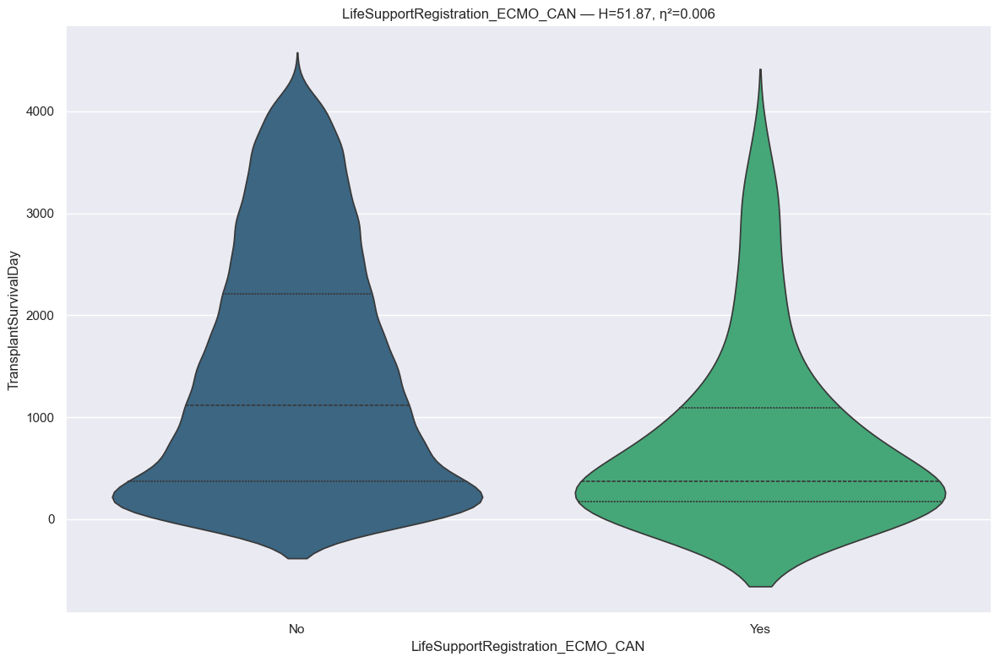

RANKING REPORT: LifeSupportRegistration_ECMO_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7913 records
 * Yes                                               :    151 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 51.8697 | P-value: 5.930821e-13 | Effect η²: 0.0063
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.9316e-13 | thr=0.0500 | r=-0.342 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

LifeSupportRegistration_ECMO_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
               

In [31]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [32]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Registration IABP
* The Intra-Aortic Balloon Pump (IABP) is a widely used mechanical circulatory support (MCS) device, particularly as a temporary bridge to heart transplantation (BTT) for patients in cardiogenic shock. Since the October 2018 UNOS/OPTN policy change in the U.S., the use of IABP in this context has increased more than threefold, improving waitlist outcomes with comparable post-transplant survival.

In [33]:
# info
feature = u.get_feature_info(df, 'LifeSupportRegistration_IABP', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                 count unique top  freq
LifeSupportRegistration_IABP_CAN  8064      2  No  7446

:::: NaN Count:
LifeSupportRegistration_IABP_CAN    0 



{'LifeSupportRegistration_IABP_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

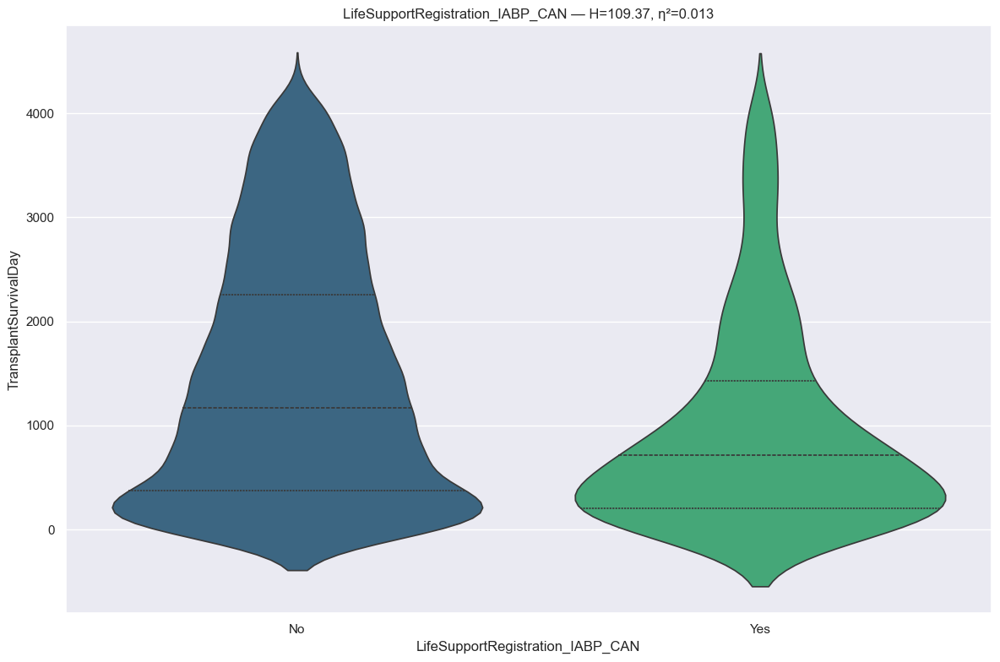

RANKING REPORT: LifeSupportRegistration_IABP_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7446 records
 * Yes                                               :    618 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 109.3726 | P-value: 1.344773e-25 | Effect η²: 0.0134
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.3449e-25 | thr=0.0500 | r=-0.253 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

LifeSupportRegistration_IABP_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
              

In [34]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [35]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Inhaled
* Inhaled therapies, particularly inhaled Nitric Oxide (iNO), are used during and after heart transplantation to treat pulmonary hypertension and right ventricular dysfunction. They act as selective pulmonary vasodilators, improving graft function and reducing ischemia-reperfusion injury. Life support systems, such as ECMO (extracorporeal membrane oxygenation), may also be used in cases of early graft failure.

In [36]:
# info
feature = u.get_feature_info(df, 'LifeSupportInhaled_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique top  freq
LifeSupportInhaled_CAN  8064      2  No  8047

:::: NaN Count:
LifeSupportInhaled_CAN    0 



{'LifeSupportInhaled_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

In [37]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for LifeSupportInhaled_CAN
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

LifeSupportInhaled_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                    No         1424.314154                1112.0                 4195.0                    0.0          8047
                   Yes         1365.705882                1044.0                 3260.0                    1.0            17


In [38]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Inotropes IV Registration
* Intravenous (IV) inotropes, such as milrinone or dobutamine, are critical bridge-to-transplant therapies used to stabilize patients with advanced heart failure. They are frequently used to support patients listed for heart transplants, with studies showing 55 out of 60 patients maintained on inotropes successfully until transplantation or LVAD

In [39]:
# info
feature = u.get_feature_info(df, 'InotropesIVRegistration_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                            count unique top  freq
InotropesIVRegistration_CAN  8064      2  No  5288

:::: NaN Count:
InotropesIVRegistration_CAN    0 



{'InotropesIVRegistration_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

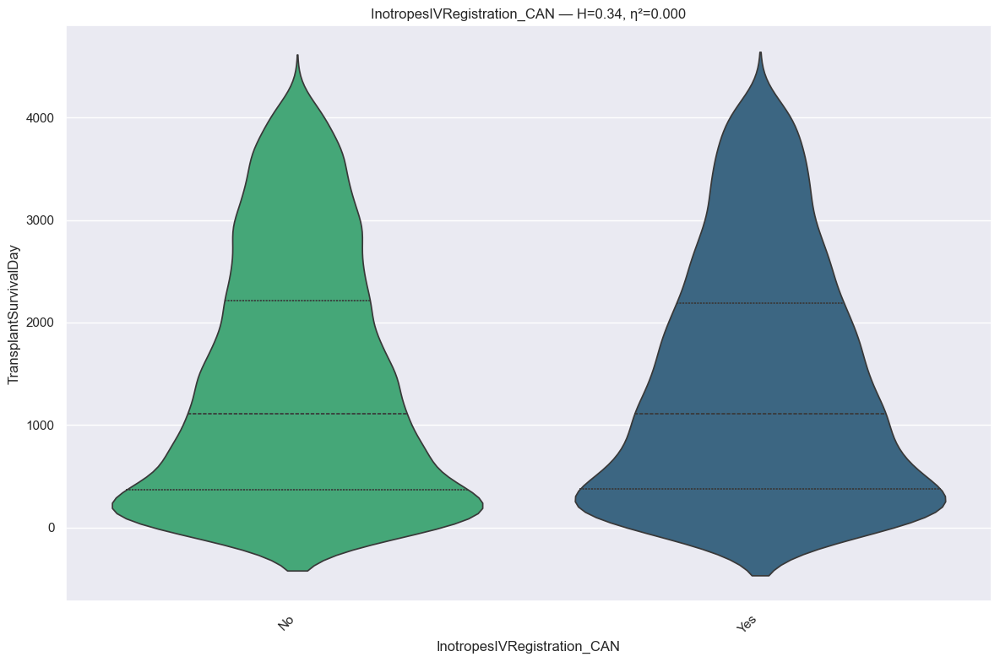

RANKING REPORT: InotropesIVRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   5288 records
 * Yes                                               :   2776 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.3448 | P-value: 5.570674e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.5707e-01 | thr=0.0500 | r= 0.008 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

InotropesIVRegistration_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                         No         1423.361384     

In [40]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [41]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### LifeSupport Registration PGE

In [42]:
# info
feature = u.get_feature_info(df, 'LifeSupportRegistration_PGE', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                count unique top  freq
LifeSupportRegistration_PGE_CAN  8064      2  No  8058

:::: NaN Count:
LifeSupportRegistration_PGE_CAN    0 



{'LifeSupportRegistration_PGE_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

In [43]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for LifeSupportRegistration_PGE_CAN
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

LifeSupportRegistration_PGE_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                             No         1424.208116                1112.0                 4195.0                    0.0          8058
                            Yes         1400.666667                 908.0                 4003.0                    2.0             6


In [44]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Life Support Mechanism Registration OTHER

In [45]:
# info
feature = u.get_feature_info(df, 'LifeSupportMechanismRegistration_OTHER', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                           count unique top  freq
LifeSupportMechanismRegistration_OTHER_CAN  8064      2  No  7736

:::: NaN Count:
LifeSupportMechanismRegistration_OTHER_CAN    0 



{'LifeSupportMechanismRegistration_OTHER_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

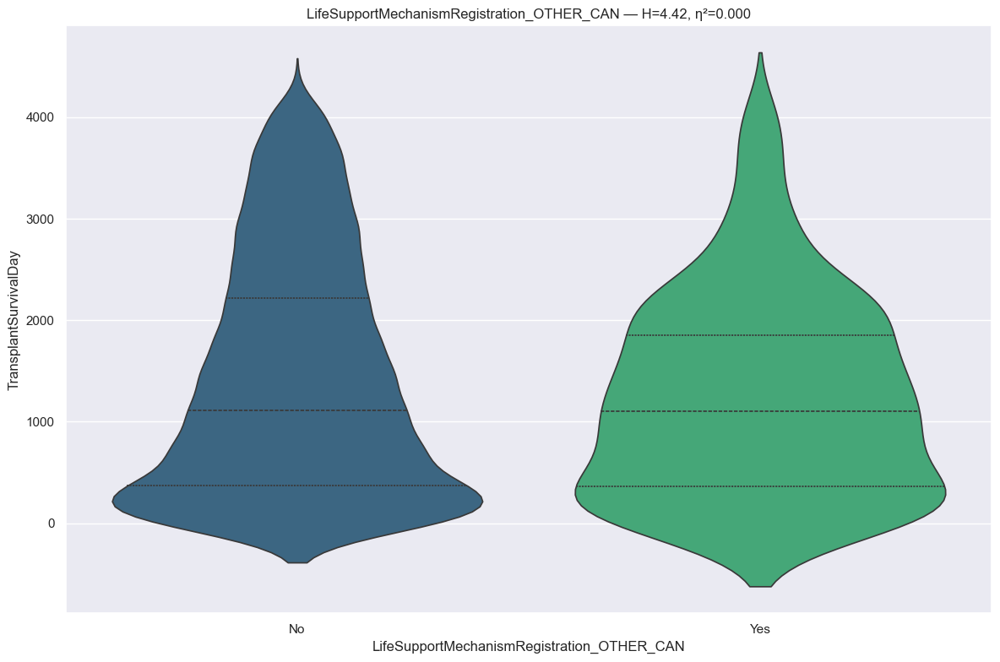

RANKING REPORT: LifeSupportMechanismRegistration_OTHER_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7736 records
 * Yes                                               :    328 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 4.4206 | P-value: 3.550841e-02 | Effect η²: 0.0004
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=3.5509e-02 | thr=0.0500 | r=-0.068 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

LifeSupportMechanismRegistration_OTHER_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_co

In [46]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [47]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventricular Device Type Registration

In [48]:
# info
feature = u.get_feature_info(df, 'VentricularDeviceTypeRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                      count unique   top  freq
VentricularDeviceTypeRegistration_CAN  8064      6  None  6341

:::: NaN Count:
VentricularDeviceTypeRegistration_CAN    0 



{'VentricularDeviceTypeRegistration_CAN': CategoricalDtype(categories=['Lvad', 'Lvad+Rvad', 'None', 'Rvad', 'Tah', 'Unknown'], ordered=False, categories_dtype=str)}

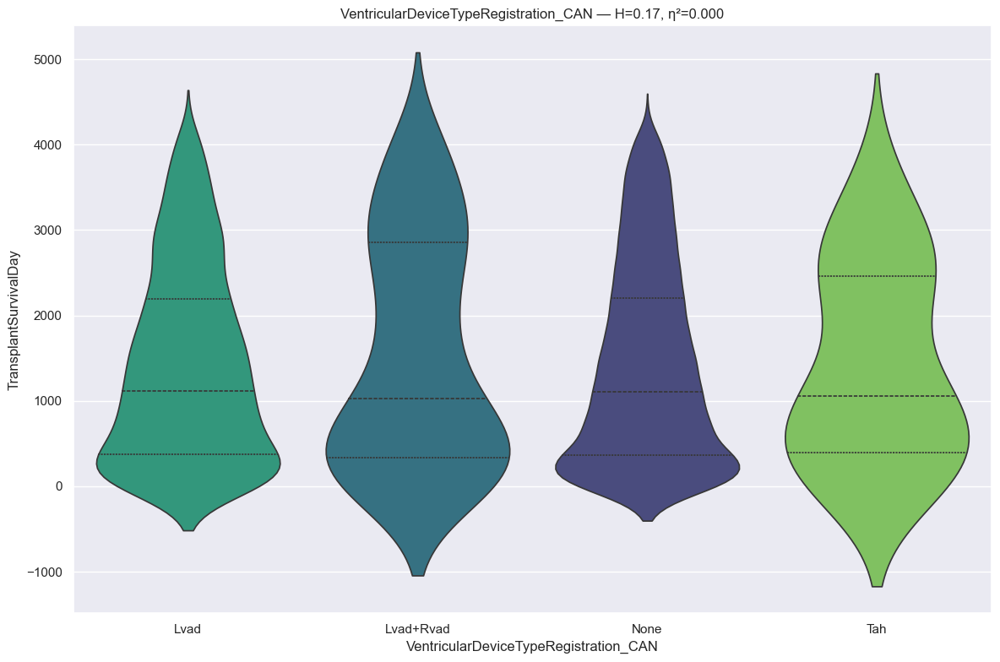

RANKING REPORT: VentricularDeviceTypeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Lvad                                              :   1573 records
 * Lvad+Rvad                                         :    107 records
 * None                                              :   6341 records
 * Tah                                               :     31 records
BYPASSED CATEGORIES (n < min_n):
 * Rvad                                              :      8 records
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 0.1654 | P-value: 9.829777e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Lvad         vs Lvad+Rvad    | p=7.2410e-01 | thr=0.0083 | r= 0.020 | Not Sig
Lvad         vs None         | p=7.6299e-01 | thr=0.0083 | r= 0.005

In [49]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [50]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: VentricularDeviceTypeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Lvad                                              :   1573 records
 * Lvad+Rvad                                         :    107 records
 * None                                              :   6341 records
 * Tah                                               :     31 records
BYPASSED CATEGORIES (n < min_n):
 * Rvad                                              :      8 records
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 0.1654 | P-value: 9.829777e-01 | Effect η²: 0.0000
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORI

In [51]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival due to an extremely small sample size.

#### Ventricular Device Brand Registration

In [52]:
# info
feature = u.get_feature_info(df, 'VentricularDeviceBrandRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                       count unique      top  freq
VentricularDeviceBrandRegistration_CAN  8064     22  Unknown  6345

:::: NaN Count:
VentricularDeviceBrandRegistration_CAN    0 



{'VentricularDeviceBrandRegistration_CAN': CategoricalDtype(categories=['Abiomed AB5000', 'Abiomed BVS 5000', 'Berlin Heart EXCOR',
                   'Biomedicus', 'Cardiac Assist Protek Duo',
                   'Cardiac Assist Tandem Heart',
                   'CentriMag (Thoratec/Levitronix)', 'Evaheart',
                   'HeartMate III', 'Heartmate II', 'Heartmate XVE',
                   'Heartsaver VAD', 'Heartware HVAD', 'Impella CP',
                   'Impella RP', 'Impella Recover 2.5', 'Impella Recover 5.0',
                   'Jarvik 2000', 'Maquet Jostra Rotaflow', 'Other, Specify',
                   'SynCardia CardioWest', 'Terumo DuraHeart', 'Thoratec',
                   'Thoratec IVAD', 'Thoratec PVAD', 'Toyobo', 'Unknown',
                   'Ventracor VentrAssist'],
 , ordered=False, categories_dtype=str)}

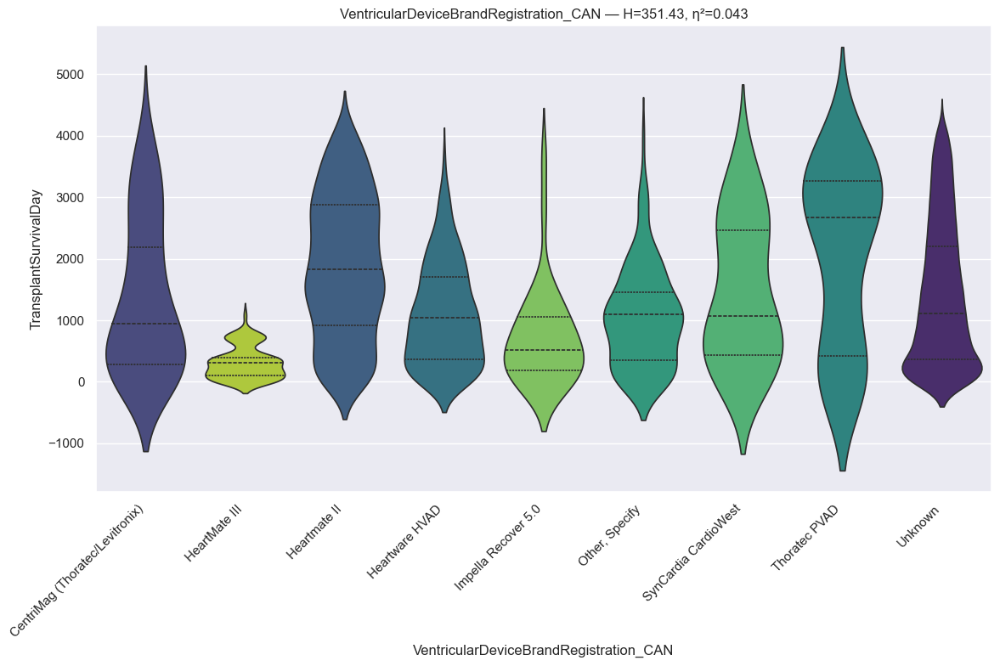

RANKING REPORT: VentricularDeviceBrandRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CentriMag (Thoratec/Levitronix)                   :     50 records
 * HeartMate III                                     :    170 records
 * Heartmate II                                      :    798 records
 * Heartware HVAD                                    :    421 records
 * Impella Recover 5.0                               :     32 records
 * Other, Specify                                    :    127 records
 * SynCardia CardioWest                              :     30 records
 * Thoratec PVAD                                     :     30 records
 * Unknown                                           :   6345 records
BYPASSED CATEGORIES (n < min_n):
 * Abiomed AB5000                                    :      5 records
 * Abiomed BVS 5000                                  :      1 records
 * Biomedicus                                        :      1 records
 * Cardiac Assist Protek Duo              

In [53]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [54]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: VentricularDeviceBrandRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CentriMag (Thoratec/Levitronix)                   :     50 records
 * HeartMate III                                     :    170 records
 * Heartmate II                                      :    798 records
 * Heartware HVAD                                    :    421 records
 * Impella Recover 5.0                               :     32 records
 * Other, Specify                                    :    127 records
 * SynCardia CardioWest                              :     30 records
 * Thoratec PVAD                                     :     30 records
 * Unknown                                           :   6345 records
BYPASSED CATEGORIES (n < min_n):
 * Abiomed AB5000                                    :      5 records
 * Abiomed BVS 5000                                  :      1 records
 * Biomedicus                                        :      1 records
 * Cardiac Assist Protek Duo              

In [55]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Primary Payment Registration

In [56]:
# info
feature = u.get_feature_info(df, 'PrimaryPaymentRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                               count unique                top  freq
PrimaryPaymentRegistration_CAN  8064     12  Private insurance  4216

:::: NaN Count:
PrimaryPaymentRegistration_CAN    0 



{'PrimaryPaymentRegistration_CAN': CategoricalDtype(categories=['Donation', 'Foreign Government Specify', 'Free Care',
                   'Missing', 'Pending', 'Private insurance',
                   'Public insurance - CHIP (Children's Health Insurance Program)',
                   'Public insurance - Department of VA',
                   'Public insurance - Medicaid',
                   'Public insurance - Medicare & Choice',
                   'Public insurance - Medicare (further detail not collected)',
                   'Public insurance - Medicare FFS (Fee for Service)',
                   'Public insurance - Other government', 'Self'],
 , ordered=False, categories_dtype=str)}

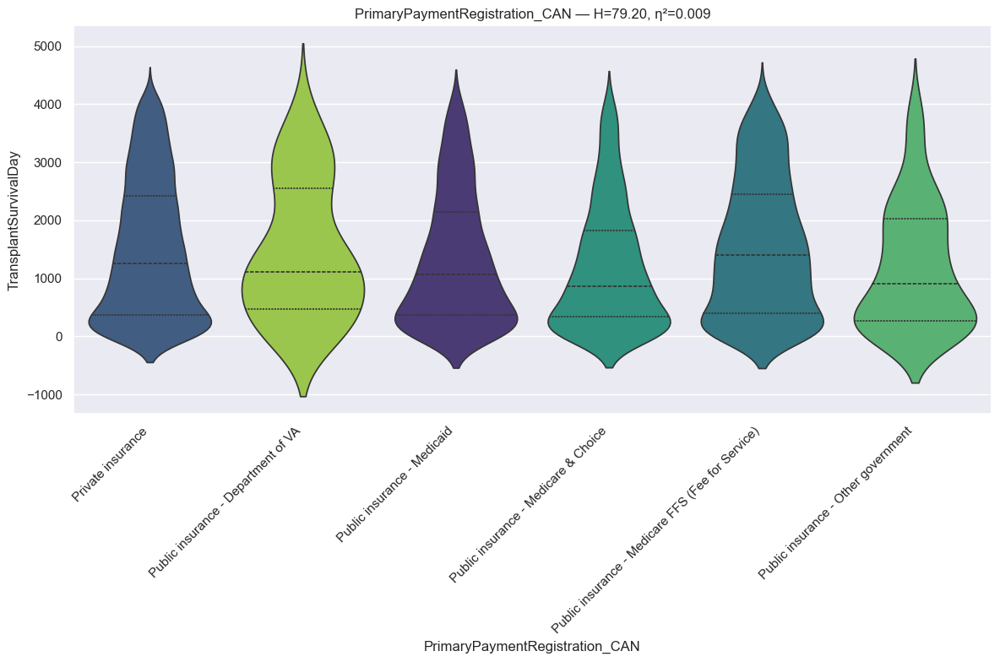

RANKING REPORT: PrimaryPaymentRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Private insurance                                 :   4216 records
 * Public insurance - Department of VA               :     59 records
 * Public insurance - Medicaid                       :   1170 records
 * Public insurance - Medicare & Choice              :   1007 records
 * Public insurance - Medicare FFS (Fee for Service) :   1402 records
 * Public insurance - Other government               :    142 records
BYPASSED CATEGORIES (n < min_n):
 * Foreign Government Specify                        :     22 records
 * Free Care                                         :     11 records
 * Missing                                           :      4 records
 * Pending                                           :      6 records
 * Public insurance - CHIP (Children's Health Insurance Program):      7 records
 * Self                                              :     18 records
---------------------------------------

In [57]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [58]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PrimaryPaymentRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Private insurance                                 :   4216 records
 * Public insurance - Department of VA               :     59 records
 * Public insurance - Medicaid                       :   1170 records
 * Public insurance - Medicare & Choice              :   1007 records
 * Public insurance - Medicare FFS (Fee for Service) :   1402 records
 * Public insurance - Other government               :    142 records
BYPASSED CATEGORIES (n < min_n):
 * Foreign Government Specify                        :     22 records
 * Free Care                                         :     11 records
 * Missing                                           :      4 records
 * Pending                                           :      6 records
 * Public insurance - CHIP (Children's Health Insurance Program):      7 records
 * Self                                              :     18 records
---------------------------------------

In [59]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Diagnosis At Listing

In [60]:
# info
feature = u.get_feature_info(df, 'DiagnosisAtListing', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique                           top  freq
DiagnosisAtListing_CAN  8064     36  DILATED MYOPATHY: IDIOPATHIC  2814

:::: NaN Count:
DiagnosisAtListing_CAN    0 



{'DiagnosisAtListing_CAN': CategoricalDtype(categories=['ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY',
                   'CANCER',
                   'CONGENITAL HEART DEFECT - HYPOPLASTIC LEFT HEART SYNDROME - UNOPERATED',
                   'CONGENITAL HEART DEFECT - PRIOR SURGERY UNKNOWN',
                   'CONGENITAL HEART DEFECT - WITH SURGERY',
                   'CONGENITAL HEART DEFECT - WITHOUT SURGERY',
                   'CORONARY ARTERY DISEASE',
                   'COVID-19: DILATED MYOPATHY: ACTIVE MYOCARDITIS',
                   'COVID-19: DILATED MYOPATHY: HISTORY OF MYOCARDITIS',
                   'DILATED MYOPATHY: ADRIAMYCIN',
                   'DILATED MYOPATHY: ALCOHOLIC', 'DILATED MYOPATHY: FAMILIAL',
                   'DILATED MYOPATHY: IDIOPATHIC', 'DILATED MYOPATHY: ISCHEMIC',
                   'DILATED MYOPATHY: MYOCARDITIS',
                   'DILATED MYOPATHY: OTHER SPECIFY',
                   'DILATED MYOPATHY: POST PARTUM', 'DILATED

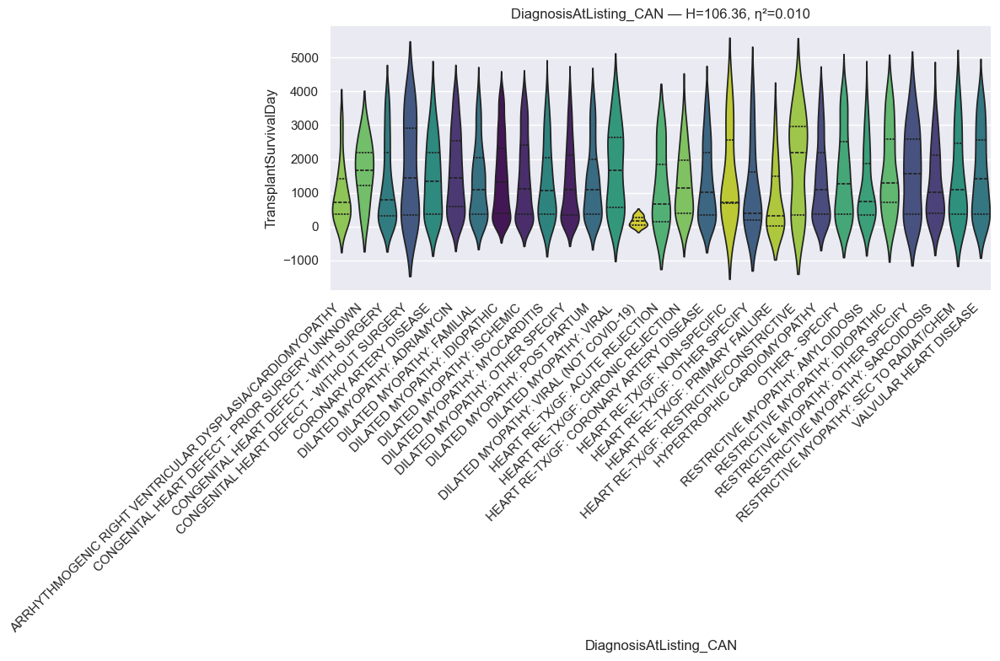

RANKING REPORT: DiagnosisAtListing_CAN (n ≥ 10)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:     57 records
 * CONGENITAL HEART DEFECT - PRIOR SURGERY UNKNOWN   :     10 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    364 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     29 records
 * CORONARY ARTERY DISEASE                           :    111 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    346 records
 * DILATED MYOPATHY: FAMILIAL                        :    357 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   2814 records
 * DILATED MYOPATHY: ISCHEMIC                        :   1203 records
 * DILATED MYOPATHY: MYOCARDITIS                     :     97 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :    790 records
 * DILATED MYOPATHY: POST PARTUM                     :    375 records
 * DILATED MYOPATHY: VIRAL                           :     76 records
 * DILATED MYO

In [61]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45,
    "min_n": 10
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [62]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: DiagnosisAtListing_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:     57 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    364 records
 * CORONARY ARTERY DISEASE                           :    111 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    346 records
 * DILATED MYOPATHY: FAMILIAL                        :    357 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   2814 records
 * DILATED MYOPATHY: ISCHEMIC                        :   1203 records
 * DILATED MYOPATHY: MYOCARDITIS                     :     97 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :    790 records
 * DILATED MYOPATHY: POST PARTUM                     :    375 records
 * DILATED MYOPATHY: VIRAL                           :     76 records
 * HEART RE-TX/GF: CHRONIC REJECTION                 :     47 records
 * HEART RE-TX/GF: CORONARY ARTERY DISEASE           :    221 records
 * HEART RE-TX

In [63]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Diabetes Type

In [64]:
# info
feature = u.get_feature_info(df, 'DiabetesType_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique top  freq
DiabetesType_CAN  8064      7  No  6155

:::: NaN Count:
DiabetesType_CAN    0 



{'DiabetesType_CAN': CategoricalDtype(categories=['Diabetes Status Unknown', 'No', 'Type I', 'Type II',
                   'Type Other', 'Type Unknown', 'Unknown'],
 , ordered=False, categories_dtype=str)}

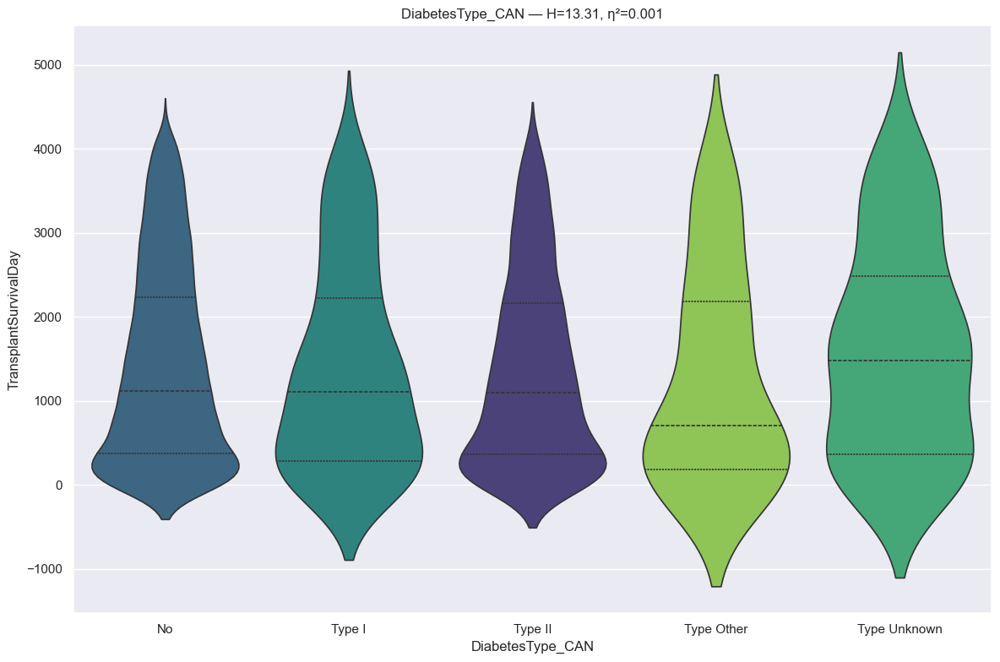

RANKING REPORT: DiabetesType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6155 records
 * Type I                                            :    136 records
 * Type II                                           :   1668 records
 * Type Other                                        :     38 records
 * Type Unknown                                      :     58 records
BYPASSED CATEGORIES (n < min_n):
 * Diabetes Status Unknown                           :      5 records
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 13.3121 | P-value: 9.847413e-03 | Effect η²: 0.0012
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0050 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Type II      | p=1.0199e-03 | thr=0.0050 | r=-0.052 | *Sig*
Type II      vs Typ

In [65]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [66]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: DiabetesType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6155 records
 * Type I                                            :    136 records
 * Type II                                           :   1668 records
 * Type Other                                        :     38 records
 * Type Unknown                                      :     58 records
BYPASSED CATEGORIES (n < min_n):
 * Diabetes Status Unknown                           :      5 records
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 13.3121 | P-value: 9.847413e-03 | Effect η²: 0.0012
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') ::::

In [67]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Dialysis Type Registration

In [68]:
# info
feature = u.get_feature_info(df, 'DialysisTypeRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                             count unique          top  freq
DialysisTypeRegistration_CAN  8064      6  No dialysis  7863

:::: NaN Count:
DialysisTypeRegistration_CAN    0 



{'DialysisTypeRegistration_CAN': CategoricalDtype(categories=['Dialysis - Unknown Type was performed',
                   'Dialysis Status Unknown', 'Hemodialysis', 'No dialysis',
                   'Peritoneal Dialysis', 'Unknown'],
 , ordered=False, categories_dtype=str)}

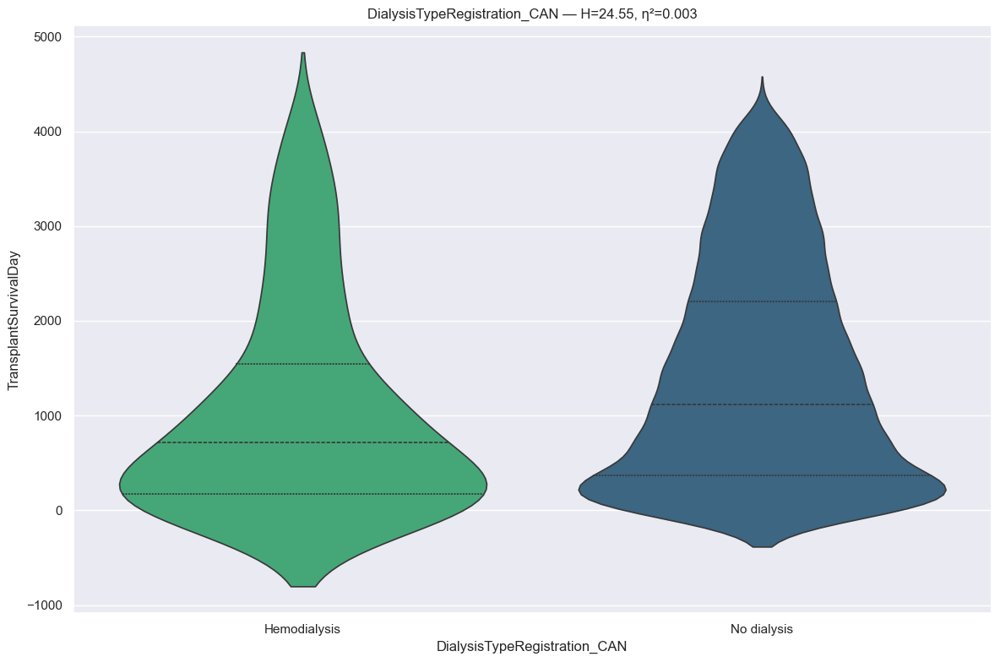

RANKING REPORT: DialysisTypeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Hemodialysis                                      :    172 records
 * No dialysis                                       :   7863 records
BYPASSED CATEGORIES (n < min_n):
 * Dialysis - Unknown Type was performed             :      5 records
 * Dialysis Status Unknown                           :      2 records
 * Peritoneal Dialysis                               :     18 records
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 24.5542 | P-value: 7.224719e-07 | Effect η²: 0.0029
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Hemodialysis vs No dialysis  | p=7.2253e-07 | thr=0.0500 | r= 0.221 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

::::::::::::::::::::

In [69]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [70]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: DialysisTypeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Hemodialysis                                      :    172 records
 * No dialysis                                       :   7863 records
BYPASSED CATEGORIES (n < min_n):
 * Dialysis - Unknown Type was performed             :      5 records
 * Dialysis Status Unknown                           :      2 records
 * Peritoneal Dialysis                               :     18 records
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 24.5542 | P-value: 7.224719e-07 | Effect η²: 0.0029
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::

In [71]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Cerebro Vascular Disease

In [72]:
# info
feature = u.get_feature_info(df, 'CerebroVascularDisease', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                           count unique top  freq
CerebroVascularDisease_CAN  8064      3  No  7520

:::: NaN Count:
CerebroVascularDisease_CAN    0 



{'CerebroVascularDisease_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

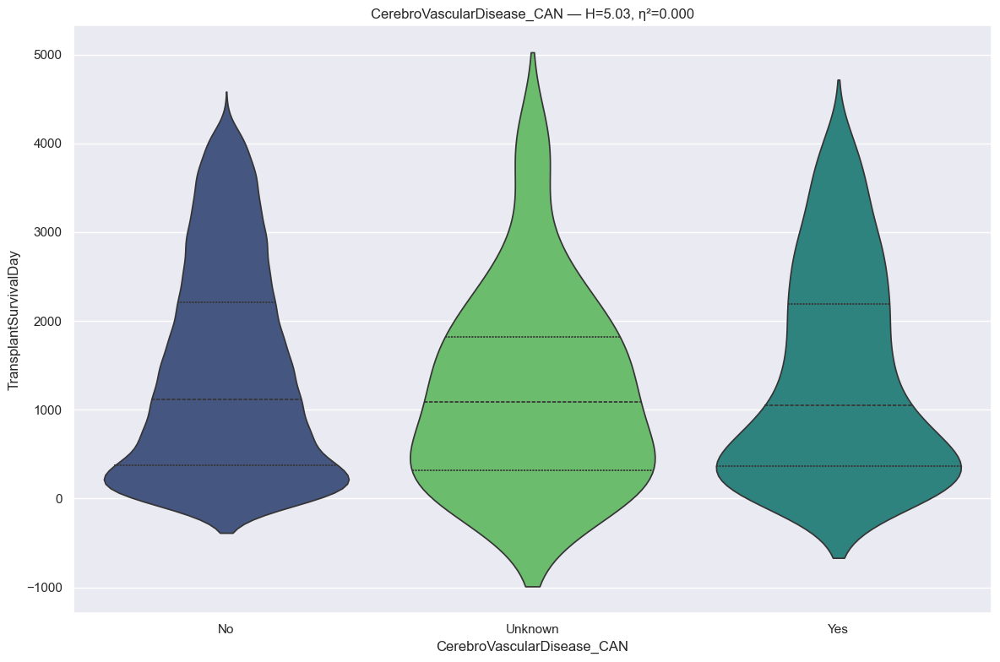

RANKING REPORT: CerebroVascularDisease_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7520 records
 * Unknown                                           :     48 records
 * Yes                                               :    496 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 5.0343 | P-value: 8.068922e-02 | Effect η²: 0.0004
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=6.1815e-02 | thr=0.0167 | r=-0.050 | Not Sig
No           vs Unknown      | p=2.0060e-01 | thr=0.0167 | r=-0.107 | Not Sig
Unknown      vs Yes          | p=5.0789e-01 | thr=0.0167 | r= 0.058 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::



In [73]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [74]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Previous Malignancy

In [75]:
# info
feature = u.get_feature_info(df, 'PreviousMalignancy', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique top  freq
PreviousMalignancy_CAN  8064      3  No  6978

:::: NaN Count:
PreviousMalignancy_CAN    0 



{'PreviousMalignancy_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

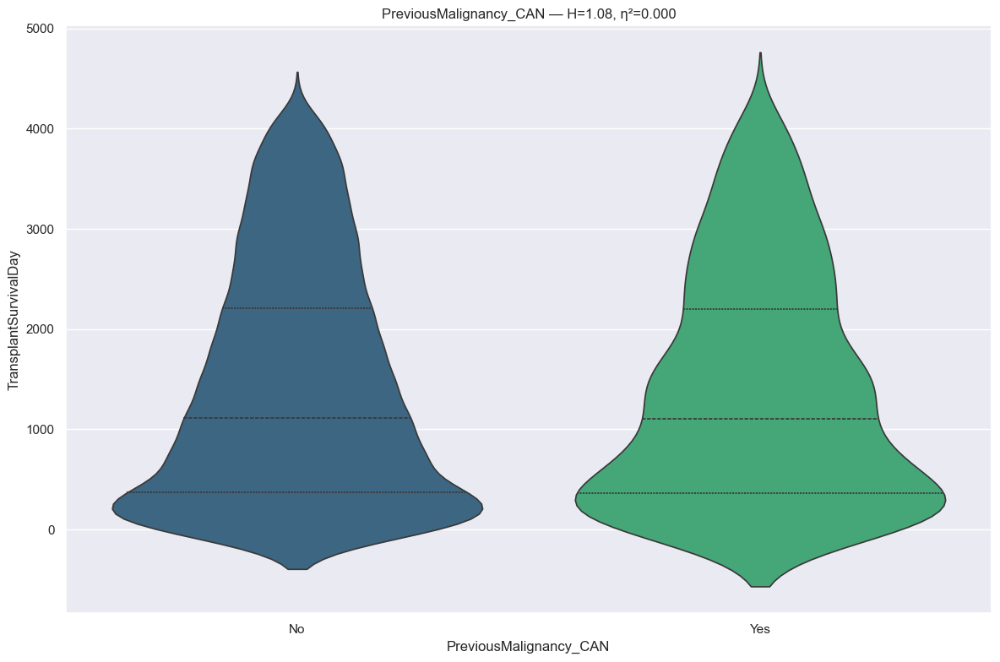

RANKING REPORT: PreviousMalignancy_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6978 records
 * Yes                                               :   1068 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     18 records
--------------------------------------------------------------------------------
Kruskal H: 1.0759 | P-value: 2.996122e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.9962e-01 | thr=0.0500 | r=-0.020 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Other (1 categories)
  - Unknown

PreviousMalignancy_CAN  mean_survival_days  median_survival_days  maximu

In [76]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [77]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PreviousMalignancy_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6978 records
 * Yes                                               :   1068 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     18 records
--------------------------------------------------------------------------------
Kruskal H: 1.0759 | P-value: 2.996122e-01 | Effect η²: 0.0000
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Other (1 categories)
  - Unknown



In [78]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Defibrillator Implant Registration

In [79]:
# info
feature = u.get_feature_info(df, 'DefibrillatorImplantRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                     count unique  top  freq
DefibrillatorImplantRegistration_CAN  8064      3  Yes  5683

:::: NaN Count:
DefibrillatorImplantRegistration_CAN    0 



{'DefibrillatorImplantRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

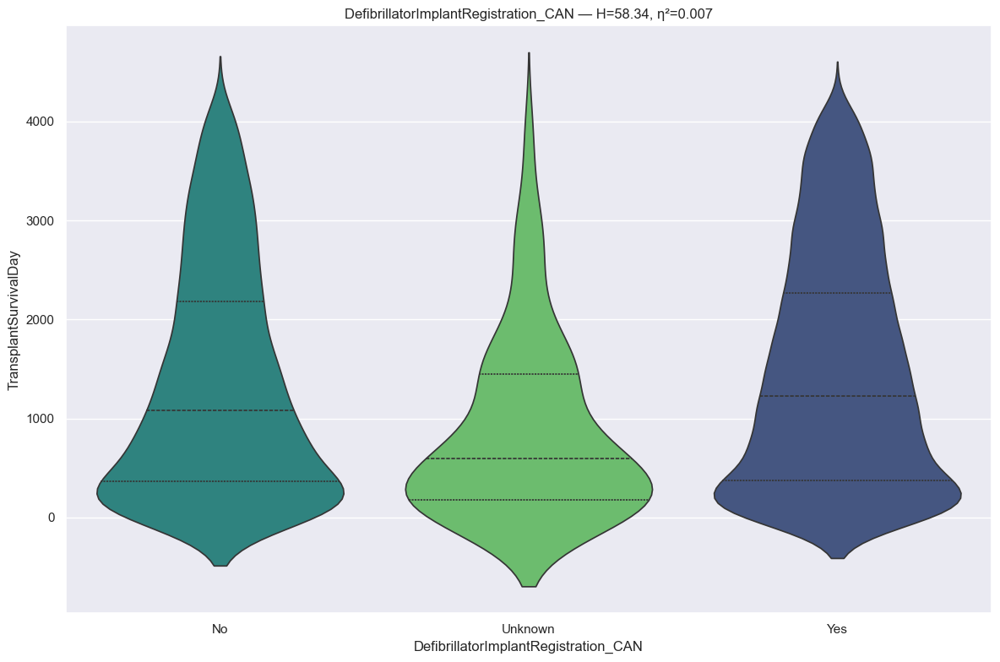

RANKING REPORT: DefibrillatorImplantRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   2265 records
 * Unknown                                           :    116 records
 * Yes                                               :   5683 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 58.3437 | P-value: 2.142004e-13 | Effect η²: 0.0070
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=1.5838e-09 | thr=0.0167 | r= 0.327 | *Sig*
No           vs Yes          | p=3.0512e-07 | thr=0.0167 | r= 0.073 | *Sig*
No           vs Unknown      | p=3.8271e-06 | thr=0.0167 | r=-0.254 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::::::::::

In [80]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [81]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Registration SYS

In [82]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsRegistration_SYS', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                          count unique top  freq
InotropesVasodilatorsRegistration_SYS_CAN  8064      3  No  4496

:::: NaN Count:
InotropesVasodilatorsRegistration_SYS_CAN    0 



{'InotropesVasodilatorsRegistration_SYS_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

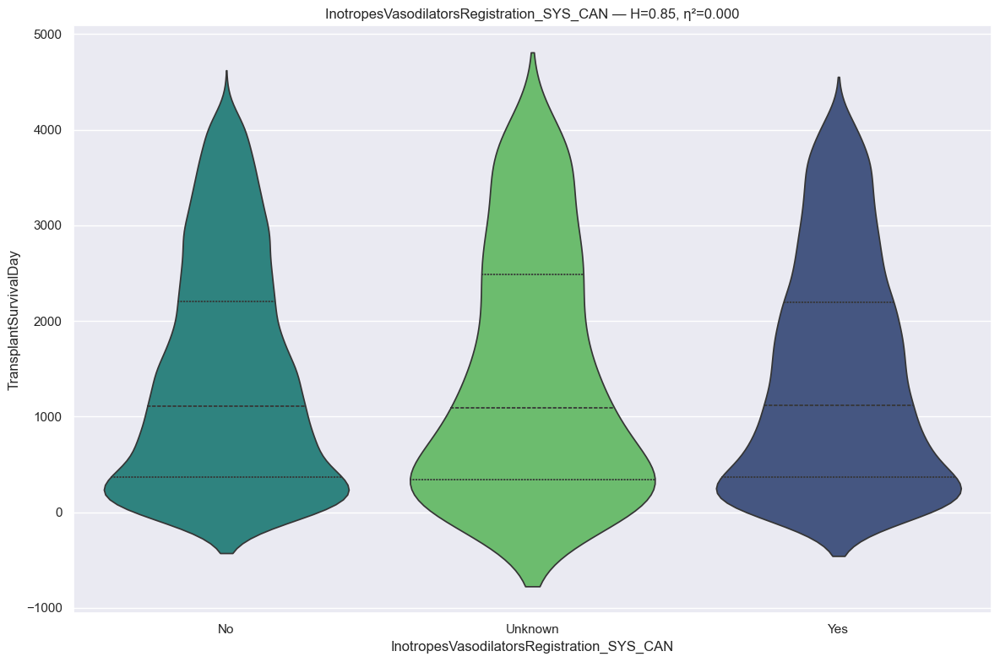

RANKING REPORT: InotropesVasodilatorsRegistration_SYS_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4496 records
 * Unknown                                           :    337 records
 * Yes                                               :   3231 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.8473 | P-value: 6.546429e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=3.6681e-01 | thr=0.0167 | r= 0.030 | Not Sig
No           vs Unknown      | p=3.7875e-01 | thr=0.0167 | r=-0.029 | Not Sig
No           vs Yes          | p=8.7770e-01 | thr=0.0167 | r= 0.002 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::

In [83]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [84]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Inotropes Vasodilators Registration DIA

In [85]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsRegistration_DIA', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                          count unique top  freq
InotropesVasodilatorsRegistration_DIA_CAN  8064      3  No  4494

:::: NaN Count:
InotropesVasodilatorsRegistration_DIA_CAN    0 



{'InotropesVasodilatorsRegistration_DIA_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

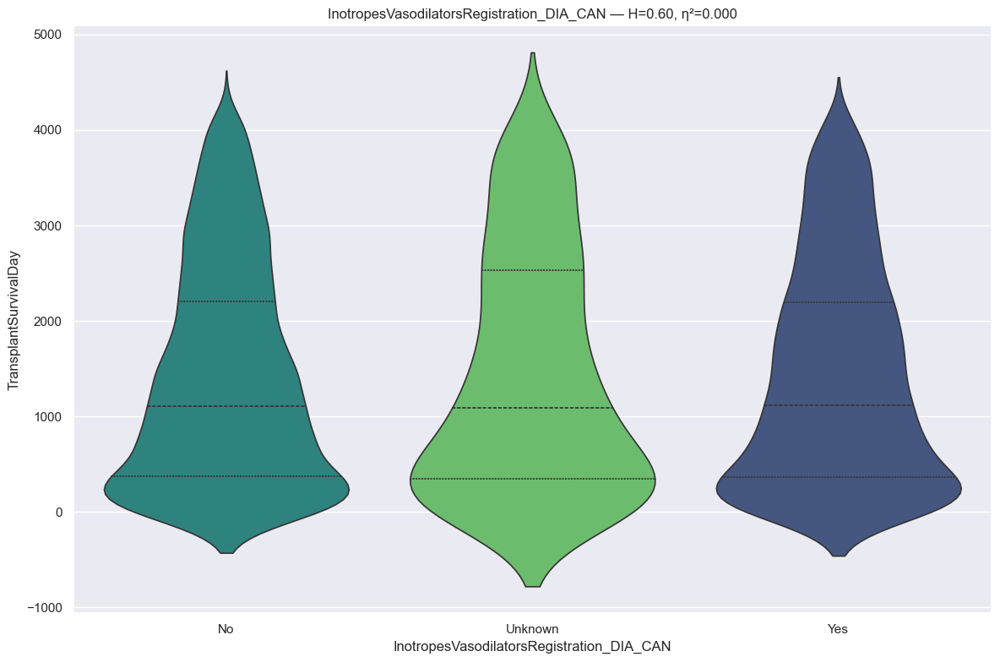

RANKING REPORT: InotropesVasodilatorsRegistration_DIA_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4494 records
 * Unknown                                           :    341 records
 * Yes                                               :   3229 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.6009 | P-value: 7.405027e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=4.4866e-01 | thr=0.0167 | r= 0.025 | Not Sig
No           vs Unknown      | p=4.5882e-01 | thr=0.0167 | r=-0.024 | Not Sig
No           vs Yes          | p=8.9160e-01 | thr=0.0167 | r= 0.002 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::

In [86]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [87]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Inotropes Vasodilators Registratio MN

In [88]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsRegistration_MN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                         count unique top  freq
InotropesVasodilatorsRegistration_MN_CAN  8064      3  No  4484

:::: NaN Count:
InotropesVasodilatorsRegistration_MN_CAN    0 



{'InotropesVasodilatorsRegistration_MN_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

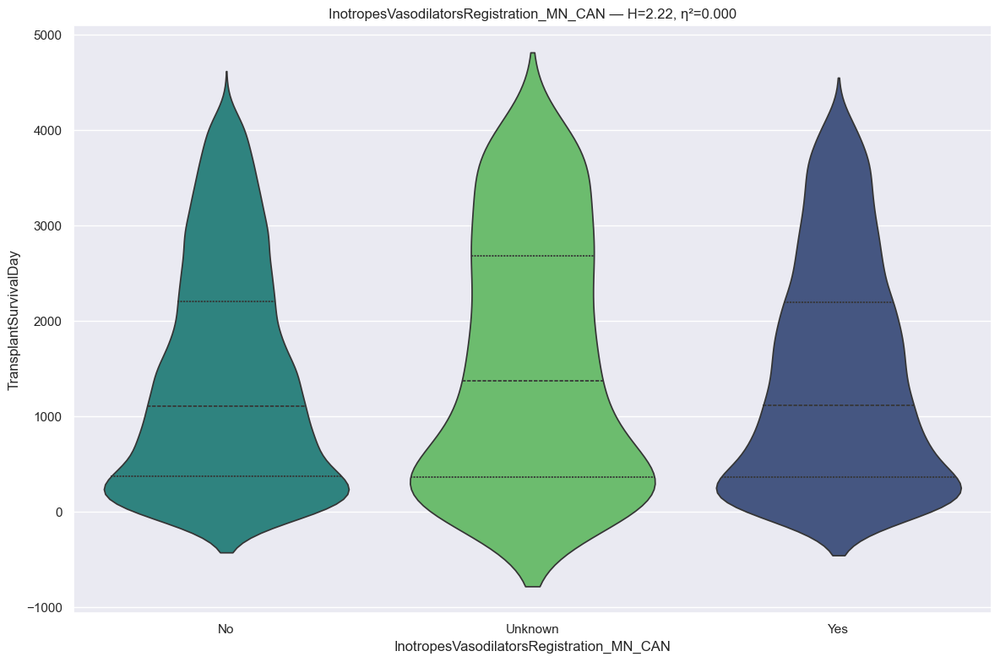

RANKING REPORT: InotropesVasodilatorsRegistration_MN_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4484 records
 * Unknown                                           :    392 records
 * Yes                                               :   3188 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2.2204 | P-value: 3.294895e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=1.3955e-01 | thr=0.0167 | r= 0.045 | Not Sig
Unknown      vs Yes          | p=1.6737e-01 | thr=0.0167 | r=-0.043 | Not Sig
No           vs Yes          | p=8.1152e-01 | thr=0.0167 | r= 0.003 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::

In [89]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [90]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Inotropes Vasodilators Registration PCW

In [91]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsRegistration_PCW', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                          count unique top  freq
InotropesVasodilatorsRegistration_PCW_CAN  8064      3  No  4460

:::: NaN Count:
InotropesVasodilatorsRegistration_PCW_CAN    0 



{'InotropesVasodilatorsRegistration_PCW_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

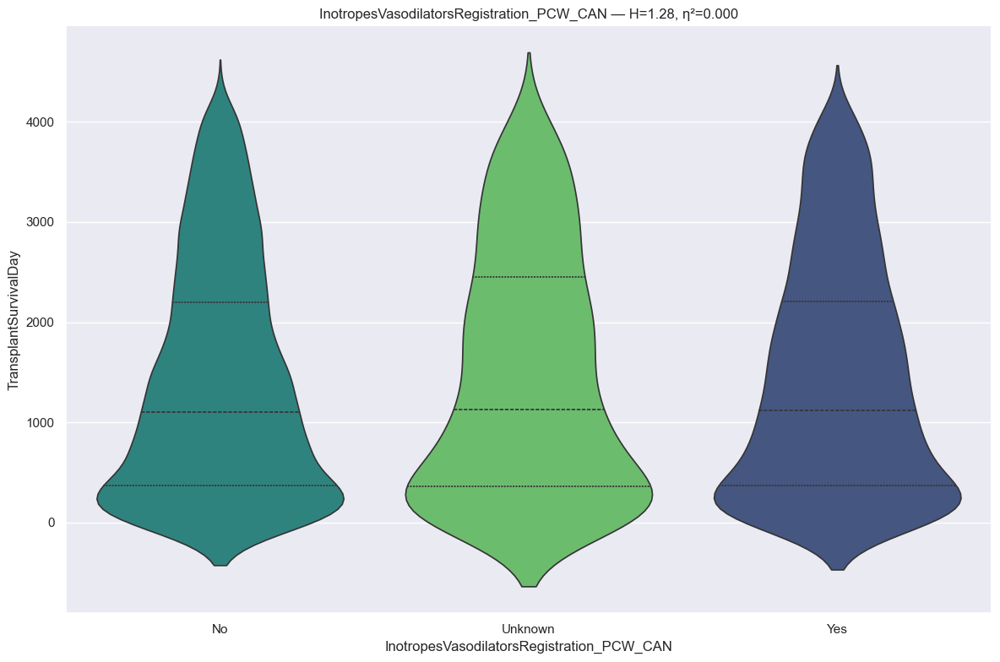

RANKING REPORT: InotropesVasodilatorsRegistration_PCW_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4460 records
 * Unknown                                           :    752 records
 * Yes                                               :   2852 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 1.2805 | P-value: 5.271603e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.5915e-01 | thr=0.0167 | r= 0.016 | Not Sig
No           vs Unknown      | p=6.9139e-01 | thr=0.0167 | r= 0.009 | Not Sig
Unknown      vs Yes          | p=8.1471e-01 | thr=0.0167 | r= 0.006 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::

In [92]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [93]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Inotropes Vasodilators Registration CO

In [94]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsRegistration_CO', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                         count unique top  freq
InotropesVasodilatorsRegistration_CO_CAN  8064      3  No  4424

:::: NaN Count:
InotropesVasodilatorsRegistration_CO_CAN    0 



{'InotropesVasodilatorsRegistration_CO_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

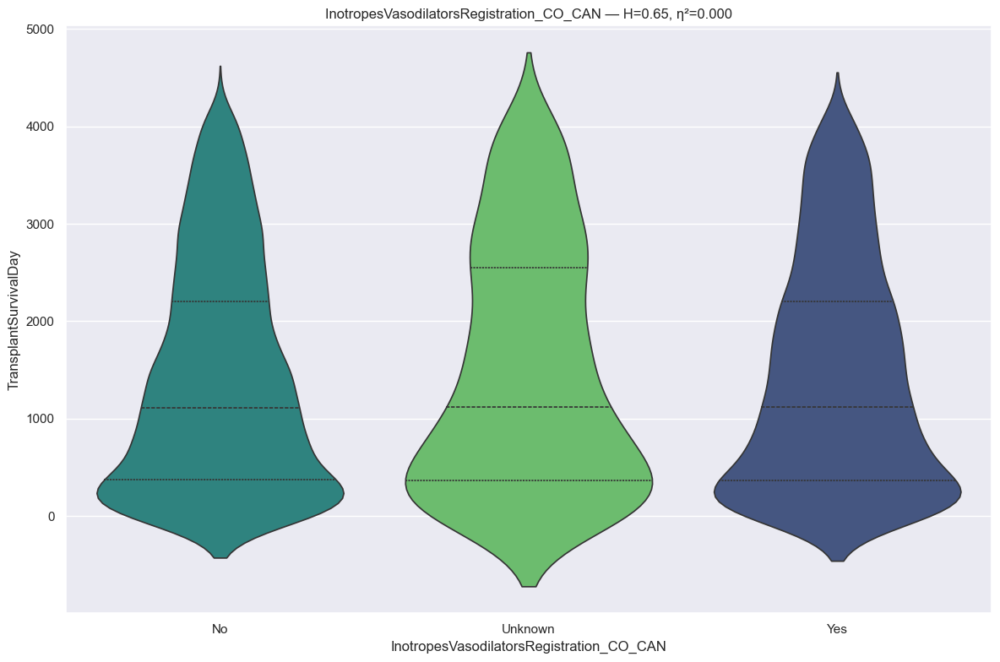

RANKING REPORT: InotropesVasodilatorsRegistration_CO_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4424 records
 * Unknown                                           :    480 records
 * Yes                                               :   3160 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.6548 | P-value: 7.207855e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.2697e-01 | thr=0.0167 | r= 0.009 | Not Sig
No           vs Unknown      | p=5.4114e-01 | thr=0.0167 | r= 0.017 | Not Sig
Unknown      vs Yes          | p=7.3514e-01 | thr=0.0167 | r=-0.010 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::

In [95]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [96]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Cigarette Use

In [97]:
# info
feature = u.get_feature_info(df, 'CigaretteUse', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                 count unique top  freq
CigaretteUse_CAN  8064      3  No  5349

:::: NaN Count:
CigaretteUse_CAN    0 



{'CigaretteUse_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

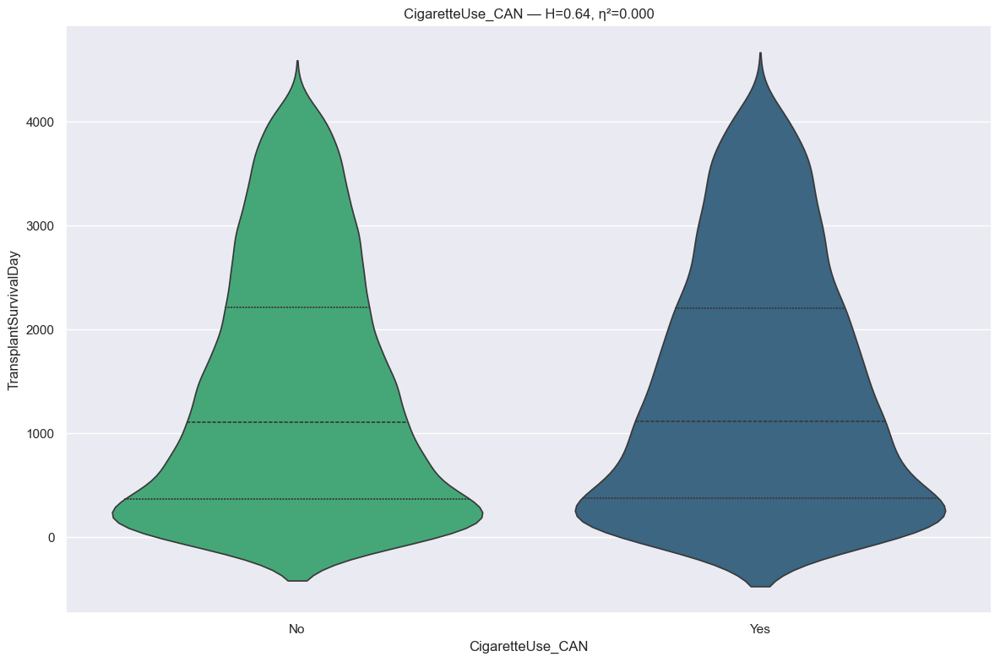

RANKING REPORT: CigaretteUse_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   5349 records
 * Yes                                               :   2710 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      5 records
--------------------------------------------------------------------------------
Kruskal H: 0.6393 | P-value: 4.239499e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=4.2395e-01 | thr=0.0500 | r= 0.011 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Other (1 categories)
  - Unknown

CigaretteUse_CAN  mean_survival_days  median_survival_days  maximum_survival_d

In [98]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [99]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival, including the unknown sample size, which is extremely small.

#### Cigarette Abstinence

In [100]:
# info
feature = u.get_feature_info(df, 'CigaretteAbstinence', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique      top  freq
CigaretteAbstinence_CAN  8064     10  Unknown  5354

:::: NaN Count:
CigaretteAbstinence_CAN    0 



{'CigaretteAbstinence_CAN': CategoricalDtype(categories=['0-2 months', '13-24 months', '25-36 months', '3-12 months',
                   '37-48 months', '49-60 months', '>60 months',
                   'Continues to smoke', 'Unknown', 'Unknown duration'],
 , ordered=False, categories_dtype=str)}

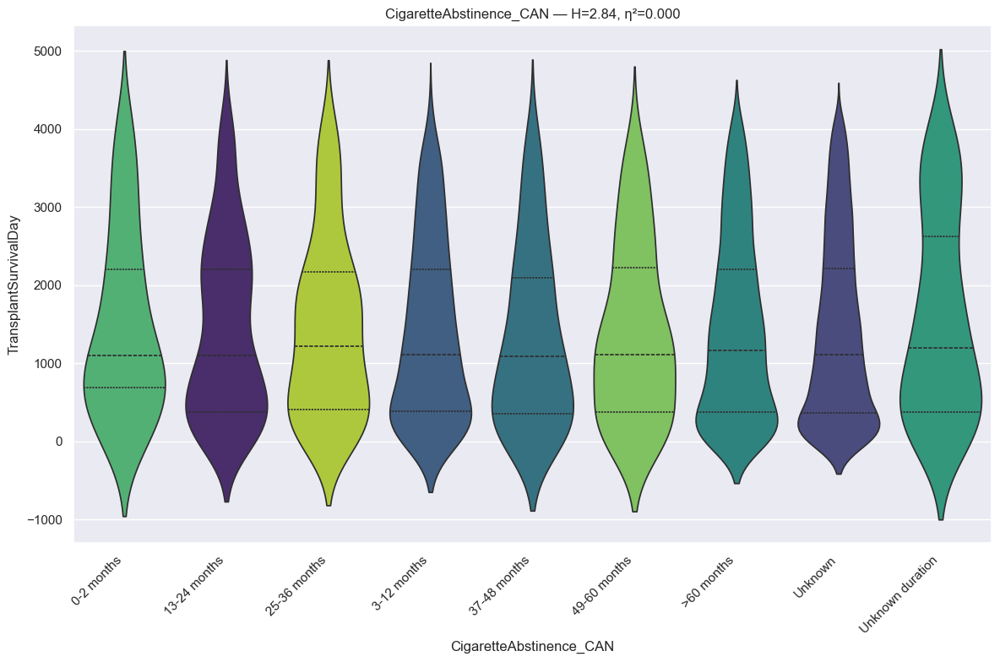

RANKING REPORT: CigaretteAbstinence_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0-2 months                                        :     87 records
 * 13-24 months                                      :    225 records
 * 25-36 months                                      :    160 records
 * 3-12 months                                       :    478 records
 * 37-48 months                                      :     98 records
 * 49-60 months                                      :     86 records
 * >60 months                                        :   1449 records
 * Unknown                                           :   5354 records
 * Unknown duration                                  :    112 records
BYPASSED CATEGORIES (n < min_n):
 * Continues to smoke                                :     15 records
--------------------------------------------------------------------------------
Kruskal H: 2.8430 | P-value: 9.438176e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonfer

In [101]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [102]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Prior Cardiac Surgery

In [103]:
# info
feature = u.get_feature_info(df, 'PriorCardiacSurgery_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique top  freq
PriorCardiacSurgery_CAN  8064      3  No  5156

:::: NaN Count:
PriorCardiacSurgery_CAN    0 



{'PriorCardiacSurgery_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

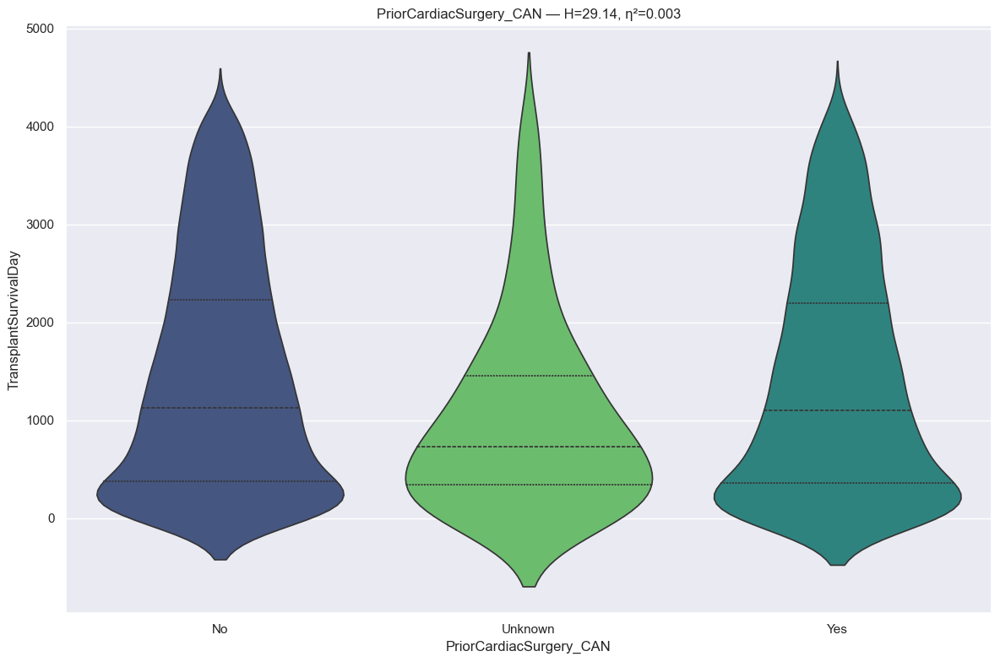

RANKING REPORT: PriorCardiacSurgery_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   5156 records
 * Unknown                                           :    175 records
 * Yes                                               :   2733 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 29.1367 | P-value: 4.710362e-07 | Effect η²: 0.0034
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=1.8559e-06 | thr=0.0167 | r=-0.212 | *Sig*
Unknown      vs Yes          | p=2.6019e-04 | thr=0.0167 | r= 0.164 | *Sig*
No           vs Yes          | p=2.0529e-03 | thr=0.0167 | r=-0.042 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Grou

In [104]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [105]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Prior Cardiac Surgery Type

In [106]:
# info
feature = u.get_feature_info(df, 'PriorCardiacSurgeryType_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                            count unique      top  freq
PriorCardiacSurgeryType_CAN  8064     21  Unknown  5331

:::: NaN Count:
PriorCardiacSurgeryType_CAN    0 



{'PriorCardiacSurgeryType_CAN': CategoricalDtype(categories=['CABG', 'CABG; Congenital',
                   'CABG; Congenital; Other, specify',
                   'CABG; Left Vent. Remodeling',
                   'CABG; Left Vent. Remodeling; Other, specify',
                   'CABG; Other, specify', 'CABG; Valve Replace/Repair',
                   'CABG; Valve Replace/Repair; Congenital',
                   'CABG; Valve Replace/Repair; Left Vent. Remodeling',
                   'CABG; Valve Replace/Repair; Other, specify', 'Congenital',
                   'Congenital; Left Vent. Remodeling',
                   'Congenital; Other, specify', 'Left Vent. Remodeling',
                   'Left Vent. Remodeling; Other, specify', 'Other, specify',
                   'Unknown', 'Valve Replace/Repair',
                   'Valve Replace/Repair; Congenital',
                   'Valve Replace/Repair; Congenital; Left Vent. Remodeling',
                   'Valve Replace/Repair; Congenital; Other,

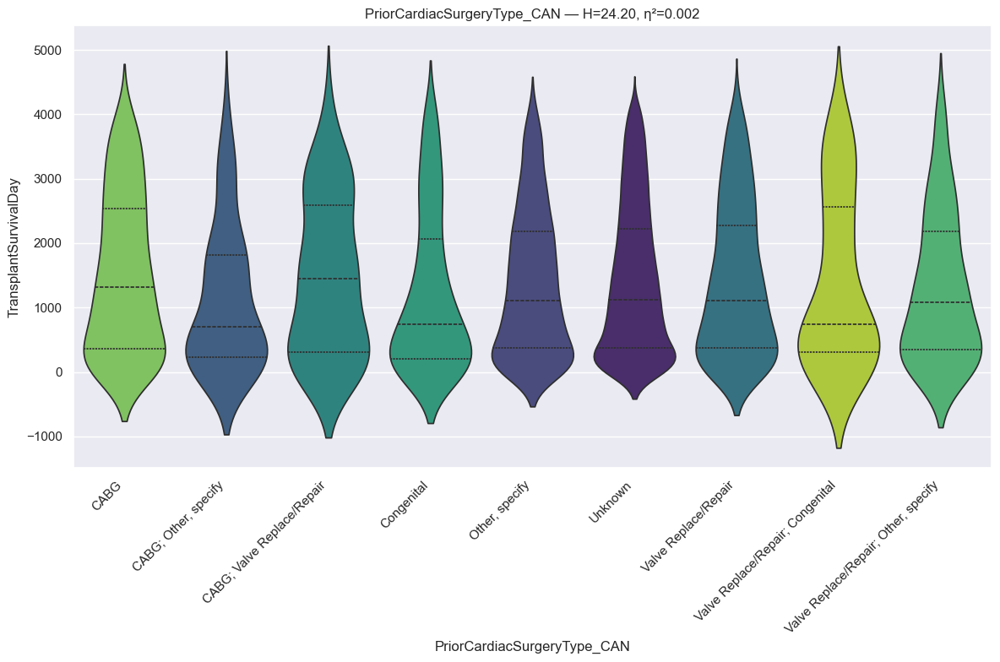

RANKING REPORT: PriorCardiacSurgeryType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CABG                                              :    322 records
 * CABG; Other, specify                              :     58 records
 * CABG; Valve Replace/Repair                        :     75 records
 * Congenital                                        :    272 records
 * Other, specify                                    :   1256 records
 * Unknown                                           :   5331 records
 * Valve Replace/Repair                              :    512 records
 * Valve Replace/Repair; Congenital                  :     53 records
 * Valve Replace/Repair; Other, specify              :    123 records
BYPASSED CATEGORIES (n < min_n):
 * CABG; Congenital                                  :      2 records
 * CABG; Congenital; Other, specify                  :      1 records
 * CABG; Left Vent. Remodeling                       :      1 records
 * CABG; Left Vent. Remodeling; Other, specify       

In [107]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [108]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PriorCardiacSurgeryType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CABG                                              :    322 records
 * CABG; Other, specify                              :     58 records
 * CABG; Valve Replace/Repair                        :     75 records
 * Congenital                                        :    272 records
 * Other, specify                                    :   1256 records
 * Unknown                                           :   5331 records
 * Valve Replace/Repair                              :    512 records
 * Valve Replace/Repair; Congenital                  :     53 records
 * Valve Replace/Repair; Other, specify              :    123 records
BYPASSED CATEGORIES (n < min_n):
 * CABG; Congenital                                  :      2 records
 * CABG; Congenital; Other, specify                  :      1 records
 * CABG; Left Vent. Remodeling                       :      1 records
 * CABG; Left Vent. Remodeling; Other, specify       

In [109]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Initial Waiting List Status Code

In [110]:
# info
feature = u.get_feature_info(df, 'InitialWaitingListStatusCode_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                 count unique            top  freq
InitialWaitingListStatusCode_CAN  8064     10  HR: Status 1B  2539

:::: NaN Count:
InitialWaitingListStatusCode_CAN    0 



{'InitialWaitingListStatusCode_CAN': CategoricalDtype(categories=['HR: Adult Status 1', 'HR: Adult Status 2',
                   'HR: Adult Status 3', 'HR: Adult Status 4',
                   'HR: Adult Status 5', 'HR: Adult Status 6',
                   'HR: Old Status 1', 'HR: Status 1A', 'HR: Status 1B',
                   'HR: Status 2', 'HR: Temporarily inactive'],
 , ordered=False, categories_dtype=str)}

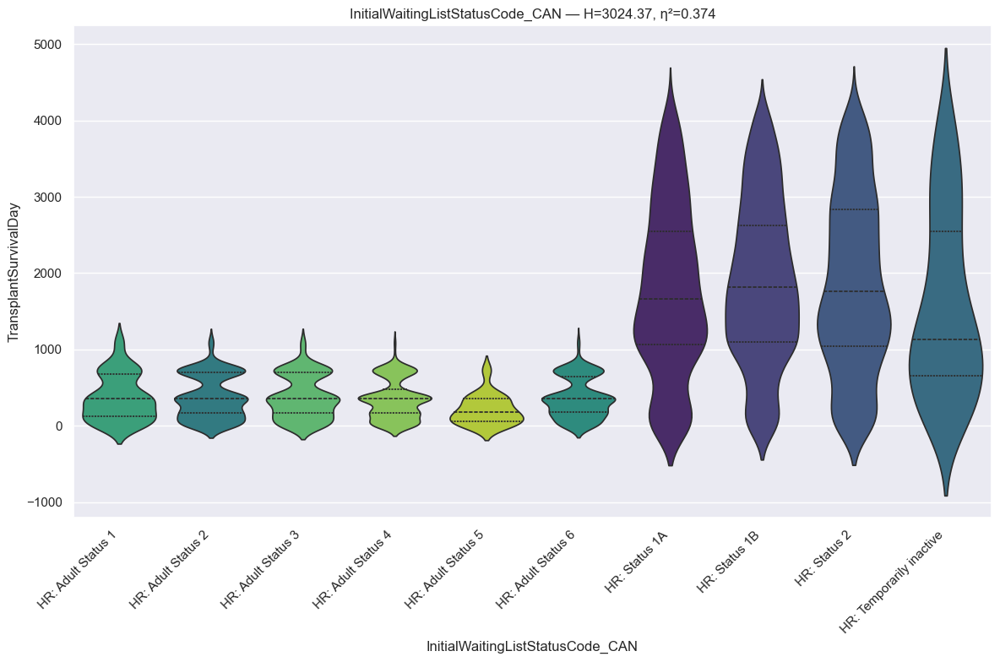

RANKING REPORT: InitialWaitingListStatusCode_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * HR: Adult Status 1                                :    108 records
 * HR: Adult Status 2                                :    565 records
 * HR: Adult Status 3                                :    308 records
 * HR: Adult Status 4                                :    812 records
 * HR: Adult Status 5                                :     33 records
 * HR: Adult Status 6                                :    423 records
 * HR: Status 1A                                     :   1392 records
 * HR: Status 1B                                     :   2539 records
 * HR: Status 2                                      :   1764 records
 * HR: Temporarily inactive                          :    120 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 3024.3675 | P-value: 0.000000e+00 | Effect η²: 0.3744
Correction Method: BONFERRONI
Pairwise Testing (B

In [111]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": True,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [112]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InitialWaitingListStatusCode_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * HR: Adult Status 1                                :    108 records
 * HR: Adult Status 2                                :    565 records
 * HR: Adult Status 3                                :    308 records
 * HR: Adult Status 4                                :    812 records
 * HR: Adult Status 5                                :     33 records
 * HR: Adult Status 6                                :    423 records
 * HR: Status 1A                                     :   1392 records
 * HR: Status 1B                                     :   2539 records
 * HR: Status 2                                      :   1764 records
 * HR: Temporarily inactive                          :    120 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 3024.3675 | P-value: 0.000000e+00 | Effect η²: 0.3744
Correction Method: HOLM
Pairwise Testing (Base Al

In [113]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Received Deceased Donor Tramsplant

In [114]:
# info
feature = u.get_feature_info(df, 'ReceivedDeceasedDonorTramsplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                    count unique  top  freq
ReceivedDeceasedDonorTramsplant_CAN  8064      2  Yes  8061

:::: NaN Count:
ReceivedDeceasedDonorTramsplant_CAN    0 



{'ReceivedDeceasedDonorTramsplant_CAN': <StringDtype(na_value=nan)>}

In [115]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for ReceivedDeceasedDonorTramsplant_CAN
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Yes

ReceivedDeceasedDonorTramsplant_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                                Yes         1424.303188                1112.0                 4195.0                    0.0          8061
                                 No         1121.666667                1435.0                 1827.0                  103.0             3


In [116]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Status At Transplant

In [117]:
# info
feature = u.get_feature_info(df, 'StatusAtTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique                                                                                                  top  freq
StatusAtTransplant_CAN  8064      8  Hypoplastic Left Heart Syndrome; Atrioventricular Septal Defect; Other left Heart Valvar/Structural  3117

:::: NaN Count:
StatusAtTransplant_CAN    0 



{'StatusAtTransplant_CAN': CategoricalDtype(categories=['Atrioventricular Septal Defect; Congenitally Corrected Transposition (L-TGA); Other',
                   'Hypoplastic Left Heart Syndrome; Atrioventricular Septal Defect; Other left Heart Valvar/Structural',
                   'Hypoplastic Left Heart Syndrome; Other left Heart Valvar/Structural Hypoplasia; Congenitally Correct',
                   'Hypoplastic Left Heart Syndrome; Transposition of the Great Arteries; Atrioventricular Septal Defect',
                   'Hypoplastic Left Heart Syndrome; Transposition of the Great Arteries; Truncus Arteriosus; Congenital',
                   'Other left Heart Valvar/Structural Hypoplasia; Truncus Arteriosus; Congenitally Corrected Transposition',
                   'Transposition of the Great Arteries; Atrioventricular Septal Defect; Other left Heart Valvar/Structural',
                   'Transposition of the Great Arteries; Truncus Arteriosus; Congenitally Corrected Transposition 

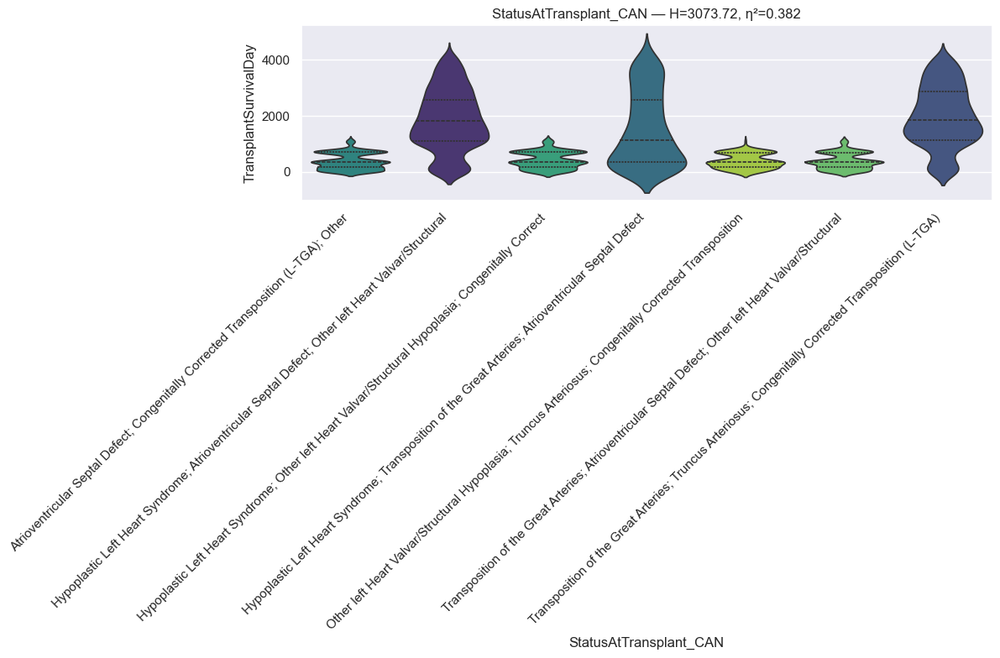

RANKING REPORT: StatusAtTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Atrioventricular Septal Defect; Congenitally Corrected Transposition (L-TGA); Other:   1062 records
 * Hypoplastic Left Heart Syndrome; Atrioventricular Septal Defect; Other left Heart Valvar/Structural:   3117 records
 * Hypoplastic Left Heart Syndrome; Other left Heart Valvar/Structural Hypoplasia; Congenitally Correct:    472 records
 * Hypoplastic Left Heart Syndrome; Transposition of the Great Arteries; Atrioventricular Septal Defect:    547 records
 * Other left Heart Valvar/Structural Hypoplasia; Truncus Arteriosus; Congenitally Corrected Transposition:    175 records
 * Transposition of the Great Arteries; Atrioventricular Septal Defect; Other left Heart Valvar/Structural:    688 records
 * Transposition of the Great Arteries; Truncus Arteriosus; Congenitally Corrected Transposition (L-TGA):   1974 records
BYPASSED CATEGORIES (n < min_n):
 * Hypoplastic Left Heart Syndrome; Transposition of the Great Arteri

In [118]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [119]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: StatusAtTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Atrioventricular Septal Defect; Congenitally Corrected Transposition (L-TGA); Other:   1062 records
 * Hypoplastic Left Heart Syndrome; Atrioventricular Septal Defect; Other left Heart Valvar/Structural:   3117 records
 * Hypoplastic Left Heart Syndrome; Other left Heart Valvar/Structural Hypoplasia; Congenitally Correct:    472 records
 * Hypoplastic Left Heart Syndrome; Transposition of the Great Arteries; Atrioventricular Septal Defect:    547 records
 * Other left Heart Valvar/Structural Hypoplasia; Truncus Arteriosus; Congenitally Corrected Transposition:    175 records
 * Transposition of the Great Arteries; Atrioventricular Septal Defect; Other left Heart Valvar/Structural:    688 records
 * Transposition of the Great Arteries; Truncus Arteriosus; Congenitally Corrected Transposition (L-TGA):   1974 records
BYPASSED CATEGORIES (n < min_n):
 * Hypoplastic Left Heart Syndrome; Transposition of the Great Arteri

In [120]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Registration

In [121]:
# info
feature = u.get_feature_info(df, 'LifeSupportRegistration_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                            count unique  top  freq
LifeSupportRegistration_CAN  8064      3  Yes  4671

:::: NaN Count:
LifeSupportRegistration_CAN    0 



{'LifeSupportRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

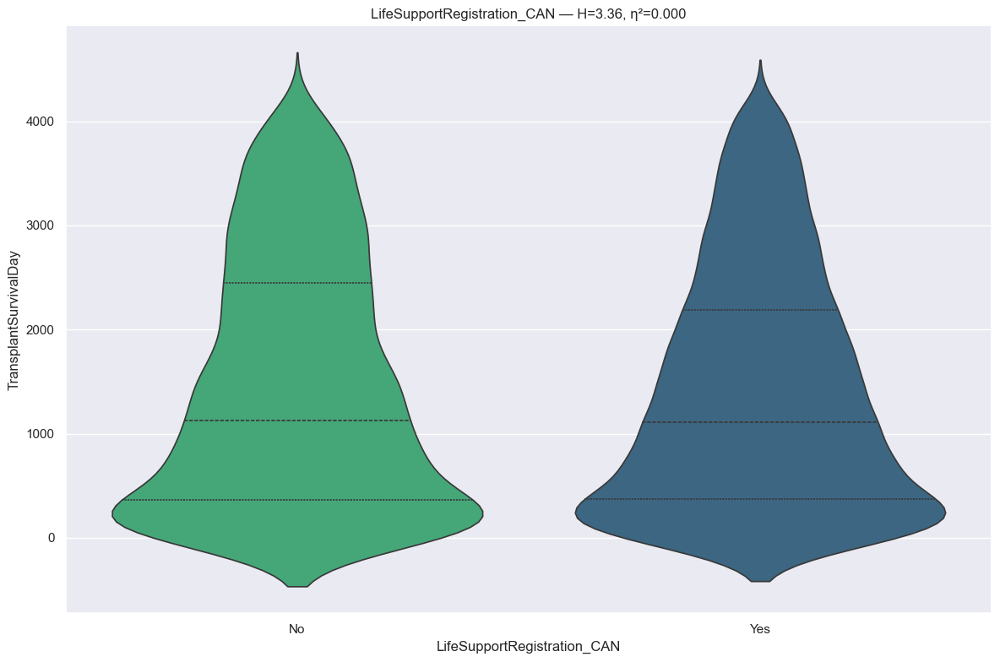

RANKING REPORT: LifeSupportRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   3389 records
 * Yes                                               :   4671 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 3.3604 | P-value: 6.678161e-02 | Effect η²: 0.0003
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=6.6782e-02 | thr=0.0500 | r=-0.024 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Other (1 categories)
  - Unknown

LifeSupportRegistration_CAN  mean_survival_days  median_survival_da

In [122]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [123]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: LifeSupportRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   3389 records
 * Yes                                               :   4671 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      4 records
--------------------------------------------------------------------------------
Kruskal H: 3.3604 | P-value: 6.678161e-02 | Effect η²: 0.0003
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Other (1 categories)
  - Unknown



In [124]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does have a statistically significant or practically minimum impact on survival due to the size of the data.

#### Ethnicity

In [125]:
# info
feature = u.get_feature_info(df, 'Ethnicity', cat=False)
# dtype
{col: df[col].dtype for col in feature}

              count unique                  top  freq
Ethnicity_CAN  8064      7  White, Non-Hispanic  4821

:::: NaN Count:
Ethnicity_CAN    0 



{'Ethnicity_CAN': CategoricalDtype(categories=['Amer Ind/Alaska Native', 'Asian', 'Black', 'Hispanic',
                   'Multiracial', 'Native Hawaiian/other Pacific Islander',
                   'White, Non-Hispanic'],
 , ordered=False, categories_dtype=str)}

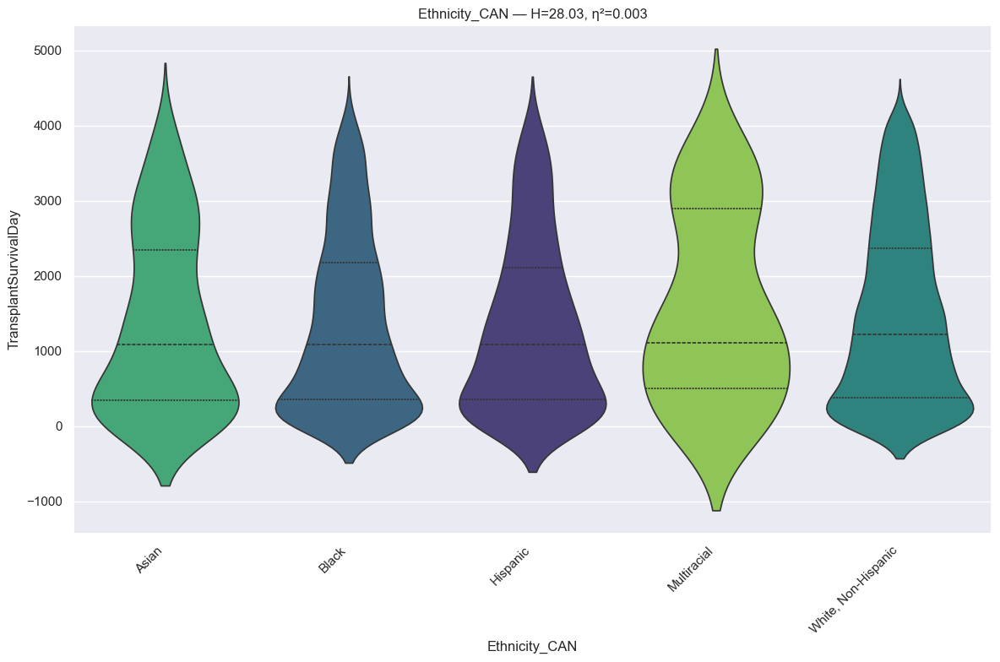

RANKING REPORT: Ethnicity_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Asian                                             :    245 records
 * Black                                             :   2218 records
 * Hispanic                                          :    679 records
 * Multiracial                                       :     54 records
 * White, Non-Hispanic                               :   4821 records
BYPASSED CATEGORIES (n < min_n):
 * Amer Ind/Alaska Native                            :     28 records
 * Native Hawaiian/other Pacific Islander            :     19 records
--------------------------------------------------------------------------------
Kruskal H: 28.0278 | P-value: 1.231208e-05 | Effect η²: 0.0030
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0050 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Black        vs White, Non-Hispanic | p=1.0824e-05 | thr=0.0050 | r= 0.065 | *Sig*
Hispanic     vs

In [126]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [127]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: Ethnicity_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Asian                                             :    245 records
 * Black                                             :   2218 records
 * Hispanic                                          :    679 records
 * Multiracial                                       :     54 records
 * White, Non-Hispanic                               :   4821 records
BYPASSED CATEGORIES (n < min_n):
 * Amer Ind/Alaska Native                            :     28 records
 * Native Hawaiian/other Pacific Islander            :     19 records
--------------------------------------------------------------------------------
Kruskal H: 28.0278 | P-value: 1.231208e-05 | Effect η²: 0.0030
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::



In [128]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventilator Registration

In [129]:
# info
feature = u.get_feature_info(df, 'VentilatorRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                           count unique top  freq
VentilatorRegistration_CAN  8064      2  No  7931

:::: NaN Count:
VentilatorRegistration_CAN    0 



{'VentilatorRegistration_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

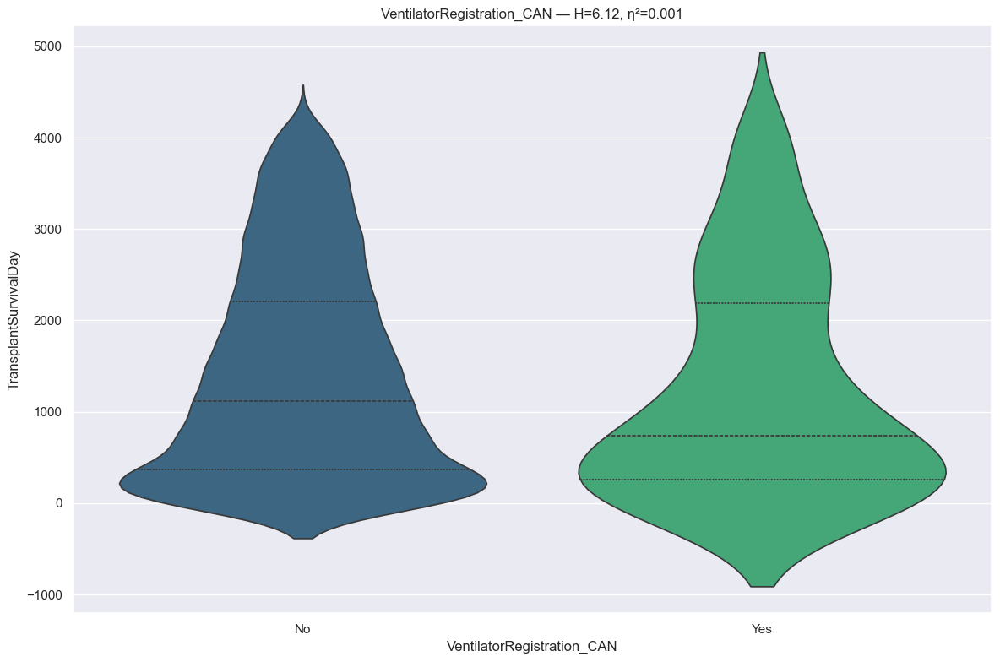

RANKING REPORT: VentilatorRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7931 records
 * Yes                                               :    133 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 6.1225 | P-value: 1.334687e-02 | Effect η²: 0.0006
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.3348e-02 | thr=0.0500 | r=-0.125 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

VentilatorRegistration_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                        No  

In [130]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [131]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Transplant Region

In [132]:
# info
feature = u.get_feature_info(df, 'TransplantRegion', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                     count unique       top  freq
TransplantRegion_CAN  8064     11  Region 5  1259

:::: NaN Count:
TransplantRegion_CAN    0 



{'TransplantRegion_CAN': CategoricalDtype(categories=['Region 1', 'Region 10', 'Region 11', 'Region 2', 'Region 3',
                   'Region 4', 'Region 5', 'Region 6', 'Region 7', 'Region 8',
                   'Region 9'],
 , ordered=False, categories_dtype=str)}

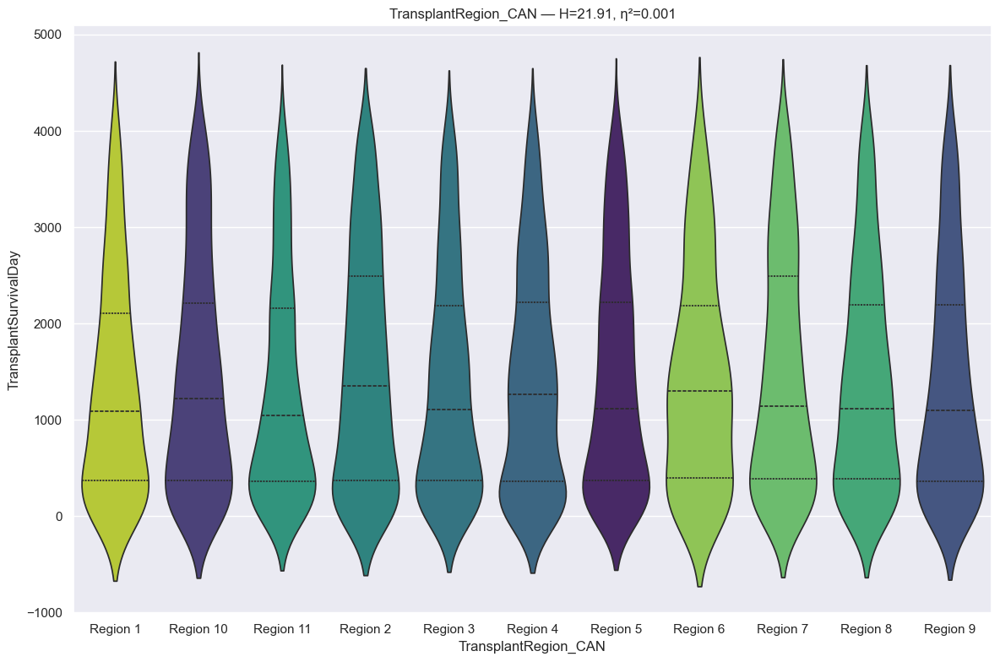

RANKING REPORT: TransplantRegion_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Region 1                                          :    389 records
 * Region 10                                         :    675 records
 * Region 11                                         :   1040 records
 * Region 2                                          :    870 records
 * Region 3                                          :    934 records
 * Region 4                                          :    844 records
 * Region 5                                          :   1259 records
 * Region 6                                          :    267 records
 * Region 7                                          :    735 records
 * Region 8                                          :    547 records
 * Region 9                                          :    504 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 21.9130 | P-value: 1.555387e-02 | Effect η²: 

In [133]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [134]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed

# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: TransplantRegion_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Region 1                                          :    389 records
 * Region 10                                         :    675 records
 * Region 11                                         :   1040 records
 * Region 2                                          :    870 records
 * Region 3                                          :    934 records
 * Region 4                                          :    844 records
 * Region 5                                          :   1259 records
 * Region 6                                          :    267 records
 * Region 7                                          :    735 records
 * Region 8                                          :    547 records
 * Region 9                                          :    504 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 21.9130 | P-value: 1.555387e-02 | Effect η²: 

In [135]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature has a statistically significant impact on survival, and some regions differ, but the effect size is tiny and contributes almost nothing practically.

#### Work Income Registration

In [136]:
# info
feature = u.get_feature_info(df, 'WorkIncomeRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                           count unique top  freq
WorkIncomeRegistration_CAN  8064      3  No  6566

:::: NaN Count:
WorkIncomeRegistration_CAN    0 



{'WorkIncomeRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

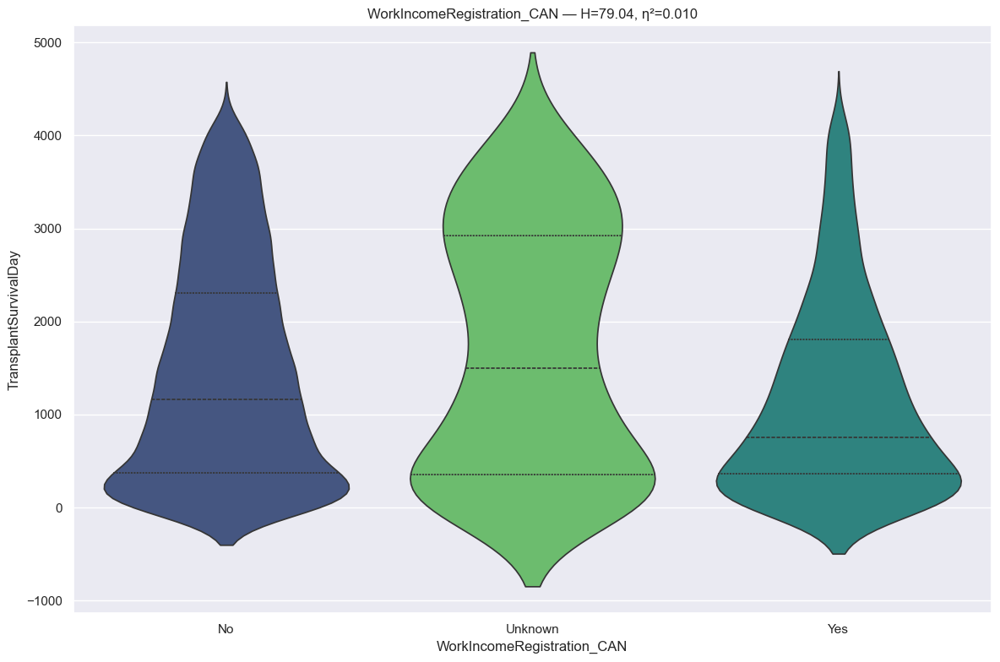

RANKING REPORT: WorkIncomeRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6566 records
 * Unknown                                           :    291 records
 * Yes                                               :   1207 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 79.0438 | P-value: 6.852674e-18 | Effect η²: 0.0096
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.0348e-17 | thr=0.0167 | r=-0.152 | *Sig*
Unknown      vs Yes          | p=1.0856e-08 | thr=0.0167 | r=-0.216 | *Sig*
No           vs Unknown      | p=1.3101e-02 | thr=0.0167 | r= 0.086 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> G

In [137]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [138]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen BW4
* The Bw4 antigen is a highly immunogenic, public HLA class I epitope (found on HLA-A and B) that can trigger Antibody-Mediated Rejection (ABMR) in transplant recipients. While not always causing poor long-term outcomes, Bw4 mismatching increases alloimmunization, and pre-formed anti-Bw4 antibodies can cause acute or hyperacute graft rejection.

In [139]:
# info
feature = u.get_feature_info(df, 'AntigenBW4', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique         top  freq
AntigenBW4_CAN  8064      4  No Antigen  5557

:::: NaN Count:
AntigenBW4_CAN    0 



{'AntigenBW4_CAN': CategoricalDtype(categories=['Negative', 'No Antigen', 'Not Done', 'Positive'], ordered=False, categories_dtype=str)}

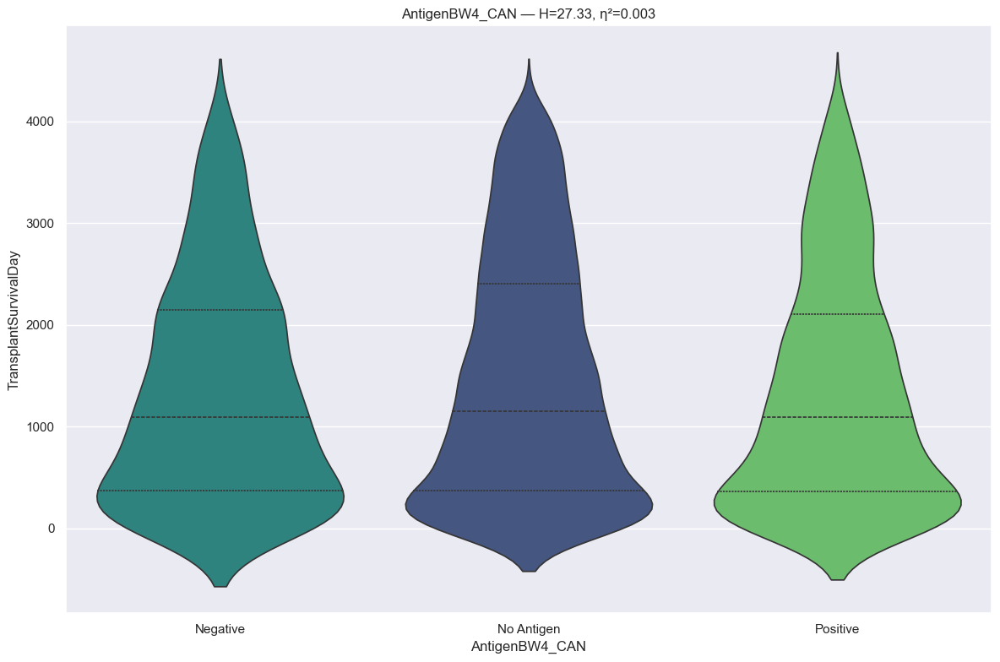

RANKING REPORT: AntigenBW4_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    781 records
 * No Antigen                                        :   5557 records
 * Positive                                          :   1723 records
BYPASSED CATEGORIES (n < min_n):
 * Not Done                                          :      3 records
--------------------------------------------------------------------------------
Kruskal H: 27.3332 | P-value: 1.160541e-06 | Effect η²: 0.0031
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No Antigen   vs Positive     | p=9.8894e-07 | thr=0.0167 | r=-0.078 | *Sig*
Negative     vs No Antigen   | p=8.5110e-03 | thr=0.0167 | r= 0.058 | *Sig*
Negative     vs Positive     | p=3.5681e-01 | thr=0.0167 | r=-0.023 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

::::::::::::::::::::

In [140]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [141]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen BW6
* HLA-Bw4 and Bw6 are public epitopes on HLA-B antigens that serve as significant immunological barriers in transplantation, particularly when antibodies against them make a patient highly sensitized. Anti-Bw6 antibodies specifically can lead to a high calculated panel reactive antibody (cPRA) score (~85%), complicating donor matching. Although mismatches can trigger antibody-mediated rejection, studies suggest they do not always independently predict poor long-term graft survival. 

In [142]:
# info
feature = u.get_feature_info(df, 'AntigenBW6', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique         top  freq
AntigenBW6_CAN  8064      4  No Antigen  5467

:::: NaN Count:
AntigenBW6_CAN    0 



{'AntigenBW6_CAN': CategoricalDtype(categories=['Negative', 'No Antigen', 'Not Done', 'Positive'], ordered=False, categories_dtype=str)}

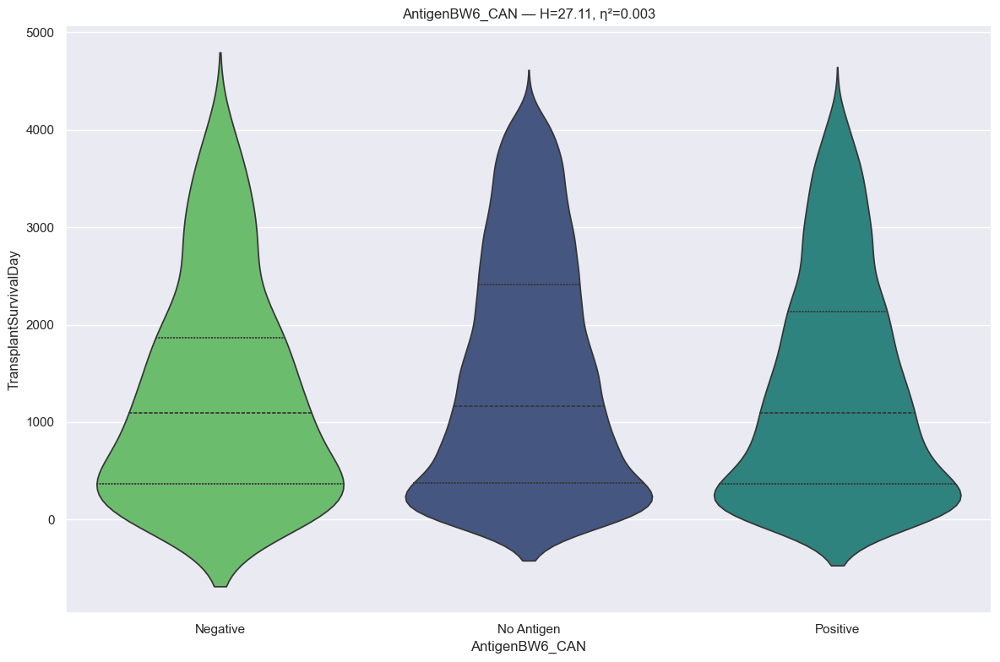

RANKING REPORT: AntigenBW6_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    332 records
 * No Antigen                                        :   5467 records
 * Positive                                          :   2264 records
BYPASSED CATEGORIES (n < min_n):
 * Not Done                                          :      1 records
--------------------------------------------------------------------------------
Kruskal H: 27.1054 | P-value: 1.300566e-06 | Effect η²: 0.0031
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No Antigen   vs Positive     | p=1.0884e-06 | thr=0.0167 | r=-0.070 | *Sig*
Negative     vs No Antigen   | p=1.4587e-02 | thr=0.0167 | r= 0.080 | *Sig*
Negative     vs Positive     | p=7.6811e-01 | thr=0.0167 | r= 0.010 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

::::::::::::::::::::

In [143]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [144]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen C1
* C1-inhibitor (C1-INH) is used in transplantation to prevent antibody-mediated rejection (AMR) by reducing C1q+ HLA antibodies and inhibiting the complement cascade. It is particularly useful in sensitized patients to improve graft survival, reduce ischemia-reperfusion injury, and treat acute antibody-mediated rejection.

In [145]:
# info
feature = u.get_feature_info(df, 'AntigenC1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

              count unique         top  freq
AntigenC1_CAN  8064     33  No Antigen  5536

:::: NaN Count:
AntigenC1_CAN    0 



{'AntigenC1_CAN': CategoricalDtype(categories=['01', '01:02', '02', '02:02', '02:10', '03', '03:02',
                   '03:03', '03:04', '03:06', '04', '04:01', '05', '05:01',
                   '06', '06:02', '07', '07:01', '07:02', '07:04', '07:18',
                   '08', '08:02', '08:04', '09', '10', '12', '12:03', '14',
                   '15', '15:05', '16', '16:01', '17', '17:01', '18',
                   'No Antigen'],
 , ordered=False, categories_dtype=str)}

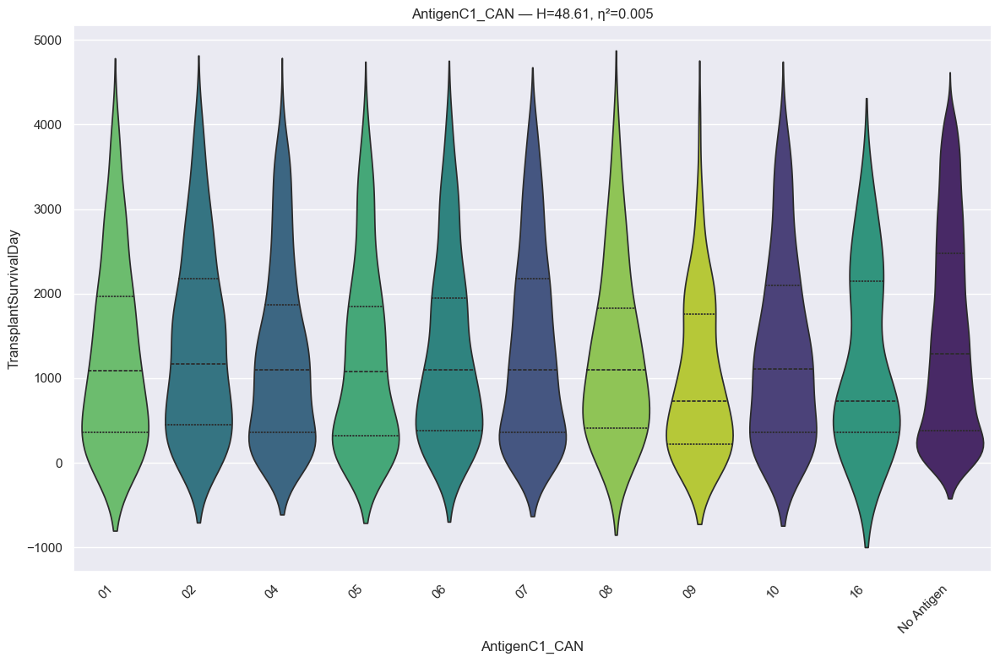

RANKING REPORT: AntigenC1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 01                                                :    128 records
 * 02                                                :    248 records
 * 04                                                :    517 records
 * 05                                                :    261 records
 * 06                                                :    259 records
 * 07                                                :    535 records
 * 08                                                :     70 records
 * 09                                                :     95 records
 * 10                                                :    192 records
 * 16                                                :     30 records
 * No Antigen                                        :   5536 records
BYPASSED CATEGORIES (n < min_n):
 * 01:02                                             :     11 records
 * 02:02                                             :      7 recor

In [146]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [147]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenC1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 01                                                :    128 records
 * 02                                                :    248 records
 * 04                                                :    517 records
 * 05                                                :    261 records
 * 06                                                :    259 records
 * 07                                                :    535 records
 * 08                                                :     70 records
 * 09                                                :     95 records
 * 10                                                :    192 records
 * 16                                                :     30 records
 * No Antigen                                        :   5536 records
BYPASSED CATEGORIES (n < min_n):
 * 01:02                                             :     11 records
 * 02:02                                             :      7 recor

In [148]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen C2
* Melanoma-associated antigen C2 (MAGEC2) is a cancer-testis antigen and oncoprotein frequently expressed in various tumors, including melanoma, triple-negative breast cancer, and lung cancer. As a tumor-specific antigen recognized by cytolytic T lymphocytes (CTLs), it is a target for immunotherapy.

In [149]:
# info
feature = u.get_feature_info(df, 'AntigenC2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

              count unique         top  freq
AntigenC2_CAN  8064     34  No Antigen  5740

:::: NaN Count:
AntigenC2_CAN    0 



{'AntigenC2_CAN': CategoricalDtype(categories=['01', '01:02', '02', '02:02', '02:10', '03', '03:02',
                   '03:03', '03:04', '04', '04:01', '05', '05:01', '06',
                   '06:02', '07', '07:01', '07:02', '07:04', '07:18', '08',
                   '08:02', '08:03', '08:04', '09', '10', '12', '12:02',
                   '12:03', '14', '14:02', '15', '15:02', '15:05', '16',
                   '16:01', '16:02', '16:04', '17', '17:01', '17:03', '18',
                   '18:01', '18:02', 'No Antigen'],
 , ordered=False, categories_dtype=str)}

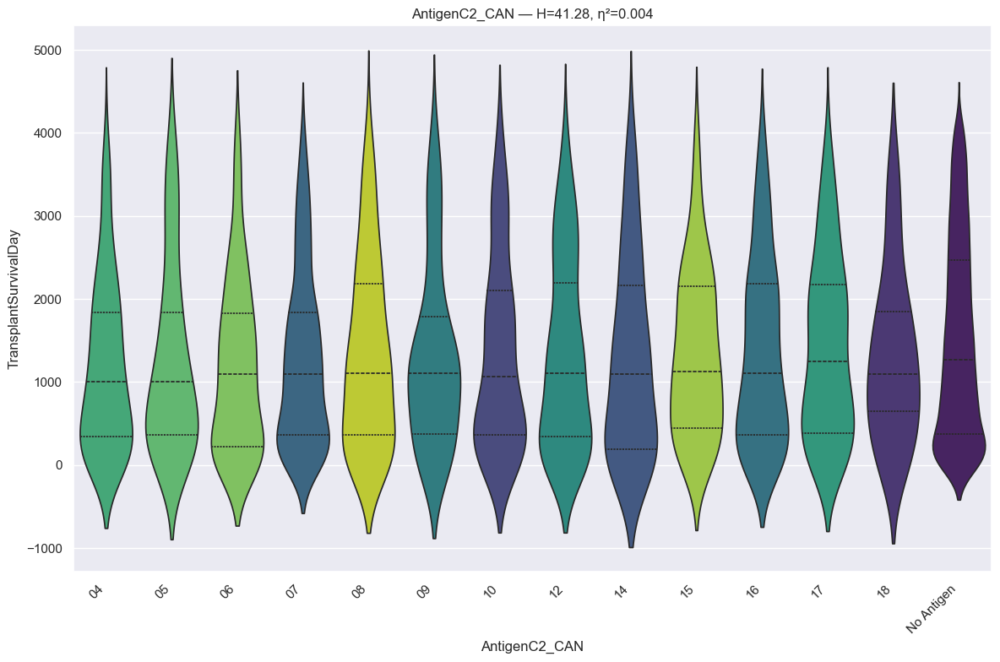

RANKING REPORT: AntigenC2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 04                                                :    138 records
 * 05                                                :    103 records
 * 06                                                :    182 records
 * 07                                                :    621 records
 * 08                                                :    142 records
 * 09                                                :     89 records
 * 10                                                :    169 records
 * 12                                                :    165 records
 * 14                                                :     67 records
 * 15                                                :     97 records
 * 16                                                :    216 records
 * 17                                                :    136 records
 * 18                                                :     46 records
 * No Antigen                 

In [150]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [151]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenC2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 04                                                :    138 records
 * 05                                                :    103 records
 * 06                                                :    182 records
 * 07                                                :    621 records
 * 08                                                :    142 records
 * 09                                                :     89 records
 * 10                                                :    169 records
 * 12                                                :    165 records
 * 14                                                :     67 records
 * 15                                                :     97 records
 * 16                                                :    216 records
 * 17                                                :    136 records
 * 18                                                :     46 records
 * No Antigen                 

In [152]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR51
* HLA-DR51 is a minor Human Leukocyte Antigen (HLA) class II antigen encoded by the HLA-DRB5 locus, typically associated with DR2 haplotypes. It functions as an antigen-presenting molecule for T-cells and is highly relevant in transplantation, where anti-DR51 antibodies can indicate graft rejection, as well as in autoimmune studies.
* HLA Matching (The Numbers 0–6): In transplant medicine, these numbers typically represent the number of mismatches between you and a potential donor.
    * 0: A perfect match; the lowest risk for rejection.
    * 1–5: Increasing levels of genetic difference (mismatches) between you and the donor.
    * 6: The maximum number of mismatches for the primary HLA markers (A, B, and DR).
    * Antibody Status (Negative/Positive):
    * Negative: You do not have pre-formed antibodies against that specific antigen (DR51). This is the ideal result because it means your immune system is less likely to attack a donor heart that has that antigen.
    * Positive: You have antibodies against that antigen. If a donor heart has DR51, your immune system might recognize it as "foreign" and attack it, increasing the risk of antibody-mediated rejection (AMR). 

In [153]:
# info
feature = u.get_feature_info(df, 'AntigenDR51_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique         top  freq
AntigenDR51_CAN  8064      8  No Antigen  5873

:::: NaN Count:
AntigenDR51_CAN    0 



{'AntigenDR51_CAN': CategoricalDtype(categories=['1', '2', '3', '4', '5', 'Negative', 'No Antigen',
                   'Not Done', 'Positive'],
 , ordered=False, categories_dtype=str)}

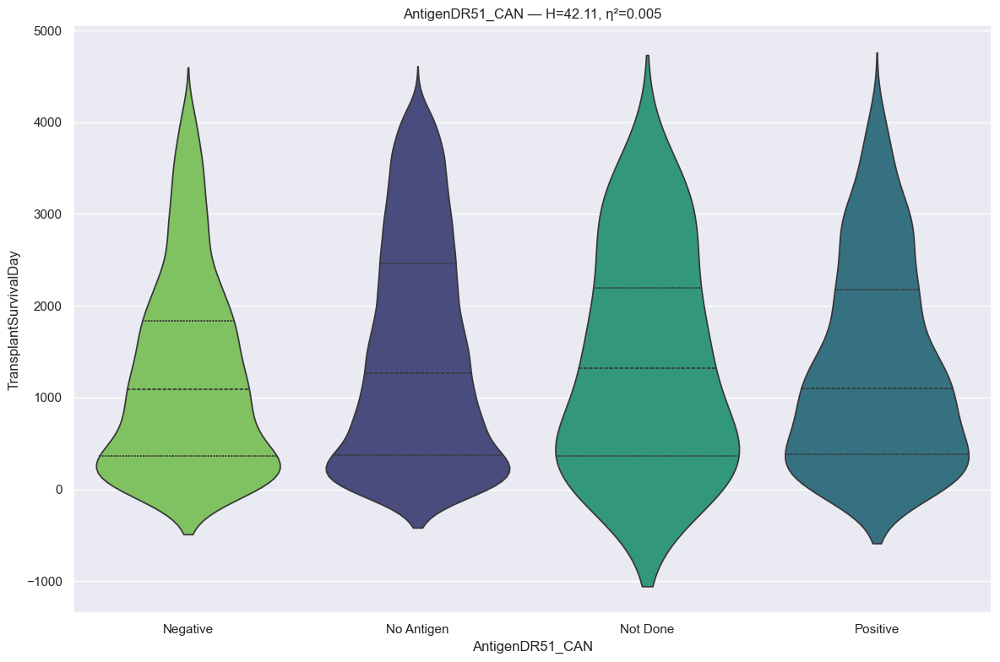

RANKING REPORT: AntigenDR51_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   1442 records
 * No Antigen                                        :   5873 records
 * Not Done                                          :     47 records
 * Positive                                          :    644 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :     28 records
 * 2                                                 :      2 records
 * 3                                                 :     23 records
 * 5                                                 :      5 records
--------------------------------------------------------------------------------
Kruskal H: 42.1111 | P-value: 3.800063e-09 | Effect η²: 0.0049
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs No Antigen

In [154]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [155]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDR51_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   1442 records
 * No Antigen                                        :   5873 records
 * Not Done                                          :     47 records
 * Positive                                          :    644 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :     28 records
 * 2                                                 :      2 records
 * 3                                                 :     23 records
 * 5                                                 :      5 records
--------------------------------------------------------------------------------
Kruskal H: 42.1111 | P-value: 3.800063e-09 | Effect η²: 0.0049
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison outp

In [156]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR51 2
* Anti-HLA-DR51/52/53 antibodies are donor-specific antibodies (DSAs) that can develop after organ transplantation, specifically the kidney, and may be associated with Antibody-Mediated Rejection (ABMR). While DR51/52/53 antigens are expressed at relatively low levels, they are highly immunogenic and can cause significant sensitization, making their monitoring important for detecting potential graft dysfunction.

In [157]:
# info
feature = u.get_feature_info(df, 'AntigenDR51_2_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count unique         top  freq
AntigenDR51_2_CAN  8064      7  No Antigen  7651

:::: NaN Count:
AntigenDR51_2_CAN    0 



{'AntigenDR51_2_CAN': CategoricalDtype(categories=['1', '2', '3', '5', 'Negative', 'No Antigen', 'Not Done',
                   'Positive'],
 , ordered=False, categories_dtype=str)}

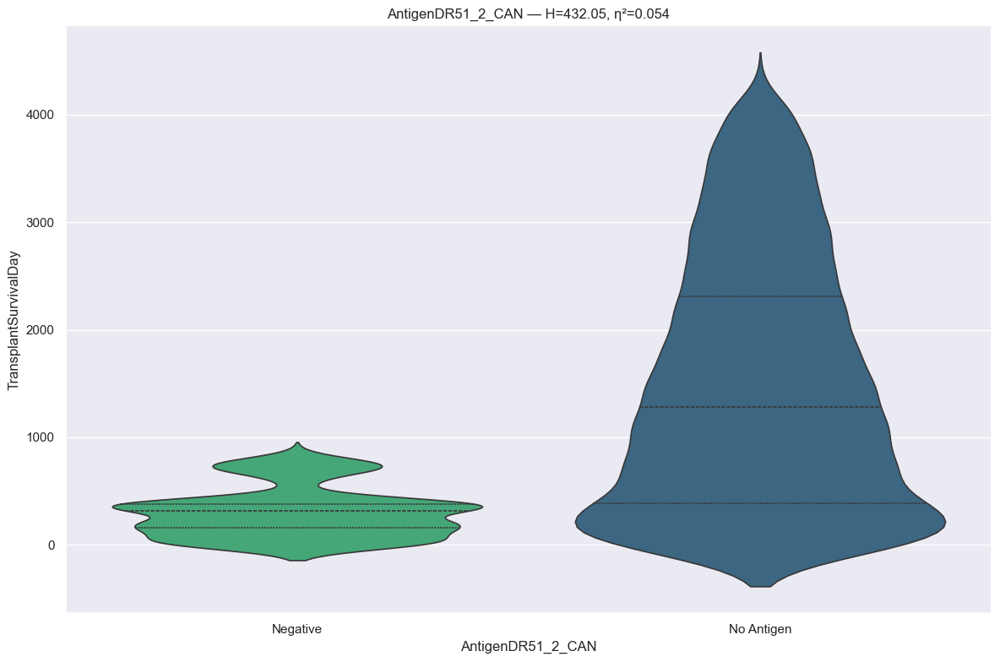

RANKING REPORT: AntigenDR51_2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    368 records
 * No Antigen                                        :   7651 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :      6 records
 * 2                                                 :      1 records
 * 5                                                 :      3 records
 * Not Done                                          :     14 records
 * Positive                                          :     21 records
--------------------------------------------------------------------------------
Kruskal H: 432.0531 | P-value: 5.808235e-96 | Effect η²: 0.0538
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs No Antigen   | p=5.8096e-96 | thr=0.0500 | r= 0.640 | *Sig*
::::: Collapsed i

In [158]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [159]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDR51_2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    368 records
 * No Antigen                                        :   7651 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :      6 records
 * 2                                                 :      1 records
 * 5                                                 :      3 records
 * Not Done                                          :     14 records
 * Positive                                          :     21 records
--------------------------------------------------------------------------------
Kruskal H: 432.0531 | P-value: 5.808235e-96 | Effect η²: 0.0538
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') ::

In [160]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR52
* Anti-HLA-DR51, along with DR52 and DR53, are HLA-DR antigens that, when present as donor-specific antibodies (DSAs) after transplantation, can increase the risk of antibody-mediated rejection (ABMR) and graft damage. Despite their relatively weak expression, these antibodies are clinically relevant and are often identified in patients with sensitized systems using single-antigen bead assays, such as Luminex.

In [161]:
# info
feature = u.get_feature_info(df, 'AntigenDR52_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique         top  freq
AntigenDR52_CAN  8064     10  No Antigen  5730

:::: NaN Count:
AntigenDR52_CAN    0 



{'AntigenDR52_CAN': CategoricalDtype(categories=['1', '2', '3', '4', '5', '7', 'Negative', 'No Antigen',
                   'Not Done', 'Positive'],
 , ordered=False, categories_dtype=str)}

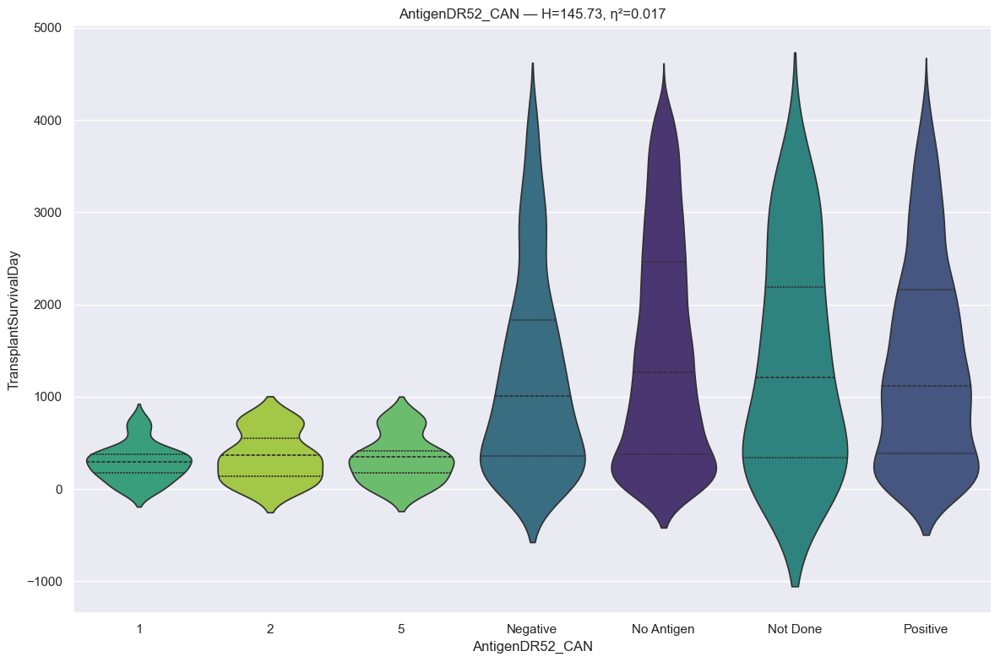

RANKING REPORT: AntigenDR52_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     38 records
 * 2                                                 :     35 records
 * 5                                                 :     34 records
 * Negative                                          :    667 records
 * No Antigen                                        :   5730 records
 * Not Done                                          :     48 records
 * Positive                                          :   1467 records
BYPASSED CATEGORIES (n < min_n):
 * 3                                                 :      9 records
 * 4                                                 :     28 records
 * 7                                                 :      8 records
--------------------------------------------------------------------------------
Kruskal H: 145.7328 | P-value: 6.172466e-29 | Effect η²: 0.0174
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni A

In [162]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [163]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDR52_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     38 records
 * 2                                                 :     35 records
 * 5                                                 :     34 records
 * Negative                                          :    667 records
 * No Antigen                                        :   5730 records
 * Not Done                                          :     48 records
 * Positive                                          :   1467 records
BYPASSED CATEGORIES (n < min_n):
 * 3                                                 :      9 records
 * 4                                                 :     28 records
 * 7                                                 :      8 records
--------------------------------------------------------------------------------
Kruskal H: 145.7328 | P-value: 6.172466e-29 | Effect η²: 0.0174
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 |

In [164]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR52 2
* HLA-DR52 (encoded by HLA-DRB3) is a class II antigen whose antibodies (DSAs) are linked to antibody-mediated rejection (ABMR) and reduced graft survival, despite weaker expression than DRB1. While traditionally not always matched, monitoring DR52 antibodies is vital for identifying the risk of transplant failure and flow crossmatch positivity.

In [165]:
# info
feature = u.get_feature_info(df, 'AntigenDR52_2_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count unique         top  freq
AntigenDR52_2_CAN  8064     10  No Antigen  7626

:::: NaN Count:
AntigenDR52_2_CAN    0 



{'AntigenDR52_2_CAN': CategoricalDtype(categories=['1', '2', '3', '4', '5', '7', 'Negative', 'No Antigen',
                   'Not Done', 'Positive'],
 , ordered=False, categories_dtype=str)}

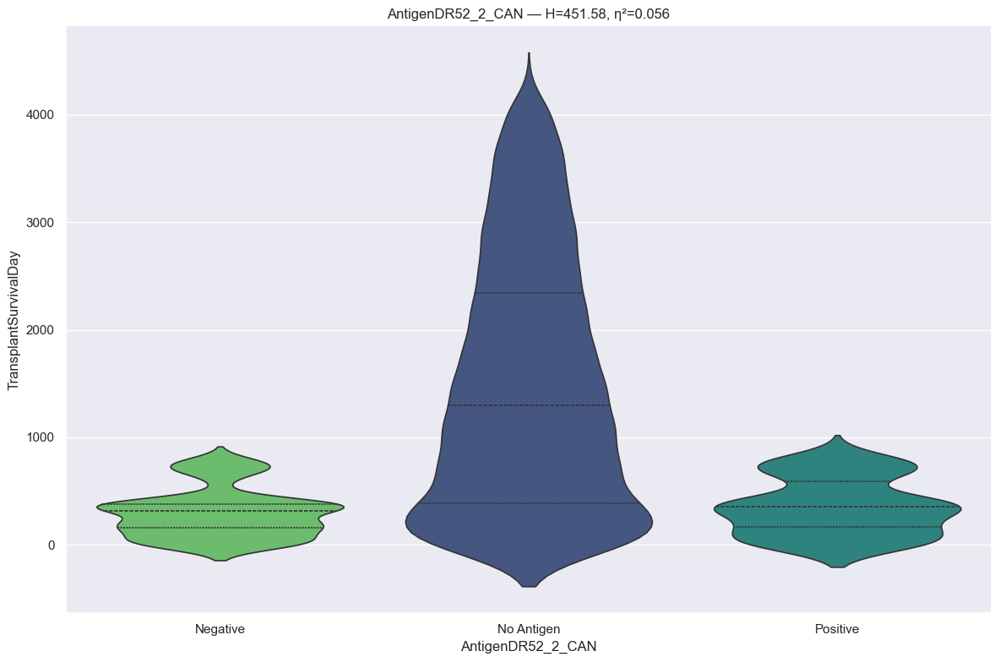

RANKING REPORT: AntigenDR52_2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    292 records
 * No Antigen                                        :   7626 records
 * Positive                                          :     96 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :      4 records
 * 2                                                 :     17 records
 * 3                                                 :      3 records
 * 4                                                 :      1 records
 * 5                                                 :     11 records
 * 7                                                 :      2 records
 * Not Done                                          :     12 records
--------------------------------------------------------------------------------
Kruskal H: 451.5809 | P-value: 8.718537e-99 | Effect η²: 0.0561
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni

In [166]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [167]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDR52_2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    292 records
 * No Antigen                                        :   7626 records
 * Positive                                          :     96 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :      4 records
 * 2                                                 :     17 records
 * 3                                                 :      3 records
 * 4                                                 :      1 records
 * 5                                                 :     11 records
 * 7                                                 :      2 records
 * Not Done                                          :     12 records
--------------------------------------------------------------------------------
Kruskal H: 451.5809 | P-value: 8.718537e-99 | Effect η²: 0.0561
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05

In [168]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DR53
* Antigen DR53 (part of the HLA-DRB4/5 system) is a supertypic HLA class II antigen that can induce donor-specific antibodies (DSAs), causing antibody-mediated rejection (AMR) in transplants. While mismatching is associated with potential graft damage, strong anti-DR53 antibodies do not always prohibit transplantation, requiring careful immunological assessment.

In [169]:
# info
feature = u.get_feature_info(df, 'AntigenDR53_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique         top  freq
AntigenDR53_CAN  8064      7  No Antigen  5811

:::: NaN Count:
AntigenDR53_CAN    0 



{'AntigenDR53_CAN': CategoricalDtype(categories=['1', '2', '3', 'Negative', 'No Antigen', 'Not Done',
                   'Positive'],
 , ordered=False, categories_dtype=str)}

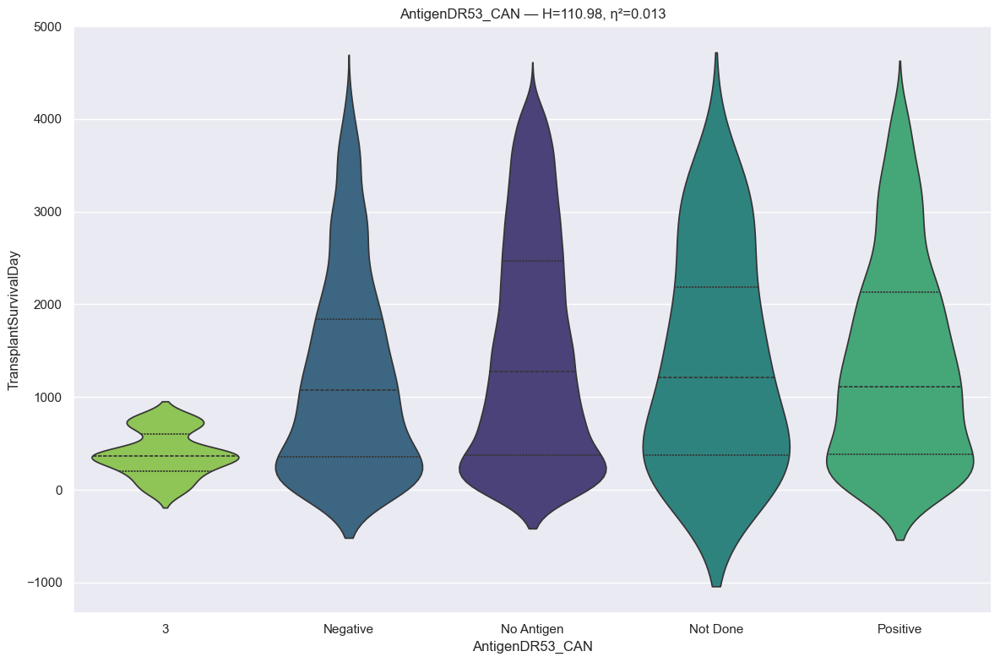

RANKING REPORT: AntigenDR53_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 3                                                 :     78 records
 * Negative                                          :   1122 records
 * No Antigen                                        :   5811 records
 * Not Done                                          :     48 records
 * Positive                                          :    973 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :      7 records
 * 2                                                 :     25 records
--------------------------------------------------------------------------------
Kruskal H: 110.9827 | P-value: 4.491599e-23 | Effect η²: 0.0133
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0050 | r_threshold: 0.10)
--------------------------------------------------------------------------------
3            vs No Antigen   | p=7.5316e-17 | thr=0.0050 | r= 0.549 | *Sig*
3            vs Pos

In [170]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [171]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDR53_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 3                                                 :     78 records
 * Negative                                          :   1122 records
 * No Antigen                                        :   5811 records
 * Not Done                                          :     48 records
 * Positive                                          :    973 records
BYPASSED CATEGORIES (n < min_n):
 * 1                                                 :      7 records
 * 2                                                 :     25 records
--------------------------------------------------------------------------------
Kruskal H: 110.9827 | P-value: 4.491599e-23 | Effect η²: 0.0133
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 4 groups (excluding 'Other') ::::

In [172]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### AntigenDR 53 2
* Anti-HLA-DR53 antibodies are donor-specific antibodies (DSAs) that can cause antibody-mediated rejection (AMR) in solid organ transplants, particularly kidneys, due to their role as class II HLA antigens. While strong pre-transplant DR53 antibodies usually indicate high risk, they do not always preclude transplantation if crossmatches are negative, though they still require careful monitoring due to the potential for AMR.

In [173]:
# info
feature = u.get_feature_info(df, 'AntigenDR53_2_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count unique         top  freq
AntigenDR53_2_CAN  8064      6  No Antigen  7648

:::: NaN Count:
AntigenDR53_2_CAN    0 



{'AntigenDR53_2_CAN': CategoricalDtype(categories=['2', '3', 'Negative', 'No Antigen', 'Not Done', 'Positive'], ordered=False, categories_dtype=str)}

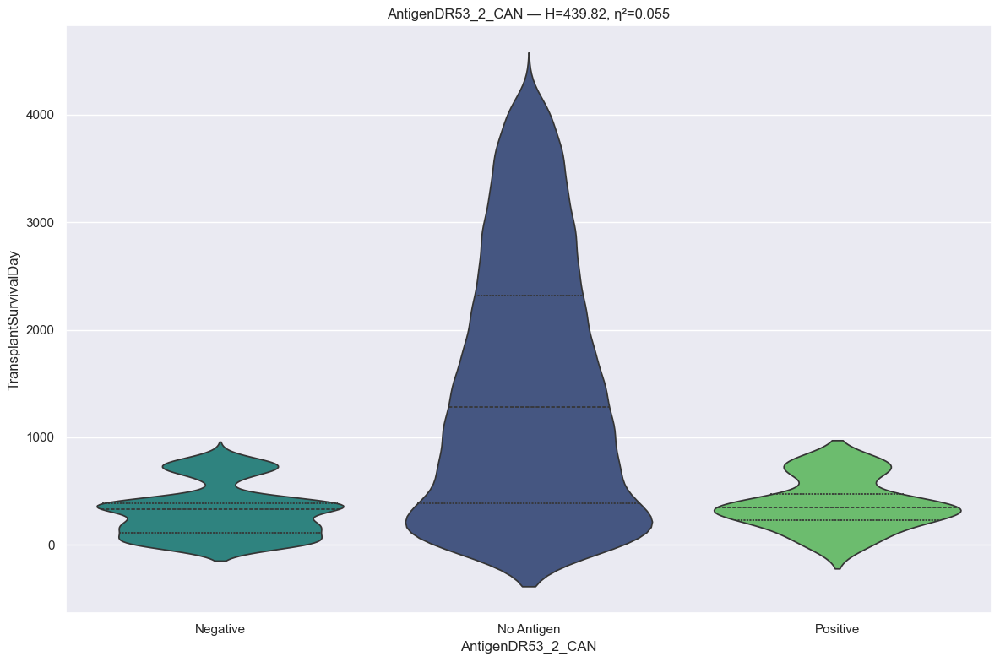

RANKING REPORT: AntigenDR53_2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    346 records
 * No Antigen                                        :   7648 records
 * Positive                                          :     39 records
BYPASSED CATEGORIES (n < min_n):
 * 2                                                 :      7 records
 * 3                                                 :     10 records
 * Not Done                                          :     14 records
--------------------------------------------------------------------------------
Kruskal H: 439.8167 | P-value: 3.126199e-96 | Effect η²: 0.0545
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs No Antigen   | p=1.1874e-89 | thr=0.0167 | r= 0.637 | *Sig*
No Antigen   vs Positive     | p=2.0736e-10 | thr=0.0167 | r=-0.589 | *Sig*
Negative   

In [174]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [175]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DQ1
* HLA-DQ1 is a specific HLA-DQ haplotype (comprising DQA101 and DQB105/06 alleles) acting as a Class II antigen in transplants. Mismatches at the HLA-DQ locus are highly immunogenic, often leading to de novo donor-specific antibodies (dnDSAs), which can cause antibody-mediated rejection (AMR), chronic lung allograft dysfunction (CLAD), and reduced graft survival.

In [176]:
# info
feature = u.get_feature_info(df, 'AntigenDQ1_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique         top  freq
AntigenDQ1_CAN  8064     24  No Antigen  5457

:::: NaN Count:
AntigenDQ1_CAN    0 



{'AntigenDQ1_CAN': CategoricalDtype(categories=['02:01', '02:02', '03:01', '03:02', '03:03', '03:19',
                   '04:01', '04:02', '05:01', '05:02', '05:03', '06:02',
                   '06:03', '06:04', '06:09', '1', '2', '3', '4', '5', '6', '7',
                   '8', '9', 'No Antigen'],
 , ordered=False, categories_dtype=str)}

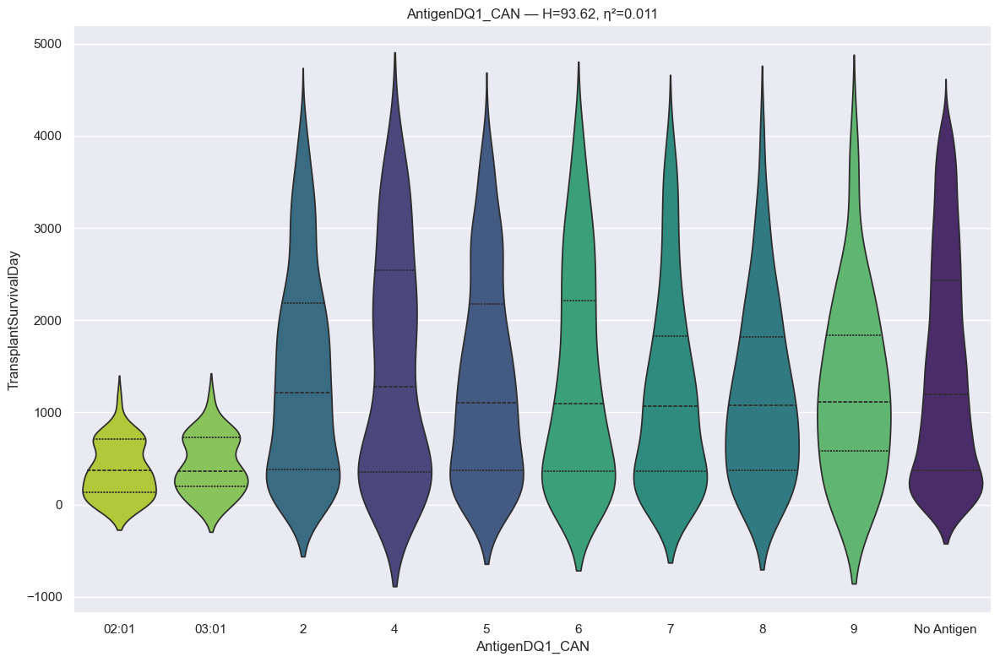

RANKING REPORT: AntigenDQ1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 02:01                                             :     44 records
 * 03:01                                             :     30 records
 * 2                                                 :    858 records
 * 4                                                 :    156 records
 * 5                                                 :    420 records
 * 6                                                 :    366 records
 * 7                                                 :    436 records
 * 8                                                 :    144 records
 * 9                                                 :     58 records
 * No Antigen                                        :   5457 records
BYPASSED CATEGORIES (n < min_n):
 * 02:02                                             :     27 records
 * 03:02                                             :     16 records
 * 03:03                                             :      5 reco

In [177]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [178]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDQ1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 02:01                                             :     44 records
 * 03:01                                             :     30 records
 * 2                                                 :    858 records
 * 4                                                 :    156 records
 * 5                                                 :    420 records
 * 6                                                 :    366 records
 * 7                                                 :    436 records
 * 8                                                 :    144 records
 * 9                                                 :     58 records
 * No Antigen                                        :   5457 records
BYPASSED CATEGORIES (n < min_n):
 * 02:02                                             :     27 records
 * 03:02                                             :     16 records
 * 03:03                                             :      5 reco

In [179]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen DQ2
* HLA-DQ antigen matching in transplantation is crucial for long-term graft survival. Mismatches can lead to de novo donor-specific antibodies (dnDSAs), which are commonly linked to chronic rejection and graft failure. Anti-HLA-DQ antibodies, particularly Class II, are resistant to desensitization, making their monitoring essential.

In [180]:
# info
feature = u.get_feature_info(df, 'AntigenDQ2_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique         top  freq
AntigenDQ2_CAN  8064     24  No Antigen  5739

:::: NaN Count:
AntigenDQ2_CAN    0 



{'AntigenDQ2_CAN': CategoricalDtype(categories=['02:01', '02:02', '03:01', '03:02', '03:03', '03:19',
                   '04:02', '05:01', '05:02', '05:03', '06:01', '06:02',
                   '06:03', '06:04', '06:09', '1', '2', '3', '4', '5', '6', '7',
                   '8', '9', 'No Antigen'],
 , ordered=False, categories_dtype=str)}

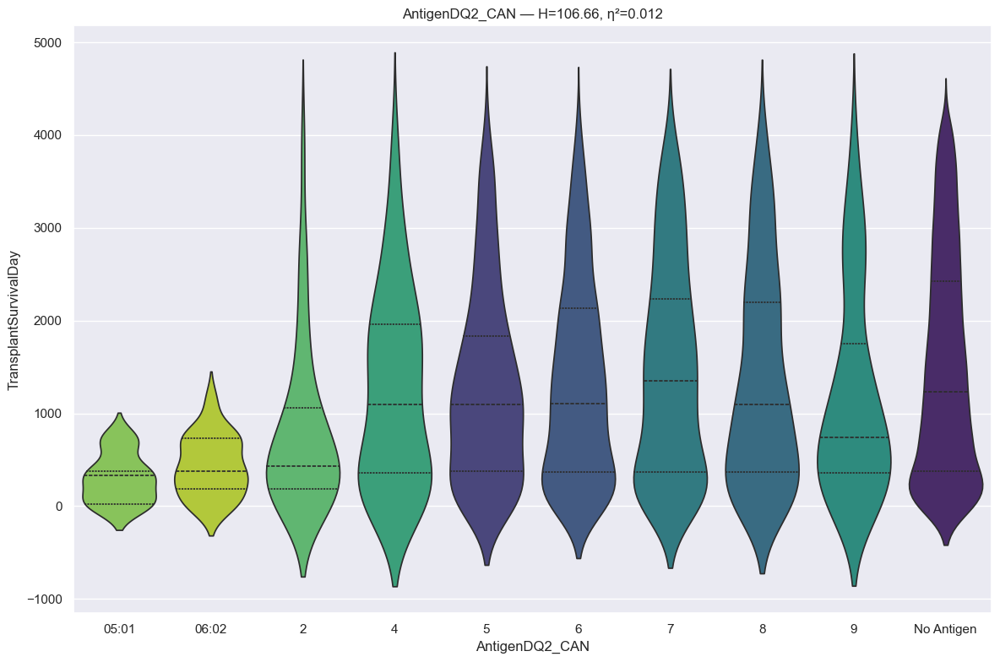

RANKING REPORT: AntigenDQ2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 05:01                                             :     32 records
 * 06:02                                             :     33 records
 * 2                                                 :     66 records
 * 4                                                 :     81 records
 * 5                                                 :    359 records
 * 6                                                 :    768 records
 * 7                                                 :    482 records
 * 8                                                 :    306 records
 * 9                                                 :    107 records
 * No Antigen                                        :   5739 records
BYPASSED CATEGORIES (n < min_n):
 * 02:01                                             :      3 records
 * 02:02                                             :      3 records
 * 03:01                                             :     15 reco

In [181]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [182]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenDQ2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 05:01                                             :     32 records
 * 06:02                                             :     33 records
 * 2                                                 :     66 records
 * 4                                                 :     81 records
 * 5                                                 :    359 records
 * 6                                                 :    768 records
 * 7                                                 :    482 records
 * 8                                                 :    306 records
 * 9                                                 :    107 records
 * No Antigen                                        :   5739 records
BYPASSED CATEGORIES (n < min_n):
 * 02:01                                             :      3 records
 * 02:02                                             :      3 records
 * 03:01                                             :     15 reco

In [183]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Functional Status Transplant

In [184]:
# info
feature = u.get_feature_info(df, 'FunctionalStatusTransplant_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                               count unique top  freq
FunctionalStatusTransplant_CAN  8064     10  20  2656

:::: NaN Count:
FunctionalStatusTransplant_CAN    0 



{'FunctionalStatusTransplant_CAN': CategoricalDtype(categories=['10', '100', '20', '30', '40', '50', '60', '70', '80', '90'], ordered=False, categories_dtype=str)}

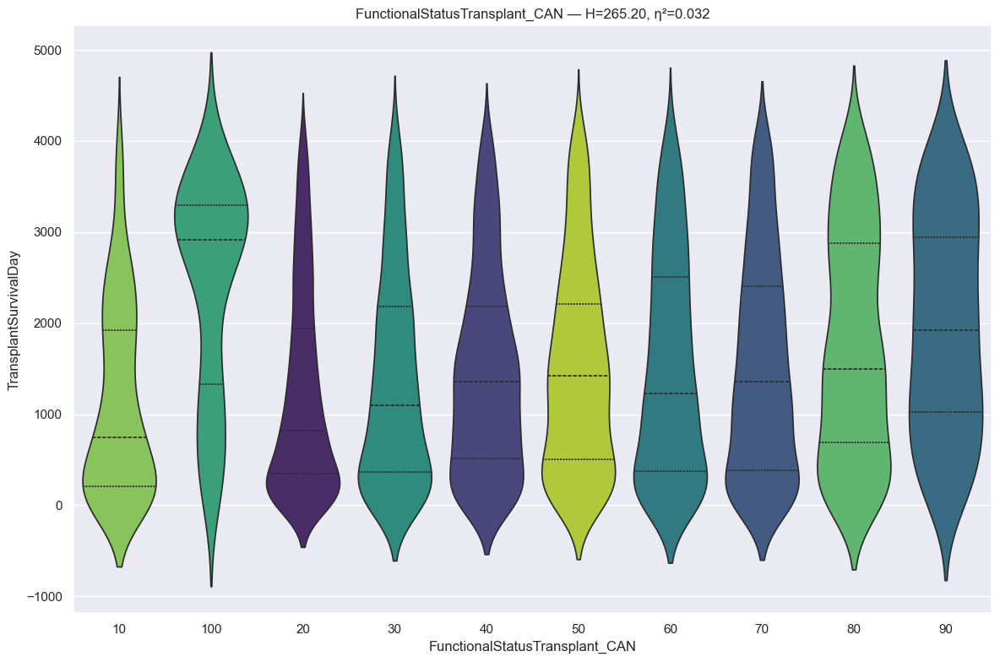

RANKING REPORT: FunctionalStatusTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 10                                                :    311 records
 * 100                                               :    112 records
 * 20                                                :   2656 records
 * 30                                                :    709 records
 * 40                                                :   1097 records
 * 50                                                :    797 records
 * 60                                                :    744 records
 * 70                                                :    904 records
 * 80                                                :    532 records
 * 90                                                :    202 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 265.1968 | P-value: 6.137912e-52 | Effect η²: 0.0318
Correction Method: BONFERRONI
Pairwise Testing (Bonf

In [185]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [186]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: FunctionalStatusTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 10                                                :    311 records
 * 100                                               :    112 records
 * 20                                                :   2656 records
 * 30                                                :    709 records
 * 40                                                :   1097 records
 * 50                                                :    797 records
 * 60                                                :    744 records
 * 70                                                :    904 records
 * 80                                                :    532 records
 * 90                                                :    202 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 265.1968 | P-value: 6.137912e-52 | Effect η²: 0.0318
Correction Method: HOLM
Pairwise Testing (Base Alpha

In [187]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Medical Condition Transplant

In [188]:
# info
feature = u.get_feature_info(df, 'MedicalConditionTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                               count unique               top  freq
MedicalConditionTransplant_CAN  8064      4  Not Hospitalized  3945

:::: NaN Count:
MedicalConditionTransplant_CAN    0 



{'MedicalConditionTransplant_CAN': CategoricalDtype(categories=['Hospitalized Not in ICU', 'In Intensive Care Unit',
                   'Not Hospitalized', 'Unknown'],
 , ordered=False, categories_dtype=str)}

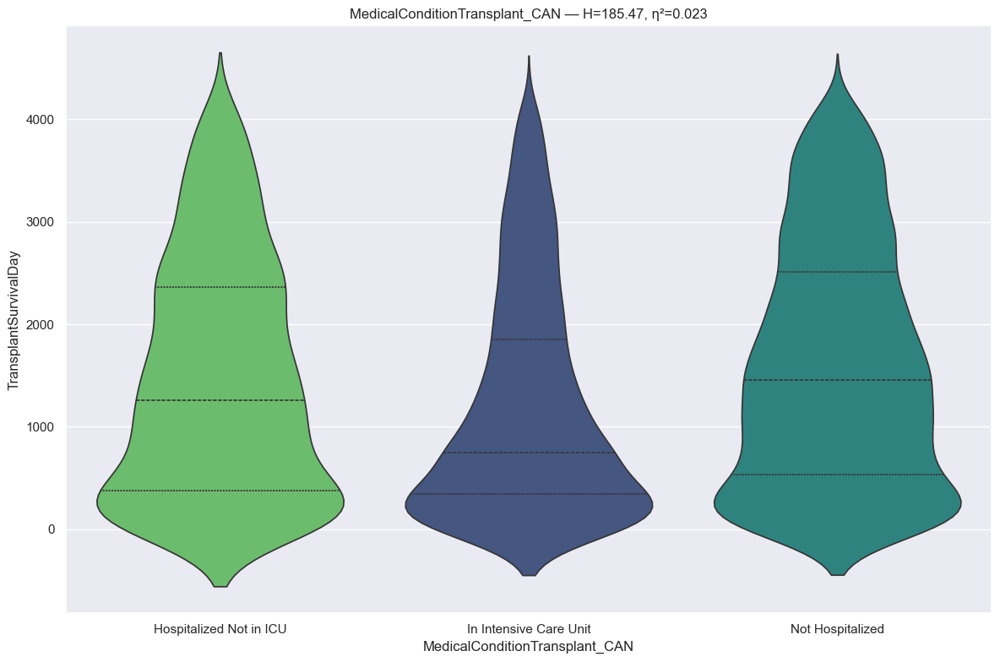

RANKING REPORT: MedicalConditionTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Hospitalized Not in ICU                           :   1200 records
 * In Intensive Care Unit                            :   2905 records
 * Not Hospitalized                                  :   3945 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     14 records
--------------------------------------------------------------------------------
Kruskal H: 185.4730 | P-value: 5.309471e-41 | Effect η²: 0.0228
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
In Intensive Care Unit vs Not Hospitalized | p=5.2261e-42 | thr=0.0167 | r= 0.192 | *Sig*
Hospitalized Not in ICU vs In Intensive Care Unit | p=3.2241e-11 | thr=0.0167 | r=-0.131 | *Sig*
Hospitalized Not in ICU vs Not Hospitalized | p=2.0497e-03 | thr=0.0167 | r= 0.059 | *Sig*
::::: Collap

In [189]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [190]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Primary Payment Transplant

In [191]:
# info
feature = u.get_feature_info(df, 'PrimaryPaymentTransplant_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                             count unique                top  freq
PrimaryPaymentTransplant_CAN  8064     12  Private insurance  3955

:::: NaN Count:
PrimaryPaymentTransplant_CAN    0 



{'PrimaryPaymentTransplant_CAN': CategoricalDtype(categories=['Donation', 'Foreign Government Specify', 'Free Care',
                   'Missing', 'Private insurance',
                   'Public insurance - CHIP (Children's Health Insurance Program)',
                   'Public insurance - Department of VA',
                   'Public insurance - Medicaid',
                   'Public insurance - Medicare & Choice',
                   'Public insurance - Medicare FFS (Fee for Service)',
                   'Public insurance - Other government', 'Self'],
 , ordered=False, categories_dtype=str)}

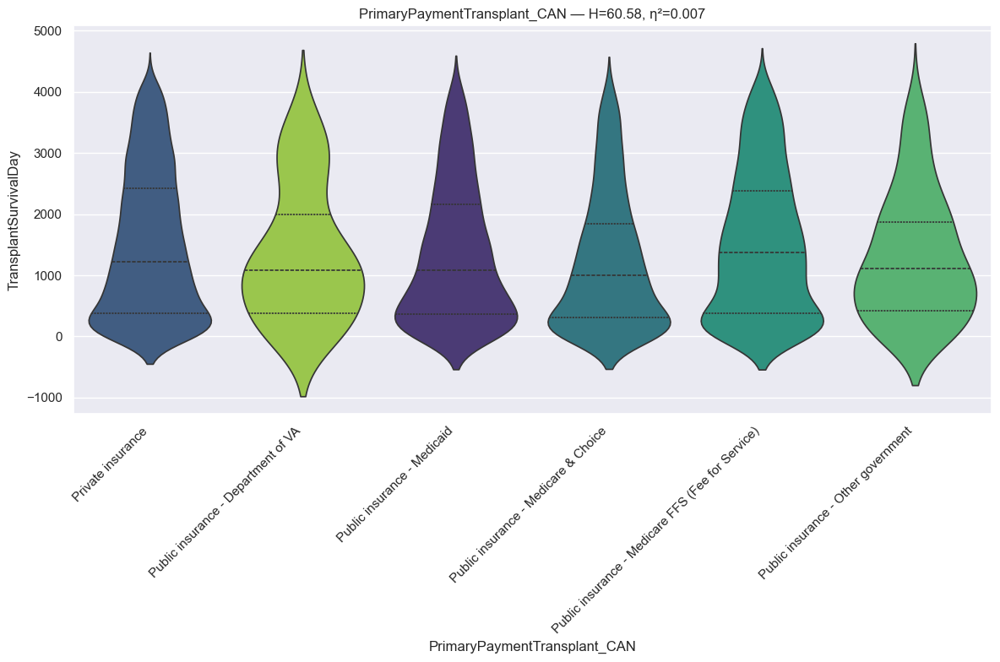

RANKING REPORT: PrimaryPaymentTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Private insurance                                 :   3955 records
 * Public insurance - Department of VA               :     55 records
 * Public insurance - Medicaid                       :   1185 records
 * Public insurance - Medicare & Choice              :   1180 records
 * Public insurance - Medicare FFS (Fee for Service) :   1508 records
 * Public insurance - Other government               :    110 records
BYPASSED CATEGORIES (n < min_n):
 * Donation                                          :      1 records
 * Foreign Government Specify                        :     17 records
 * Free Care                                         :     15 records
 * Missing                                           :     13 records
 * Public insurance - CHIP (Children's Health Insurance Program):      3 records
 * Self                                              :     22 records
-----------------------------------------

In [192]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [193]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PrimaryPaymentTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Private insurance                                 :   3955 records
 * Public insurance - Department of VA               :     55 records
 * Public insurance - Medicaid                       :   1185 records
 * Public insurance - Medicare & Choice              :   1180 records
 * Public insurance - Medicare FFS (Fee for Service) :   1508 records
 * Public insurance - Other government               :    110 records
BYPASSED CATEGORIES (n < min_n):
 * Donation                                          :      1 records
 * Foreign Government Specify                        :     17 records
 * Free Care                                         :     15 records
 * Missing                                           :     13 records
 * Public insurance - CHIP (Children's Health Insurance Program):      3 records
 * Self                                              :     22 records
-----------------------------------------

In [194]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Transplant ECMO

In [195]:
# info
feature = u.get_feature_info(df, 'LifeSupportTransplant_ECMO', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                               count unique top  freq
LifeSupportTransplant_ECMO_CAN  8064      2  No  7880

:::: NaN Count:
LifeSupportTransplant_ECMO_CAN    0 



{'LifeSupportTransplant_ECMO_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

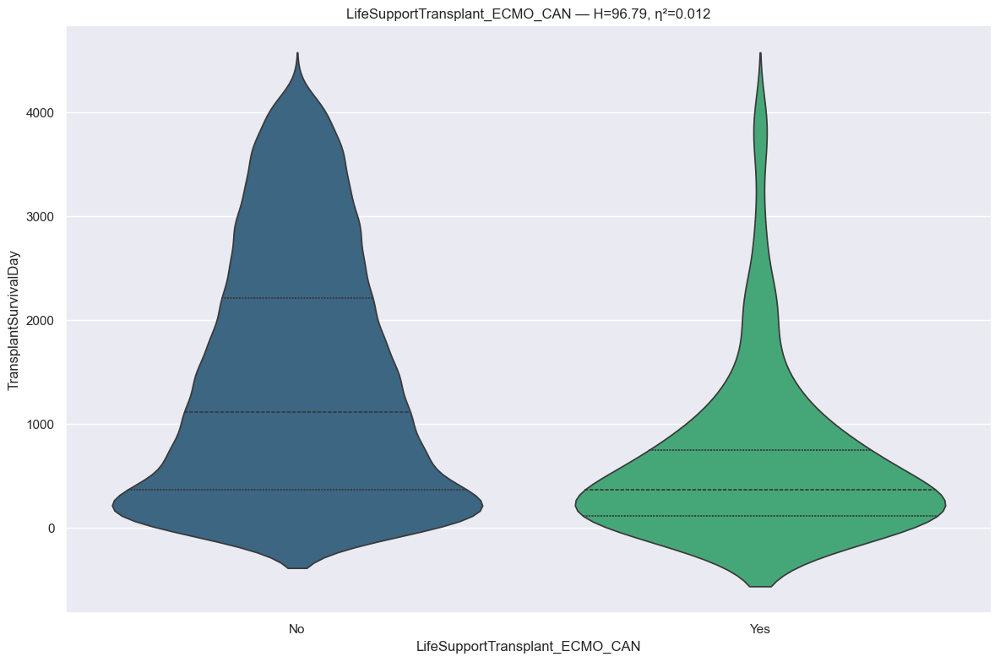

RANKING REPORT: LifeSupportTransplant_ECMO_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7880 records
 * Yes                                               :    184 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 96.7899 | P-value: 7.708668e-23 | Effect η²: 0.0119
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=7.7099e-23 | thr=0.0500 | r=-0.424 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

LifeSupportTransplant_ECMO_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                   

In [196]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [197]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Residency State Transplant

In [198]:
# info
feature = u.get_feature_info(df, 'ResidencyStateTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                             count unique top freq
ResidencyStateTransplant_CAN  8064     54  CA  888

:::: NaN Count:
ResidencyStateTransplant_CAN    0 



{'ResidencyStateTransplant_CAN': CategoricalDtype(categories=['AK', 'AL', 'AR', 'AZ', 'CA', 'CO', 'CT', 'DC', 'DE', 'FL',
                   'GA', 'HI', 'IA', 'ID', 'IL', 'IN', 'KS', 'KY', 'LA', 'MA',
                   'MD', 'ME', 'MI', 'MN', 'MO', 'MS', 'MT', 'NC', 'ND', 'NE',
                   'NH', 'NJ', 'NM', 'NV', 'NY', 'OH', 'OK', 'OR', 'PA', 'PR',
                   'RI', 'SC', 'SD', 'TN', 'TX', 'UT', 'Unknown', 'VA', 'VI',
                   'VT', 'WA', 'WI', 'WV', 'WY', 'ZZ'],
 , ordered=False, categories_dtype=str)}

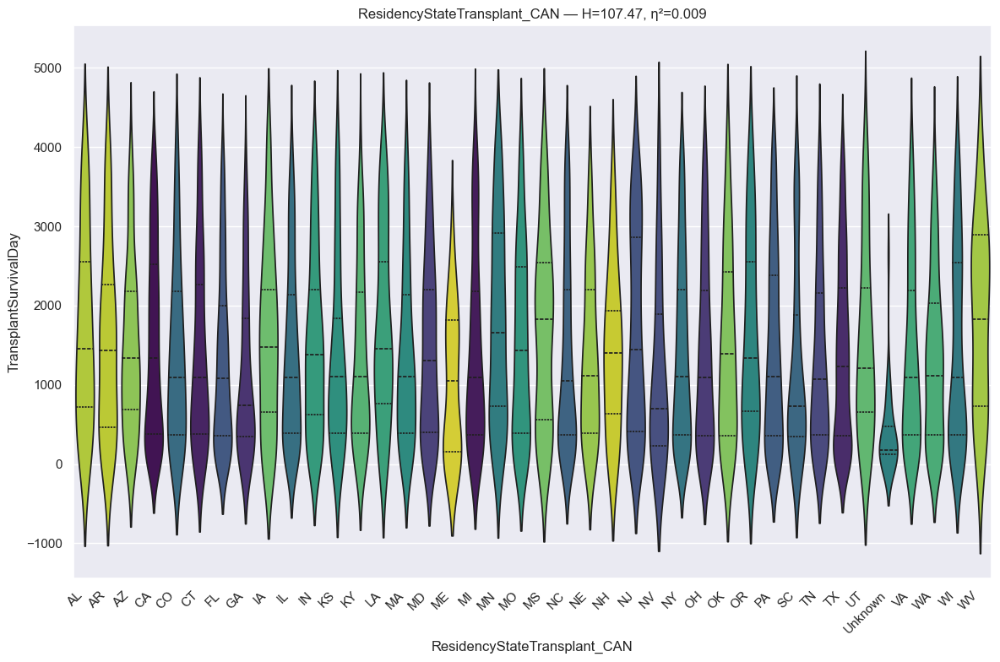

RANKING REPORT: ResidencyStateTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * AL                                                :     69 records
 * AR                                                :     63 records
 * AZ                                                :    130 records
 * CA                                                :    888 records
 * CO                                                :    100 records
 * CT                                                :    141 records
 * FL                                                :    520 records
 * GA                                                :    179 records
 * IA                                                :     85 records
 * IL                                                :    361 records
 * IN                                                :    212 records
 * KS                                                :     90 records
 * KY                                                :    121 records
 * LA          

In [199]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [200]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: ResidencyStateTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * AL                                                :     69 records
 * AR                                                :     63 records
 * AZ                                                :    130 records
 * CA                                                :    888 records
 * CO                                                :    100 records
 * CT                                                :    141 records
 * FL                                                :    520 records
 * GA                                                :    179 records
 * IA                                                :     85 records
 * IL                                                :    361 records
 * IN                                                :    212 records
 * KS                                                :     90 records
 * KY                                                :    121 records
 * LA          

In [201]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Work Income Transplant

In [202]:
# info
feature = u.get_feature_info(df, 'WorkIncomeTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique top  freq
WorkIncomeTransplant_CAN  8064      3  No  6968

:::: NaN Count:
WorkIncomeTransplant_CAN    0 



{'WorkIncomeTransplant_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

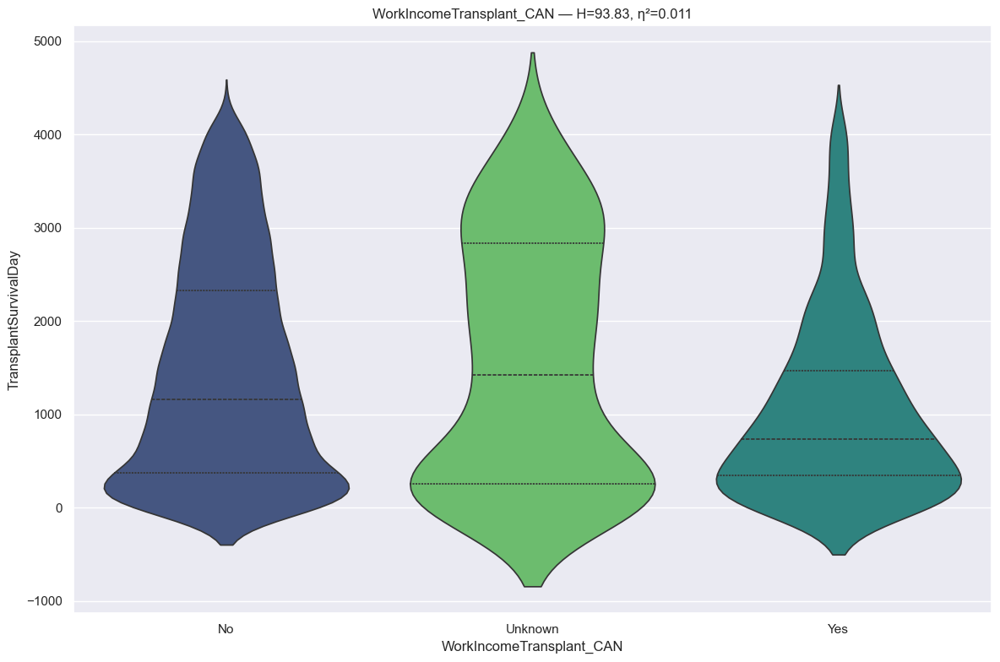

RANKING REPORT: WorkIncomeTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6968 records
 * Unknown                                           :    274 records
 * Yes                                               :    822 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 93.8311 | P-value: 4.215418e-21 | Effect η²: 0.0114
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.6825e-22 | thr=0.0167 | r=-0.207 | *Sig*
Unknown      vs Yes          | p=6.8166e-06 | thr=0.0167 | r=-0.181 | *Sig*
No           vs Unknown      | p=8.3560e-01 | thr=0.0167 | r= 0.007 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> G

In [203]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [204]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: WorkIncomeTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6968 records
 * Unknown                                           :    274 records
 * Yes                                               :    822 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 93.8311 | P-value: 4.215418e-21 | Effect η²: 0.0114
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Unknown

>>> Group_2 (1 categories)
  - Yes



In [205]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Transplant PGE

In [206]:
# info
feature = u.get_feature_info(df, 'LifeSupportTransplant_PGE', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                              count unique top  freq
LifeSupportTransplant_PGE_CAN  8064      2  No  8039

:::: NaN Count:
LifeSupportTransplant_PGE_CAN    0 



{'LifeSupportTransplant_PGE_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

In [207]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for LifeSupportTransplant_PGE_CAN
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

LifeSupportTransplant_PGE_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                           No          1422.35278                1111.0                 4195.0                    0.0          8039
                          Yes          2015.16000                2547.0                 4015.0                    2.0            25


In [208]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** Unable to determine statistical significance due to small sample size, removing this feature is reasonable due to its extreme sparsity and imbalance.

#### Dialysis Between Registration Transplant

In [209]:
# info
feature = u.get_feature_info(df, 'DialysisBetweenRegistrationTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                          count unique top  freq
DialysisBetweenRegistrationTransplant_CAN  8064      3  No  7750

:::: NaN Count:
DialysisBetweenRegistrationTransplant_CAN    0 



{'DialysisBetweenRegistrationTransplant_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

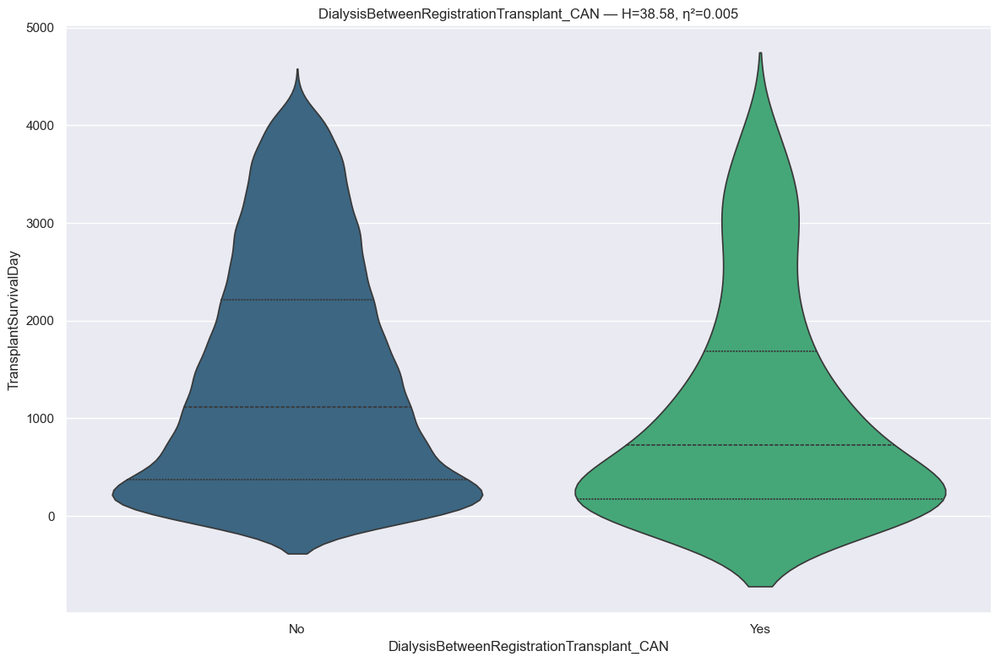

RANKING REPORT: DialysisBetweenRegistrationTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7750 records
 * Yes                                               :    294 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     20 records
--------------------------------------------------------------------------------
Kruskal H: 38.5774 | P-value: 5.262516e-10 | Effect η²: 0.0047
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=5.2629e-10 | thr=0.0500 | r=-0.213 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown

DialysisBetweenRegistratio

In [210]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [211]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### LifeSupportTransplant IABP

In [212]:
# info
feature = u.get_feature_info(df, 'LifeSupportTransplant_IABP', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                               count unique top  freq
LifeSupportTransplant_IABP_CAN  8064      2  No  7041

:::: NaN Count:
LifeSupportTransplant_IABP_CAN    0 



{'LifeSupportTransplant_IABP_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

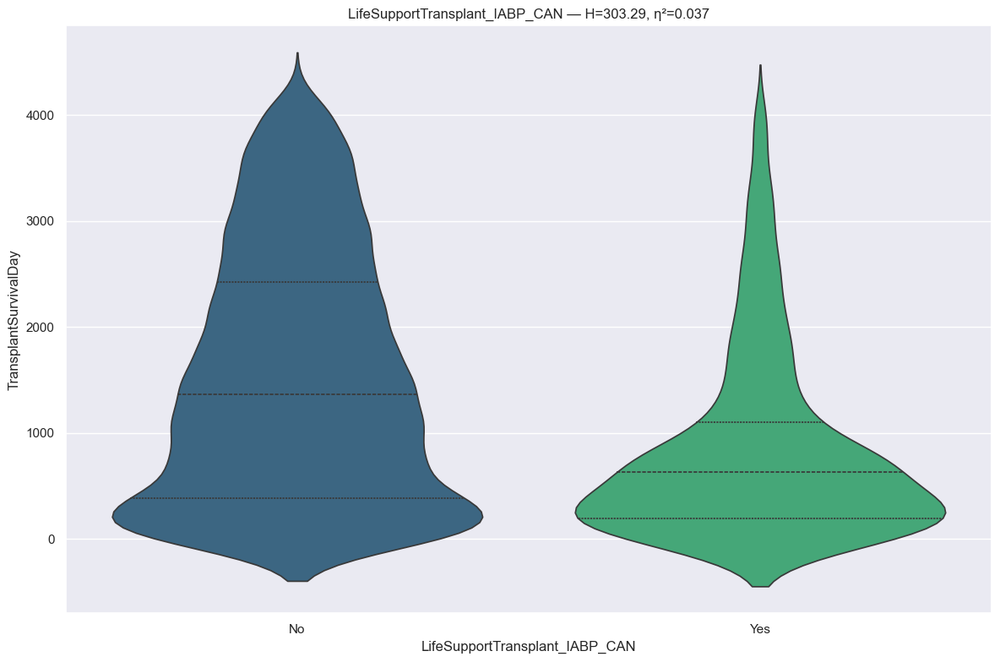

RANKING REPORT: LifeSupportTransplant_IABP_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7041 records
 * Yes                                               :   1023 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 303.2898 | P-value: 6.324929e-68 | Effect η²: 0.0375
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=6.3257e-68 | thr=0.0500 | r=-0.336 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

LifeSupportTransplant_IABP_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                  

In [213]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [214]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Infection Therapy IV

In [215]:
# info
feature = u.get_feature_info(df, 'InfectionTherapyIV', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique top  freq
InfectionTherapyIV_CAN  8064      3  No  7224

:::: NaN Count:
InfectionTherapyIV_CAN    0 



{'InfectionTherapyIV_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

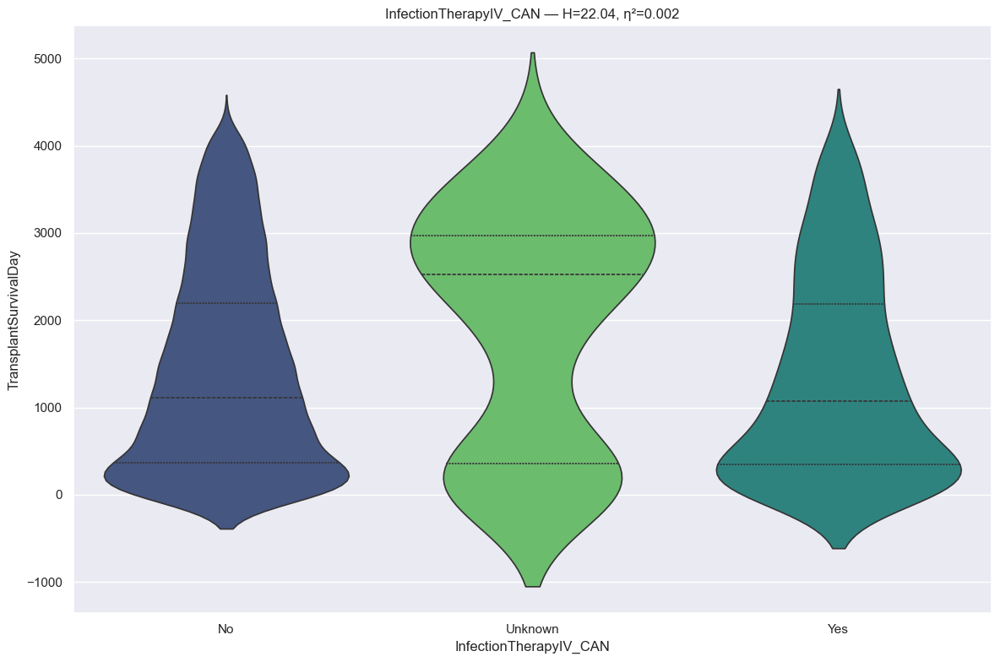

RANKING REPORT: InfectionTherapyIV_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7224 records
 * Unknown                                           :    107 records
 * Yes                                               :    733 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 22.0447 | P-value: 1.633293e-05 | Effect η²: 0.0025
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=3.0750e-05 | thr=0.0167 | r=-0.249 | *Sig*
No           vs Unknown      | p=1.7854e-04 | thr=0.0167 | r= 0.211 | *Sig*
No           vs Yes          | p=5.9038e-03 | thr=0.0167 | r=-0.062 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group

In [216]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [217]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes IV Transplant

In [218]:
# info
feature = u.get_feature_info(df, 'InotropesIVTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique top  freq
InotropesIVTransplant_CAN  8064      2  No  4742

:::: NaN Count:
InotropesIVTransplant_CAN    0 



{'InotropesIVTransplant_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

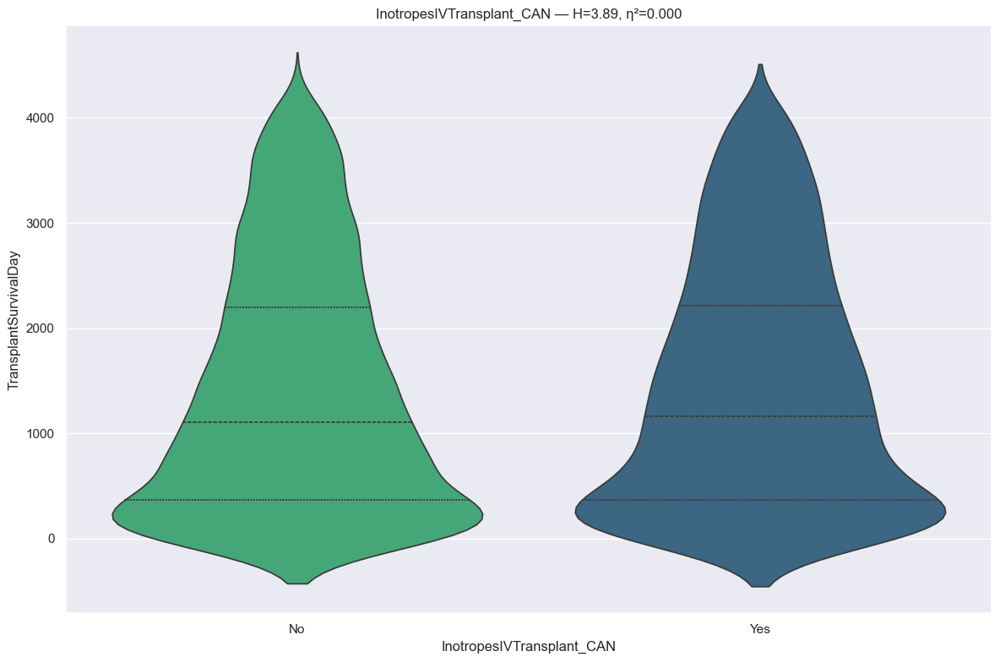

RANKING REPORT: InotropesIVTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4742 records
 * Yes                                               :   3322 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 3.8891 | P-value: 4.859931e-02 | Effect η²: 0.0004
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=4.8600e-02 | thr=0.0500 | r= 0.026 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

InotropesIVTransplant_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                       No     

In [219]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [220]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Transplant CO

In [221]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsTransplant_CO', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                       count unique top  freq
InotropesVasodilatorsTransplant_CO_CAN  8064      3  No  4308

:::: NaN Count:
InotropesVasodilatorsTransplant_CO_CAN    0 



{'InotropesVasodilatorsTransplant_CO_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

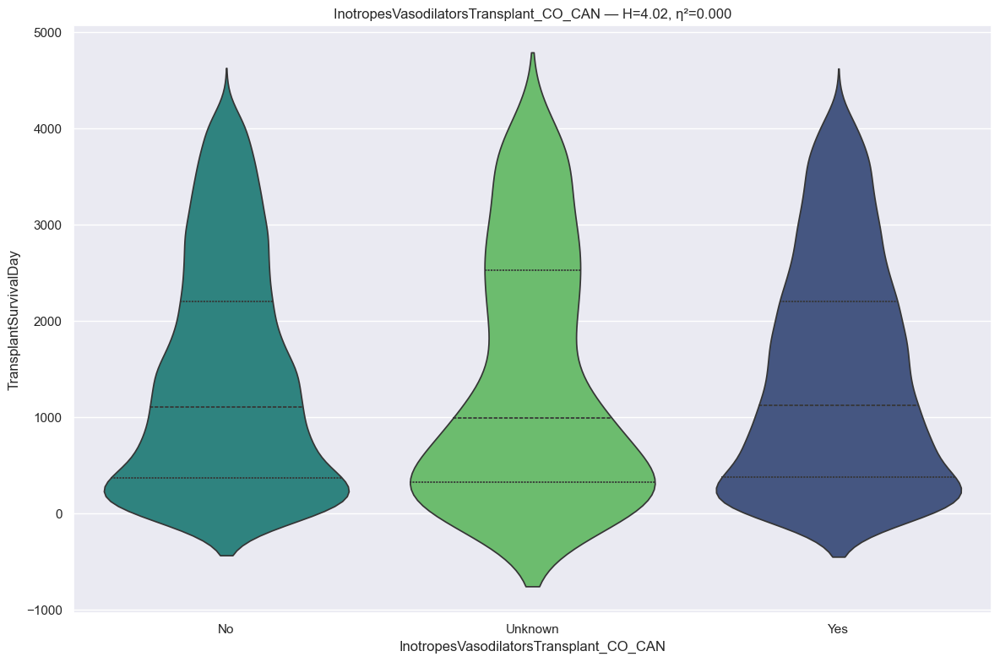

RANKING REPORT: InotropesVasodilatorsTransplant_CO_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4308 records
 * Unknown                                           :    397 records
 * Yes                                               :   3359 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 4.0197 | P-value: 1.340113e-01 | Effect η²: 0.0003
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=6.6883e-02 | thr=0.0167 | r= 0.056 | Not Sig
No           vs Unknown      | p=1.4639e-01 | thr=0.0167 | r=-0.044 | Not Sig
No           vs Yes          | p=2.5601e-01 | thr=0.0167 | r= 0.015 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::

In [222]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [223]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropesVasodilatorsTransplant_CO_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4308 records
 * Unknown                                           :    397 records
 * Yes                                               :   3359 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 4.0197 | P-value: 1.340113e-01 | Effect η²: 0.0003
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [224]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Transplant DIA

In [225]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsTransplant_DIA', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                        count unique top  freq
InotropesVasodilatorsTransplant_DIA_CAN  8064      3  No  4364

:::: NaN Count:
InotropesVasodilatorsTransplant_DIA_CAN    0 



{'InotropesVasodilatorsTransplant_DIA_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

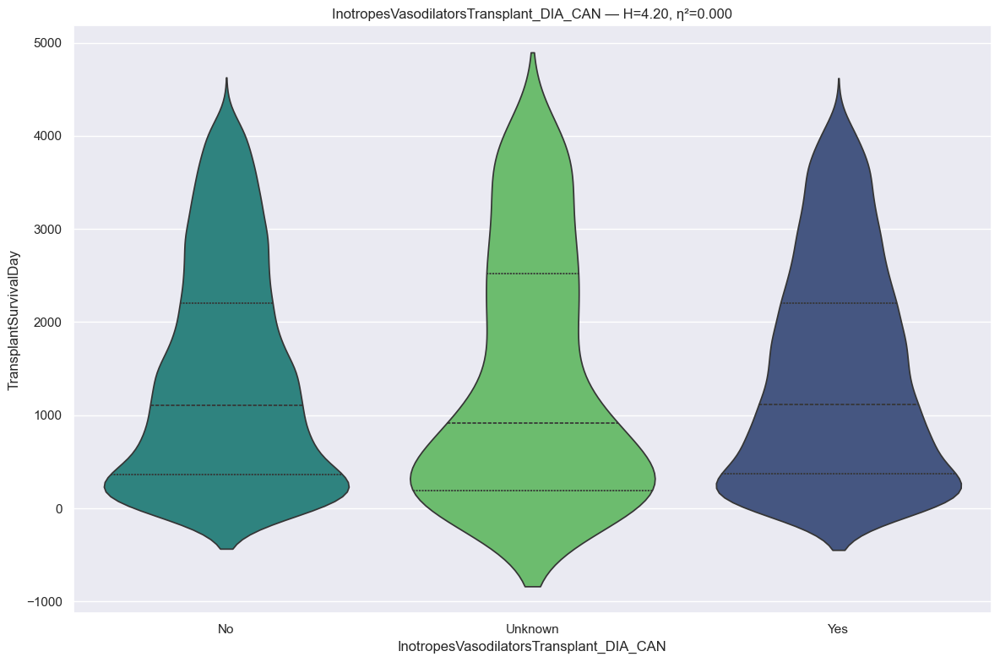

RANKING REPORT: InotropesVasodilatorsTransplant_DIA_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4364 records
 * Unknown                                           :    282 records
 * Yes                                               :   3418 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 4.2042 | P-value: 1.222000e-01 | Effect η²: 0.0003
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=5.8783e-02 | thr=0.0167 | r= 0.068 | Not Sig
No           vs Unknown      | p=1.1089e-01 | thr=0.0167 | r=-0.057 | Not Sig
No           vs Yes          | p=2.8511e-01 | thr=0.0167 | r= 0.014 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::

In [226]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [227]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropesVasodilatorsTransplant_DIA_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4364 records
 * Unknown                                           :    282 records
 * Yes                                               :   3418 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 4.2042 | P-value: 1.222000e-01 | Effect η²: 0.0003
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [228]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Transplant MN

In [229]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsTransplant_MN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                       count unique top  freq
InotropesVasodilatorsTransplant_MN_CAN  8064      3  No  4340

:::: NaN Count:
InotropesVasodilatorsTransplant_MN_CAN    0 



{'InotropesVasodilatorsTransplant_MN_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

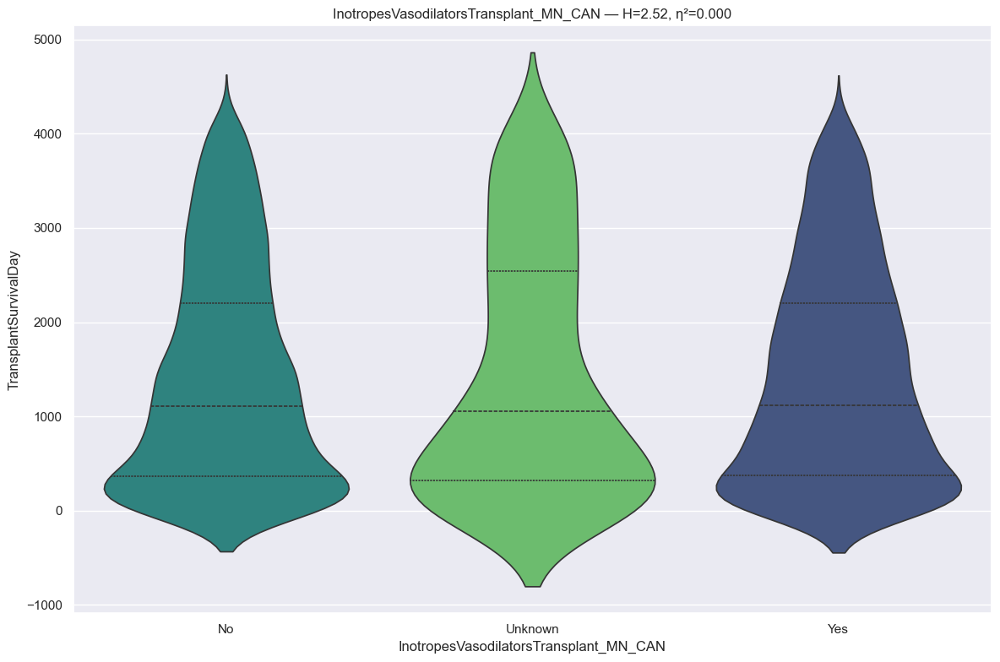

RANKING REPORT: InotropesVasodilatorsTransplant_MN_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4340 records
 * Unknown                                           :    347 records
 * Yes                                               :   3377 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2.5234 | P-value: 2.831774e-01 | Effect η²: 0.0001
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=1.6473e-01 | thr=0.0167 | r= 0.045 | Not Sig
No           vs Unknown      | p=2.8809e-01 | thr=0.0167 | r=-0.034 | Not Sig
No           vs Yes          | p=3.1228e-01 | thr=0.0167 | r= 0.013 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::

In [230]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [231]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Inotropes Vasodilators Transplant PCW

In [232]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsTransplant_PCW', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                        count unique top  freq
InotropesVasodilatorsTransplant_PCW_CAN  8064      3  No  4324

:::: NaN Count:
InotropesVasodilatorsTransplant_PCW_CAN    0 



{'InotropesVasodilatorsTransplant_PCW_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

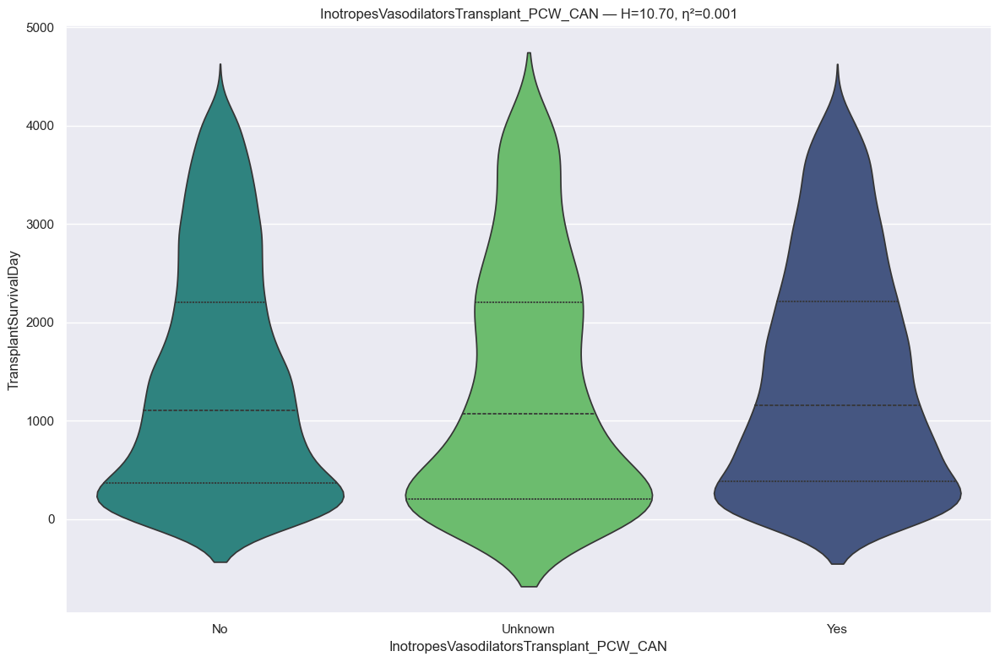

RANKING REPORT: InotropesVasodilatorsTransplant_PCW_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4324 records
 * Unknown                                           :    612 records
 * Yes                                               :   3128 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 10.6983 | P-value: 4.752083e-03 | Effect η²: 0.0011
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=2.4640e-03 | thr=0.0167 | r= 0.077 | *Sig*
No           vs Unknown      | p=2.9707e-02 | thr=0.0167 | r=-0.054 | Not Sig
No           vs Yes          | p=4.9753e-02 | thr=0.0167 | r= 0.027 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::

In [233]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [234]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropesVasodilatorsTransplant_PCW_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4324 records
 * Unknown                                           :    612 records
 * Yes                                               :   3128 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 10.6983 | P-value: 4.752083e-03 | Effect η²: 0.0011
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [235]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Inotropes Vasodilators Transplant SYS

In [236]:
# info
feature = u.get_feature_info(df, 'InotropesVasodilatorsTransplant_SYS', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                        count unique top  freq
InotropesVasodilatorsTransplant_SYS_CAN  8064      3  No  4368

:::: NaN Count:
InotropesVasodilatorsTransplant_SYS_CAN    0 



{'InotropesVasodilatorsTransplant_SYS_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

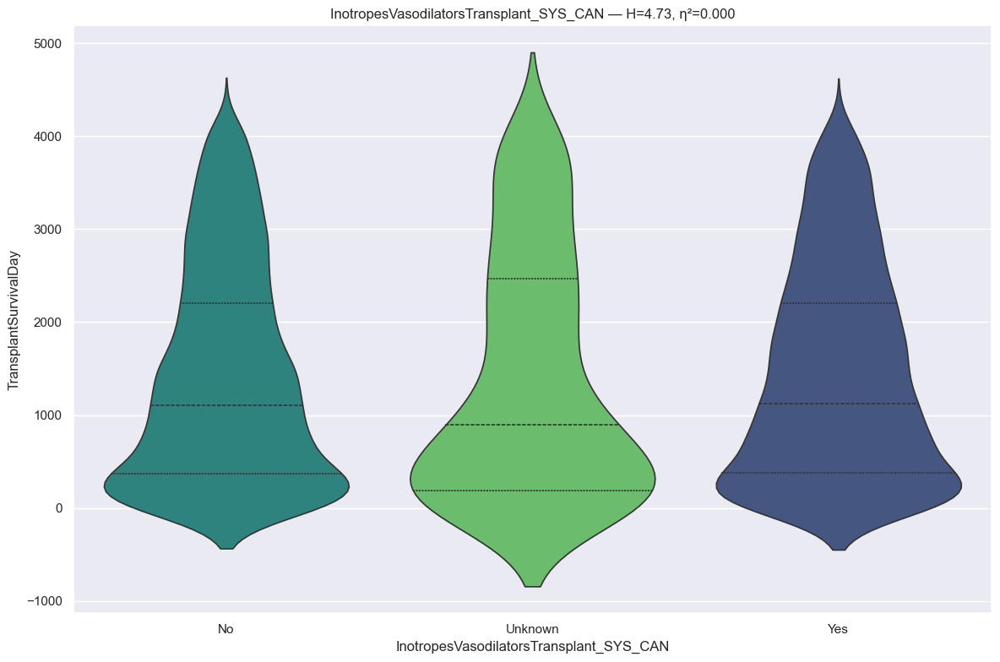

RANKING REPORT: InotropesVasodilatorsTransplant_SYS_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4368 records
 * Unknown                                           :    276 records
 * Yes                                               :   3420 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 4.7333 | P-value: 9.379336e-02 | Effect η²: 0.0003
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=4.2536e-02 | thr=0.0167 | r= 0.073 | Not Sig
No           vs Unknown      | p=8.3645e-02 | thr=0.0167 | r=-0.062 | Not Sig
No           vs Yes          | p=2.8034e-01 | thr=0.0167 | r= 0.014 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::

In [237]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [238]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: InotropesVasodilatorsTransplant_SYS_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   4368 records
 * Unknown                                           :    276 records
 * Yes                                               :   3420 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 4.7333 | P-value: 9.379336e-02 | Effect η²: 0.0003
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [239]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Mechanism Transplant OTHER

In [240]:
# info
feature = u.get_feature_info(df, 'LifeSupportMechanismTransplant_OTHER', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                         count unique top  freq
LifeSupportMechanismTransplant_OTHER_CAN  8064      2  No  7612

:::: NaN Count:
LifeSupportMechanismTransplant_OTHER_CAN    0 



{'LifeSupportMechanismTransplant_OTHER_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

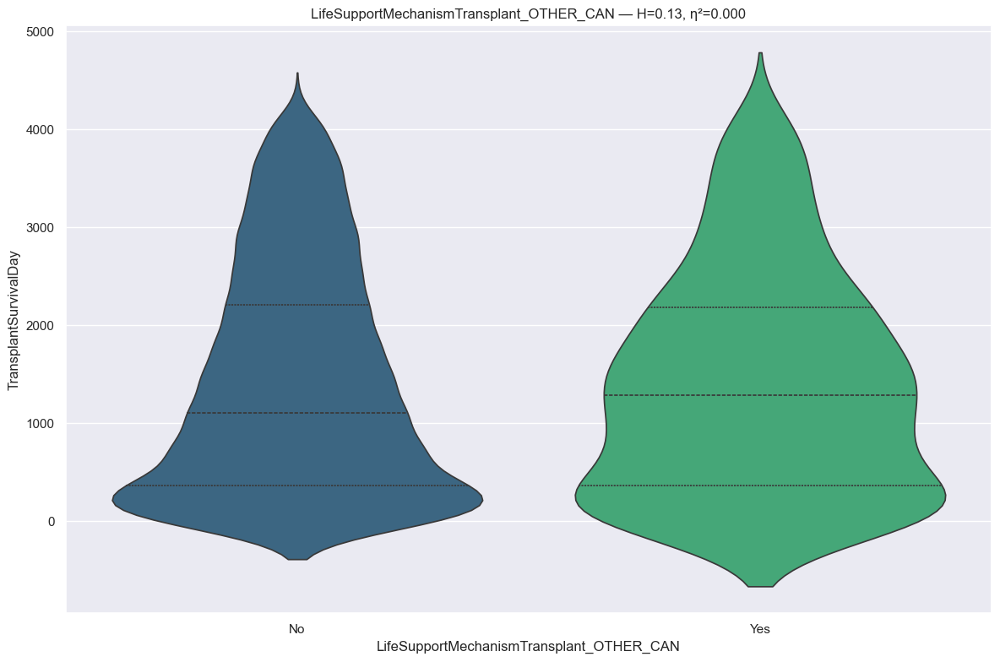

RANKING REPORT: LifeSupportMechanismTransplant_OTHER_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7612 records
 * Yes                                               :    452 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.1346 | P-value: 7.136967e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=7.1370e-01 | thr=0.0500 | r=-0.010 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

LifeSupportMechanismTransplant_OTHER_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                          

In [241]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [242]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Prior Lung Surgery After Registration

In [243]:
# info
feature = u.get_feature_info(df, 'PriorLungSurgeryAfterRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                      count unique top  freq
PriorLungSurgeryAfterRegistration_CAN  8064      3  No  7996

:::: NaN Count:
PriorLungSurgeryAfterRegistration_CAN    0 



{'PriorLungSurgeryAfterRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

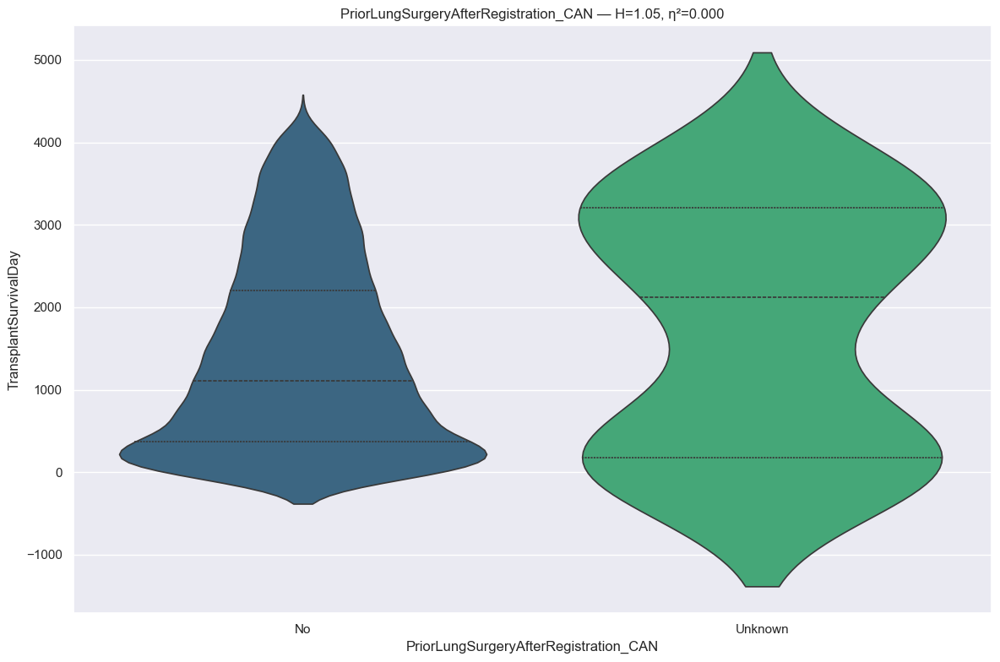

RANKING REPORT: PriorLungSurgeryAfterRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7996 records
 * Unknown                                           :     42 records
BYPASSED CATEGORIES (n < min_n):
 * Yes                                               :     26 records
--------------------------------------------------------------------------------
Kruskal H: 1.0524 | P-value: 3.049632e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=3.0498e-01 | thr=0.0500 | r= 0.092 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Unknown

>>> Other (1 categories)
  - Yes

PriorLungSurgeryAfterRegistration_CAN  mean_survival_days

In [244]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [245]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature is not statistically significant given the underpowered sample size; removing it is reasonable due to its extreme sparsity and imbalance.

#### Steroids Use

In [246]:
# info
feature = u.get_feature_info(df, 'SteroidsUse', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
SteroidsUse_CAN  8064      3  No  7294

:::: NaN Count:
SteroidsUse_CAN    0 



{'SteroidsUse_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

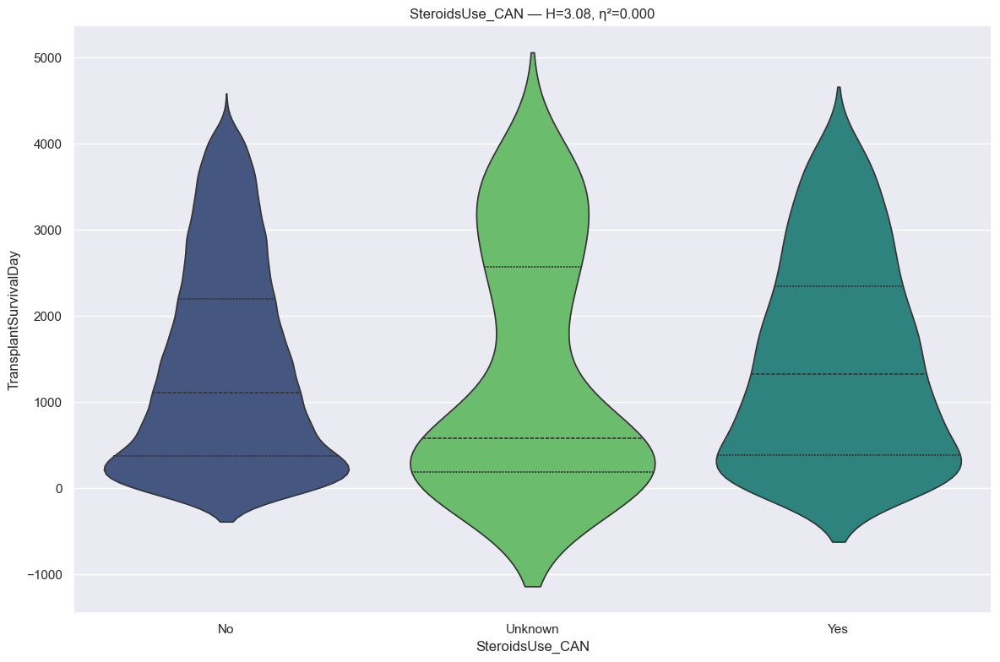

RANKING REPORT: SteroidsUse_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7294 records
 * Unknown                                           :     80 records
 * Yes                                               :    690 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 3.0808 | P-value: 2.142911e-01 | Effect η²: 0.0001
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=1.7648e-01 | thr=0.0167 | r= 0.092 | Not Sig
No           vs Yes          | p=1.8962e-01 | thr=0.0167 | r= 0.030 | Not Sig
No           vs Unknown      | p=2.5091e-01 | thr=0.0167 | r=-0.075 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1

In [247]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [248]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: SteroidsUse_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7294 records
 * Unknown                                           :     80 records
 * Yes                                               :    690 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 3.0808 | P-value: 2.142911e-01 | Effect η²: 0.0001
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Group_2 (1 categories)
  - Unknown



In [249]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Transfusion After Registration

In [250]:
# info
feature = u.get_feature_info(df, 'TransfusionAfterRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                 count unique top  freq
TransfusionAfterRegistration_CAN  8064      3  No  6450

:::: NaN Count:
TransfusionAfterRegistration_CAN    0 



{'TransfusionAfterRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

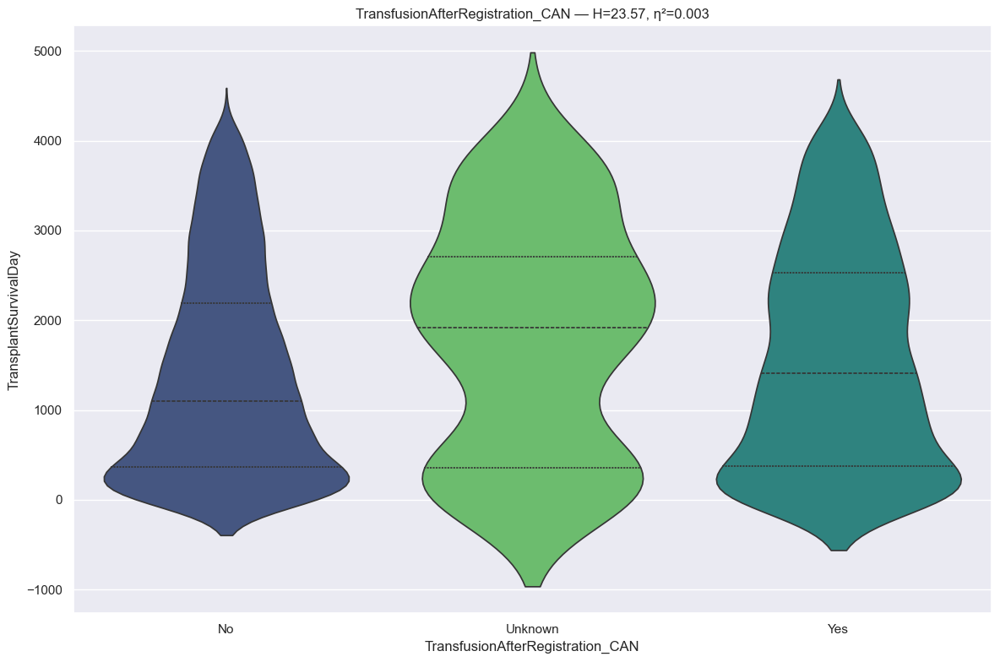

RANKING REPORT: TransfusionAfterRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6450 records
 * Unknown                                           :    132 records
 * Yes                                               :   1482 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 23.5718 | P-value: 7.611170e-06 | Effect η²: 0.0027
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=3.1209e-04 | thr=0.0167 | r= 0.183 | *Sig*
No           vs Yes          | p=5.4493e-04 | thr=0.0167 | r= 0.058 | *Sig*
Unknown      vs Yes          | p=1.4194e-02 | thr=0.0167 | r=-0.129 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::


In [251]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [252]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventricular Device Type Transplant

In [253]:
# info
feature = u.get_feature_info(df, 'VentricularDeviceTypeTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                    count unique   top  freq
VentricularDeviceTypeTransplant_CAN  8064      6  None  5499

:::: NaN Count:
VentricularDeviceTypeTransplant_CAN    0 



{'VentricularDeviceTypeTransplant_CAN': CategoricalDtype(categories=['Lvad', 'Lvad+Rvad', 'None', 'Rvad', 'Tah', 'Unknown'], ordered=False, categories_dtype=str)}

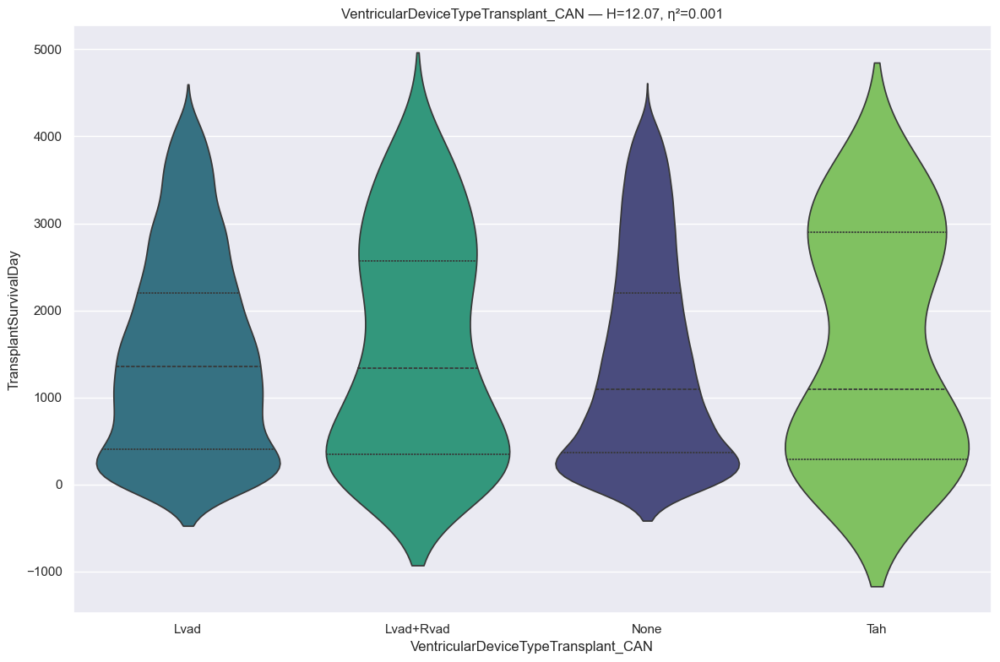

RANKING REPORT: VentricularDeviceTypeTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Lvad                                              :   2334 records
 * Lvad+Rvad                                         :    148 records
 * None                                              :   5499 records
 * Tah                                               :     54 records
BYPASSED CATEGORIES (n < min_n):
 * Rvad                                              :     16 records
 * Unknown                                           :     13 records
--------------------------------------------------------------------------------
Kruskal H: 12.0683 | P-value: 7.152695e-03 | Effect η²: 0.0011
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Lvad         vs None         | p=7.0413e-04 | thr=0.0083 | r=-0.048 | *Sig*
Lvad+Rvad    vs None         | p=3.5090e-01 | thr=0.0083 | r=-0.045 | 

In [254]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [255]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: VentricularDeviceTypeTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Lvad                                              :   2334 records
 * Lvad+Rvad                                         :    148 records
 * None                                              :   5499 records
 * Tah                                               :     54 records
BYPASSED CATEGORIES (n < min_n):
 * Rvad                                              :     16 records
 * Unknown                                           :     13 records
--------------------------------------------------------------------------------
Kruskal H: 12.0683 | P-value: 7.152695e-03 | Effect η²: 0.0011
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES 

In [256]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventricular Device Brand Transplant

In [257]:
# info
feature = u.get_feature_info(df, 'VentricularDeviceBrandTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                     count unique      top  freq
VentricularDeviceBrandTransplant_CAN  8064     25  Unknown  5512

:::: NaN Count:
VentricularDeviceBrandTransplant_CAN    0 



{'VentricularDeviceBrandTransplant_CAN': CategoricalDtype(categories=['AbioCor', 'Abiomed AB5000', 'Abiomed BVS 5000',
                   'Berlin Heart EXCOR', 'Biomedicus',
                   'Cardiac Assist Protek Duo', 'Cardiac Assist Tandem Heart',
                   'CentriMag (Thoratec/Levitronix)', 'Evaheart',
                   'HeartMate III', 'Heartmate II', 'Heartmate XVE',
                   'Heartsaver VAD', 'Heartware HVAD', 'Impella CP',
                   'Impella RP', 'Impella Recover 2.5', 'Impella Recover 5.0',
                   'Jarvik 2000', 'Maquet Jostra Rotaflow', 'Other, Specify',
                   'SynCardia CardioWest', 'Terumo DuraHeart', 'Thoratec',
                   'Thoratec IVAD', 'Thoratec PVAD', 'Toyobo', 'Unknown',
                   'Ventracor VentrAssist', 'Worldheart Levacor'],
 , ordered=False, categories_dtype=str)}

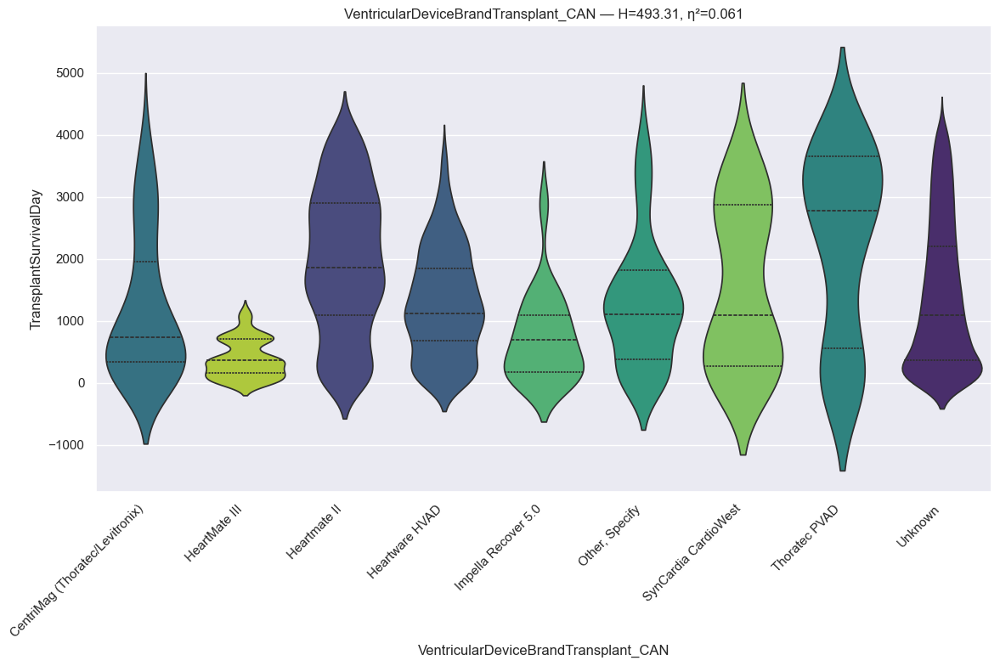

RANKING REPORT: VentricularDeviceBrandTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CentriMag (Thoratec/Levitronix)                   :     71 records
 * HeartMate III                                     :    259 records
 * Heartmate II                                      :   1063 records
 * Heartware HVAD                                    :    789 records
 * Impella Recover 5.0                               :     57 records
 * Other, Specify                                    :    151 records
 * SynCardia CardioWest                              :     53 records
 * Thoratec PVAD                                     :     40 records
 * Unknown                                           :   5512 records
BYPASSED CATEGORIES (n < min_n):
 * Abiomed AB5000                                    :      3 records
 * Abiomed BVS 5000                                  :      3 records
 * Berlin Heart EXCOR                                :      1 records
 * Biomedicus                               

In [258]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [259]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: VentricularDeviceBrandTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CentriMag (Thoratec/Levitronix)                   :     71 records
 * HeartMate III                                     :    259 records
 * Heartmate II                                      :   1063 records
 * Heartware HVAD                                    :    789 records
 * Impella Recover 5.0                               :     57 records
 * Other, Specify                                    :    151 records
 * SynCardia CardioWest                              :     53 records
 * Thoratec PVAD                                     :     40 records
 * Unknown                                           :   5512 records
BYPASSED CATEGORIES (n < min_n):
 * Abiomed AB5000                                    :      3 records
 * Abiomed BVS 5000                                  :      3 records
 * Berlin Heart EXCOR                                :      1 records
 * Biomedicus                               

In [260]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Functional Status Registration

In [261]:
# info
feature = u.get_feature_info(df, 'FunctionalStatusRegistration_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                 count unique top  freq
FunctionalStatusRegistration_CAN  8064     10  20  2033

:::: NaN Count:
FunctionalStatusRegistration_CAN    0 



{'FunctionalStatusRegistration_CAN': CategoricalDtype(categories=['10', '100', '20', '30', '40', '50', '60', '70', '80', '90'], ordered=False, categories_dtype=str)}

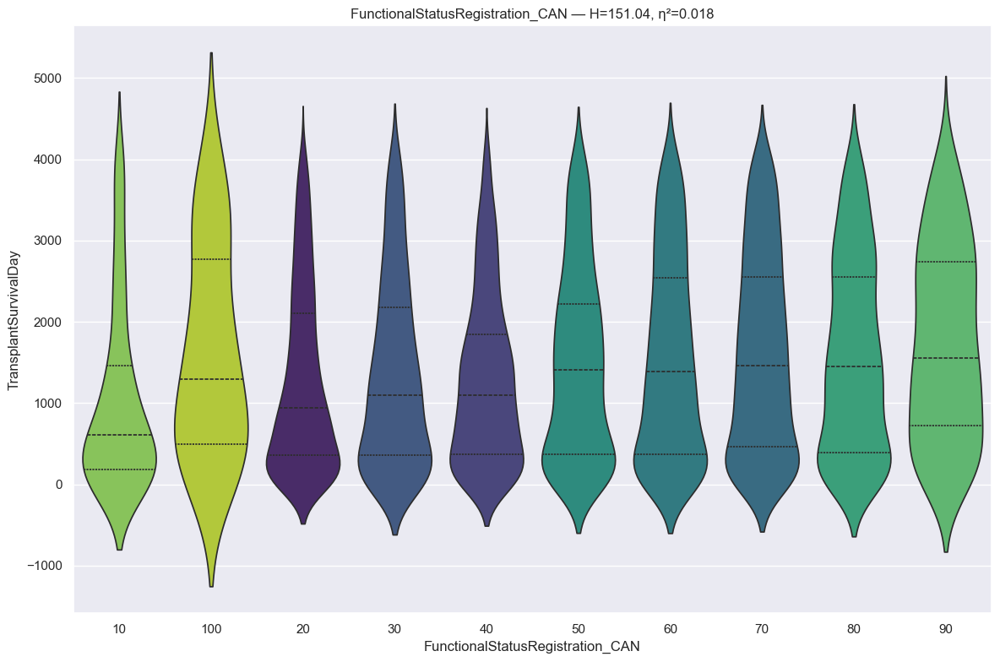

RANKING REPORT: FunctionalStatusRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 10                                                :    177 records
 * 100                                               :     34 records
 * 20                                                :   2033 records
 * 30                                                :    671 records
 * 40                                                :   1135 records
 * 50                                                :    888 records
 * 60                                                :   1057 records
 * 70                                                :   1213 records
 * 80                                                :    673 records
 * 90                                                :    183 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 151.0416 | P-value: 5.365853e-28 | Effect η²: 0.0176
Correction Method: BONFERRONI
Pairwise Testing (Bo

In [262]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [263]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: FunctionalStatusRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 10                                                :    177 records
 * 100                                               :     34 records
 * 20                                                :   2033 records
 * 30                                                :    671 records
 * 40                                                :   1135 records
 * 50                                                :    888 records
 * 60                                                :   1057 records
 * 70                                                :   1213 records
 * 80                                                :    673 records
 * 90                                                :    183 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 151.0416 | P-value: 5.365853e-28 | Effect η²: 0.0176
Correction Method: HOLM
Pairwise Testing (Base Alp

In [264]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventilatory Support
* Ventilator support is a life-saving, temporary medical intervention for patients unable to breathe effectively on their own, often used in cases of severe respiratory failure, surgery, or underlying illness. It provides oxygen to the lungs and removes carbon dioxide using either a face mask (noninvasive) or a breathing tube (invasive).

In [265]:
# info
feature = u.get_feature_info(df, 'VentilatorySupport_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique top  freq
VentilatorySupport_CAN  8064      3  No  6620

:::: NaN Count:
VentilatorySupport_CAN    0 



{'VentilatorySupport_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

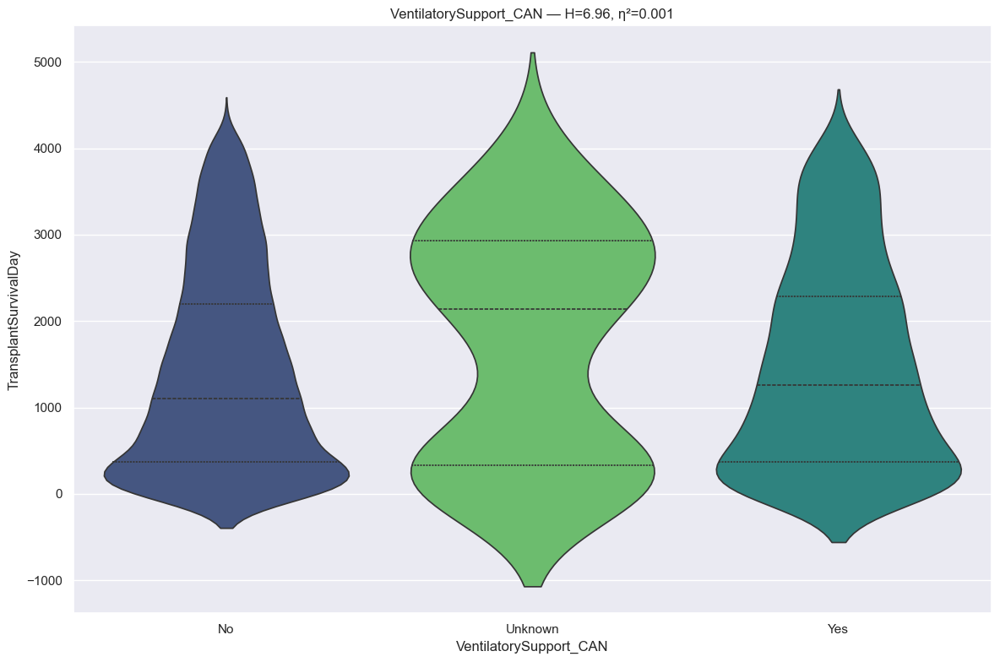

RANKING REPORT: VentilatorySupport_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6620 records
 * Unknown                                           :     95 records
 * Yes                                               :   1349 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 6.9630 | P-value: 3.076184e-02 | Effect η²: 0.0006
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=3.4646e-02 | thr=0.0167 | r= 0.126 | Not Sig
Unknown      vs Yes          | p=8.7737e-02 | thr=0.0167 | r=-0.105 | Not Sig
No           vs Yes          | p=9.6715e-02 | thr=0.0167 | r= 0.029 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> 

In [266]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [267]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Ventilator Transplant
* Ventilator support is a life-saving, temporary medical intervention for patients unable to breathe effectively on their own, often used in cases of severe respiratory failure, surgery, or underlying illness. It provides oxygen to the lungs and removes carbon dioxide using either a face mask (noninvasive) or a breathing tube (invasive).

In [268]:
# info
feature = u.get_feature_info(df, 'VentilatorTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique top  freq
VentilatorTransplant_CAN  8064      2  No  7942

:::: NaN Count:
VentilatorTransplant_CAN    0 



{'VentilatorTransplant_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

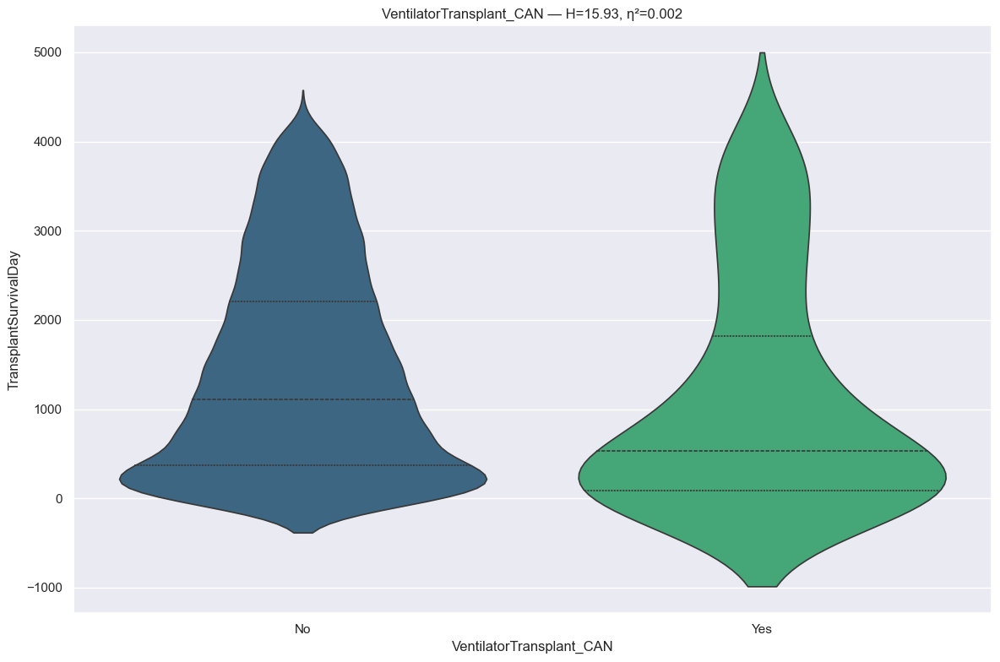

RANKING REPORT: VentilatorTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7942 records
 * Yes                                               :    122 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 15.9251 | P-value: 6.589882e-05 | Effect η²: 0.0019
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=6.5904e-05 | thr=0.0500 | r=-0.210 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

VentilatorTransplant_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                      No       

In [269]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [270]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Inhaled Transplant

In [271]:
# info
feature = u.get_feature_info(df, 'LifeSupportInhaledTransplant', cat=True)
# dtype
{col: df[col].dtype for col in feature}

                                 count unique top  freq
LifeSupportInhaledTransplant_CAN  8064      2  No  8052

:::: NaN Count:
LifeSupportInhaledTransplant_CAN    0 

--- LifeSupportInhaledTransplant_CAN ---
dtype: category
Categories: ['No', 'Yes']
Ordered: False



{'LifeSupportInhaledTransplant_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

In [272]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for LifeSupportInhaledTransplant_CAN
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

LifeSupportInhaledTransplant_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                              No         1424.938525                1112.0                 4195.0                    0.0          8052
                             Yes          922.333333                 729.0                 3281.0                    6.0            12


In [273]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival due to the negligible effect size of Unknown cases.

#### Prior Cardiac Surgery Type List And Transplant

In [274]:
# info
feature = u.get_feature_info(df, 'PriorCardiacSurgeryTypeListAndTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                             count unique      top  freq
PriorCardiacSurgeryTypeListAndTransplant_CAN  8064     17  Unknown  6541

:::: NaN Count:
PriorCardiacSurgeryTypeListAndTransplant_CAN    0 



{'PriorCardiacSurgeryTypeListAndTransplant_CAN': CategoricalDtype(categories=['CABG', 'CABG; Congenital',
                   'CABG; Congenital; Other, specify',
                   'CABG; Left Vent. Remodeling', 'CABG; Other, specify',
                   'CABG; Valve Replace/Repair',
                   'CABG; Valve Replace/Repair; Congenital',
                   'CABG; Valve Replace/Repair; Congenital; Left Vent. Remodeling',
                   'CABG; Valve Replace/Repair; Other, specify', 'Congenital',
                   'Congenital; Left Vent. Remodeling; Other, specify',
                   'Congenital; Other, specify', 'Left Vent. Remodeling',
                   'Left Vent. Remodeling; Other, specify', 'Other, specify',
                   'Unknown', 'Valve Replace/Repair',
                   'Valve Replace/Repair; Congenital',
                   'Valve Replace/Repair; Congenital; Other, specify',
                   'Valve Replace/Repair; Left Vent. Remodeling',
                   'Va

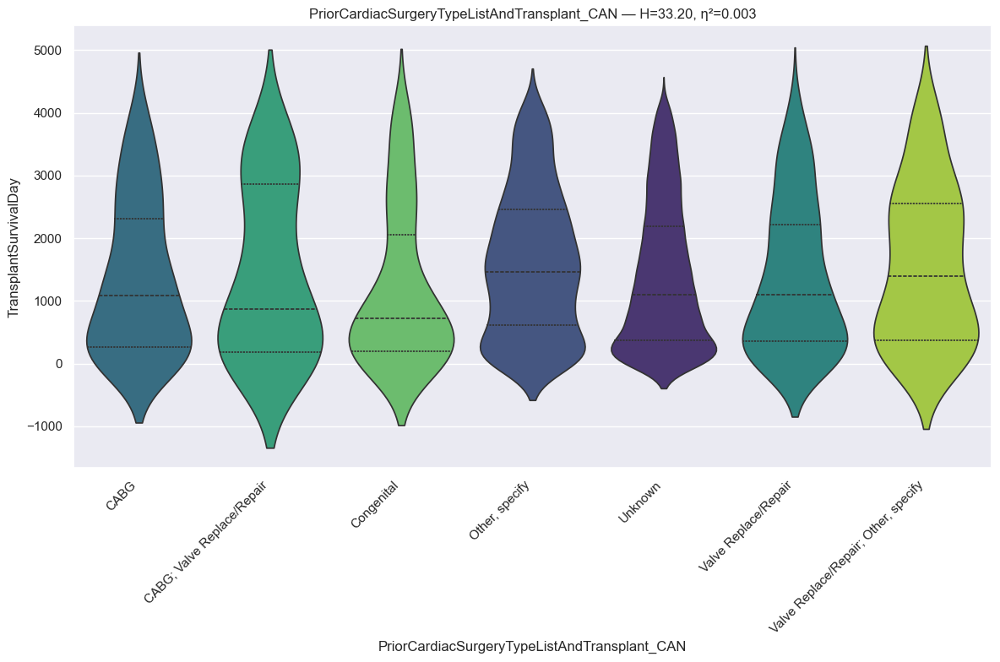

RANKING REPORT: PriorCardiacSurgeryTypeListAndTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CABG                                              :    107 records
 * CABG; Valve Replace/Repair                        :     30 records
 * Congenital                                        :    100 records
 * Other, specify                                    :    988 records
 * Unknown                                           :   6541 records
 * Valve Replace/Repair                              :    166 records
 * Valve Replace/Repair; Other, specify              :     69 records
BYPASSED CATEGORIES (n < min_n):
 * CABG; Left Vent. Remodeling                       :      2 records
 * CABG; Other, specify                              :     15 records
 * CABG; Valve Replace/Repair; Congenital            :      1 records
 * CABG; Valve Replace/Repair; Other, specify        :      1 records
 * Congenital; Other, specify                        :     10 records
 * Left Vent. Remodeling            

In [275]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [276]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PriorCardiacSurgeryTypeListAndTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * CABG                                              :    107 records
 * CABG; Valve Replace/Repair                        :     30 records
 * Congenital                                        :    100 records
 * Other, specify                                    :    988 records
 * Unknown                                           :   6541 records
 * Valve Replace/Repair                              :    166 records
 * Valve Replace/Repair; Other, specify              :     69 records
BYPASSED CATEGORIES (n < min_n):
 * CABG; Left Vent. Remodeling                       :      2 records
 * CABG; Other, specify                              :     15 records
 * CABG; Valve Replace/Repair; Congenital            :      1 records
 * CABG; Valve Replace/Repair; Other, specify        :      1 records
 * Congenital; Other, specify                        :     10 records
 * Left Vent. Remodeling            

In [277]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Hepatitis B CoreAntibody
* A positive Hepatitis B core antibody (HBcAb or anti-HBc) test indicates exposure to the hepatitis B virus (HBV), either from a current or past infection. Unlike surface antibodies, it does not provide immunity. It is a critical marker for diagnosing acute, chronic, or resolved hepatitis B. 

In [278]:
# info
feature = u.get_feature_info(df, 'Hepatitis_B_CoreAntibody', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                             count unique       top  freq
Hepatitis_B_CoreAntibody_CAN  8064      4  Negative  7283

:::: NaN Count:
Hepatitis_B_CoreAntibody_CAN    0 



{'Hepatitis_B_CoreAntibody_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

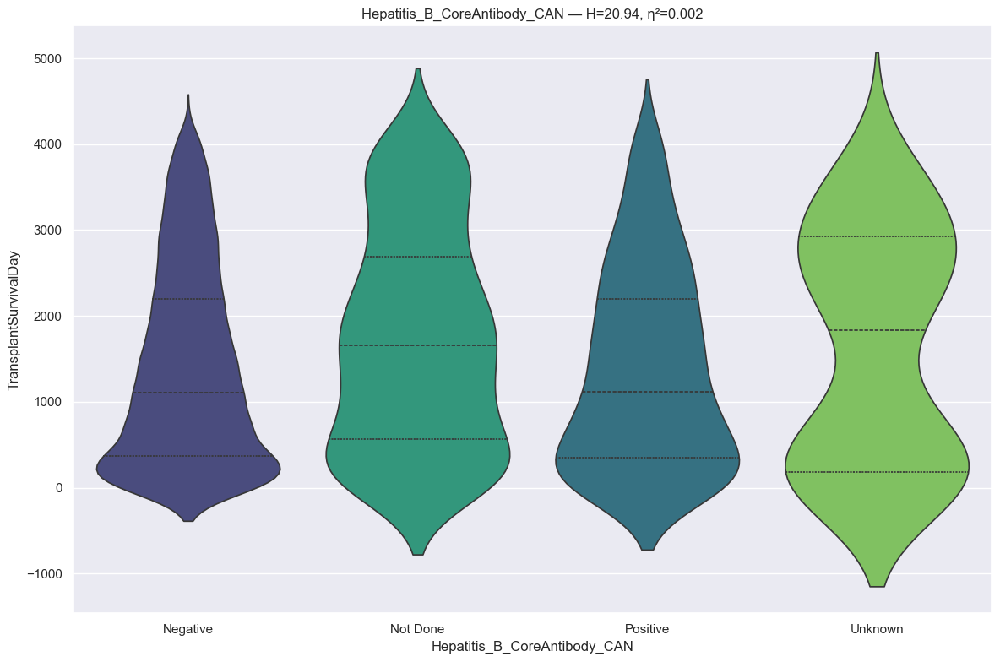

RANKING REPORT: Hepatitis_B_CoreAntibody_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   7283 records
 * Not Done                                          :    370 records
 * Positive                                          :    341 records
 * Unknown                                           :     70 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 20.9392 | P-value: 1.083798e-04 | Effect η²: 0.0022
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Not Done     | p=8.2799e-06 | thr=0.0083 | r= 0.137 | *Sig*
Not Done     vs Positive     | p=5.7318e-04 | thr=0.0083 | r=-0.149 | *Sig*
Positive     vs Unknown      | p=2.7341e-01 | thr=0.0083 | r= 0.083 | Not Sig
Negative     vs Unknown      | p=3.9337e-01 | thr=0.0083 | r= 0.059 | 

In [279]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [280]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: Hepatitis_B_CoreAntibody_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   7283 records
 * Not Done                                          :    370 records
 * Positive                                          :    341 records
 * Unknown                                           :     70 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 20.9392 | P-value: 1.083798e-04 | Effect η²: 0.0022
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - Negative
  - Positive

>>> Group_2 (1 categories)
  - Not Done

>>> Group_3 (1 categories

In [281]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Surface Antigen HEP B
* Hepatitis B surface antigen (HBsAg) is a protein on the surface of the hepatitis B virus, found in the blood during acute or chronic infections. A positive/reactive HBsAg test indicates an active Hepatitis B virus (HBV) infection, which can be transmitted through bodily fluids. It is often the first sign of infection and, if persistent for over 6 months, indicates chronic infection.

In [282]:
# info
feature = u.get_feature_info(df, 'SurfaceAntigenHEP_B', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                        count unique       top  freq
SurfaceAntigenHEP_B_CAN  8064      4  Negative  7777

:::: NaN Count:
SurfaceAntigenHEP_B_CAN    0 



{'SurfaceAntigenHEP_B_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

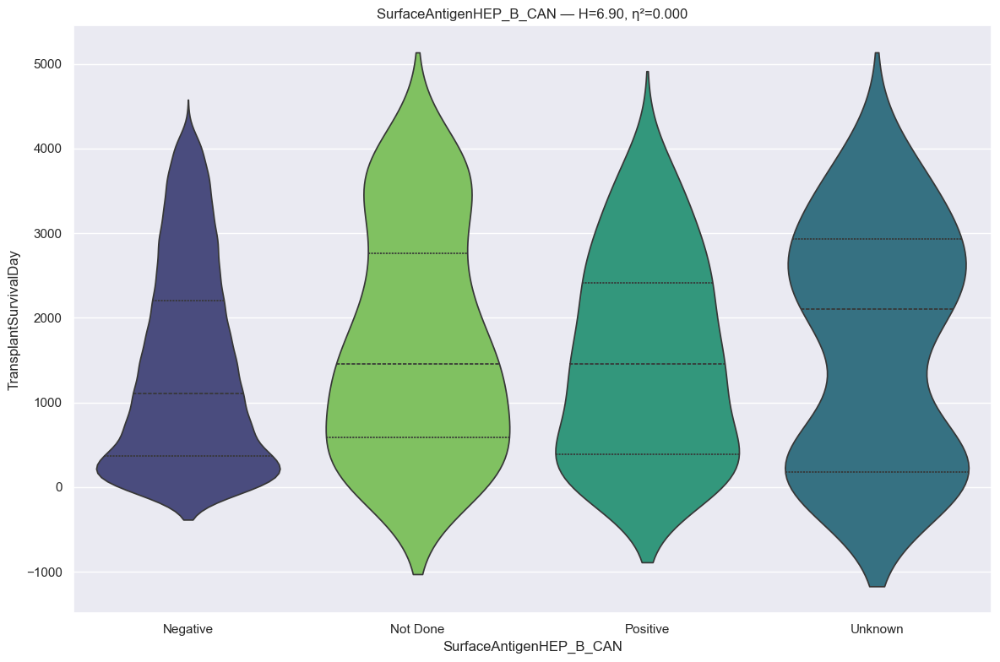

RANKING REPORT: SurfaceAntigenHEP_B_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   7777 records
 * Not Done                                          :    104 records
 * Positive                                          :    120 records
 * Unknown                                           :     63 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 6.8985 | P-value: 7.520577e-02 | Effect η²: 0.0005
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Not Done     | p=3.3999e-02 | thr=0.0083 | r= 0.121 | Not Sig
Negative     vs Unknown      | p=1.9120e-01 | thr=0.0083 | r= 0.095 | Not Sig
Not Done     vs Positive     | p=3.2257e-01 | thr=0.0083 | r=-0.077 | Not Sig
Negative     vs Positive     | p=3.6485e-01 | thr=0.0083 | r= 0.048 | No

In [283]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [284]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: SurfaceAntigenHEP_B_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   7777 records
 * Not Done                                          :    104 records
 * Positive                                          :    120 records
 * Unknown                                           :     63 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 6.8985 | P-value: 7.520577e-02 | Effect η²: 0.0005
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Negative

>>> Group_2 (2 categories)
  - Not Done
  - Unknown

>>> Group_3 (1 categories)
  - P

In [285]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Surface HBV Antibody Total Transplant
* The Hepatitis B Surface Antibody (anti-HBs or HBsAb) test measures immunity to the Hepatitis B virus (HBV) from vaccination or recovery. A level indicates protective immunity. Levels indicate susceptibility or lack of a response to vaccination.

In [286]:
# info
feature = u.get_feature_info(df, 'SurfaceHBVAntibodyTotalTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                      count unique       top  freq
SurfaceHBVAntibodyTotalTransplant_CAN  8064      4  Negative  3374

:::: NaN Count:
SurfaceHBVAntibodyTotalTransplant_CAN    0 



{'SurfaceHBVAntibodyTotalTransplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

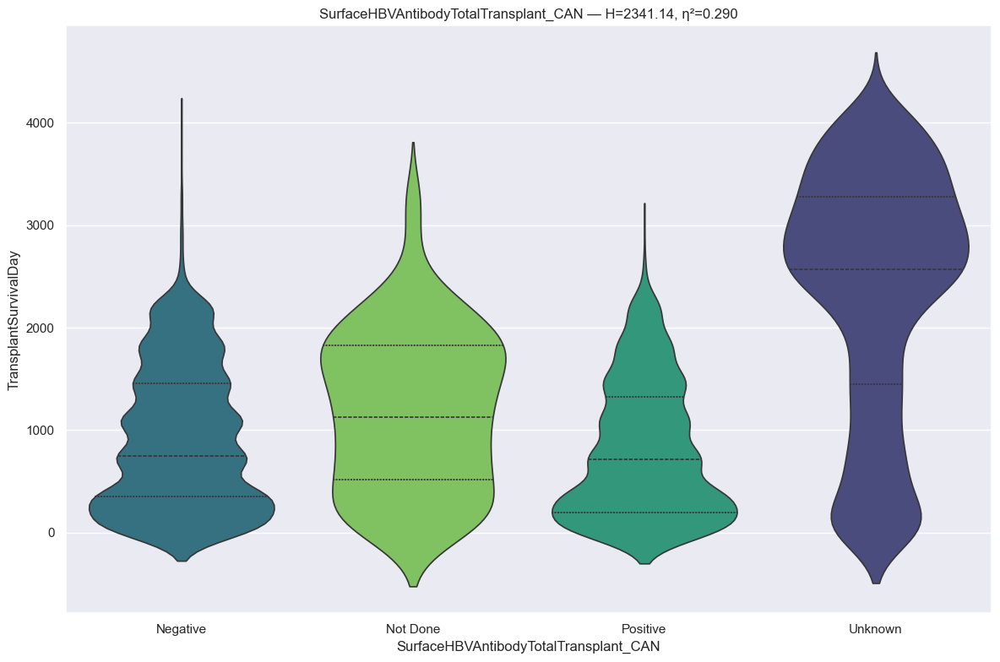

RANKING REPORT: SurfaceHBVAntibodyTotalTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   3374 records
 * Not Done                                          :    226 records
 * Positive                                          :   1506 records
 * Unknown                                           :   2958 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2341.1416 | P-value: 0.000000e+00 | Effect η²: 0.2901
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0083 | r= 0.633 | *Sig*
Positive     vs Unknown      | p=2.7275e-293 | thr=0.0083 | r= 0.669 | *Sig*
Not Done     vs Unknown      | p=3.2023e-43 | thr=0.0083 | r= 0.549 | *Sig*
Not Done     vs Positive     | p=9.8538e-14 | thr=0.0083 | r

In [287]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [288]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### CMV Status Transplant
* CMV status indicates whether a person has been infected with Cytomegalovirus (CMV), a common herpes virus, measured by antibodies in the blood. CMV Positive (IgG+) means past or present infection, while CMV Negative (IgG-) means never infected. It is critical in pregnancy and transplants, as active infection (IgM+) can cause birth defects.

In [289]:
# info
feature = u.get_feature_info(df, 'CMVStatus_Transplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique       top  freq
CMVStatus_Transplant_CAN  8064      4  Positive  5203

:::: NaN Count:
CMVStatus_Transplant_CAN    0 



{'CMVStatus_Transplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

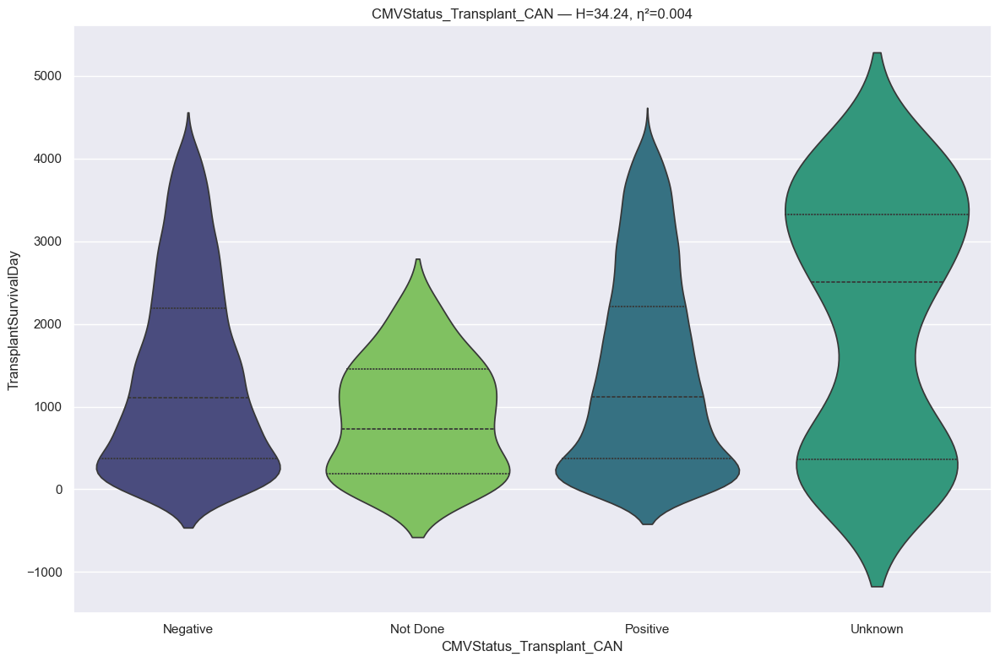

RANKING REPORT: CMVStatus_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   2688 records
 * Not Done                                          :     65 records
 * Positive                                          :   5203 records
 * Unknown                                           :    108 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 34.2378 | P-value: 1.764858e-07 | Effect η²: 0.0039
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Not Done     vs Unknown      | p=1.7811e-06 | thr=0.0083 | r= 0.434 | *Sig*
Negative     vs Unknown      | p=1.1162e-05 | thr=0.0083 | r= 0.249 | *Sig*
Positive     vs Unknown      | p=2.7792e-05 | thr=0.0083 | r= 0.235 | *Sig*
Not Done     vs Positive     | p=1.8868e-04 | thr=0.0083 | r= 0.269 | *Sig*


In [290]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [291]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CMVStatus_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   2688 records
 * Not Done                                          :     65 records
 * Positive                                          :   5203 records
 * Unknown                                           :    108 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 34.2378 | P-value: 1.764858e-07 | Effect η²: 0.0039
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - Negative
  - Positive

>>> Group_2 (1 categories)
  - Not Done

>>> Group_3 (1 categories)
  

In [292]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HIV Sero Status Transplant
* HIV serostatus is an individual's HIV infection status, classified as seropositive (having antibodies or antigens) or seronegative (not having them). Disclosure of serostatus to partners is a key prevention strategy that often increases social support, improves treatment adherence, and reduces transmission risks.

In [293]:
# info
feature = u.get_feature_info(df, 'HIV_SeroStatusTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                             count unique       top  freq
HIV_SeroStatusTransplant_CAN  8064      4  Negative  7847

:::: NaN Count:
HIV_SeroStatusTransplant_CAN    0 



{'HIV_SeroStatusTransplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

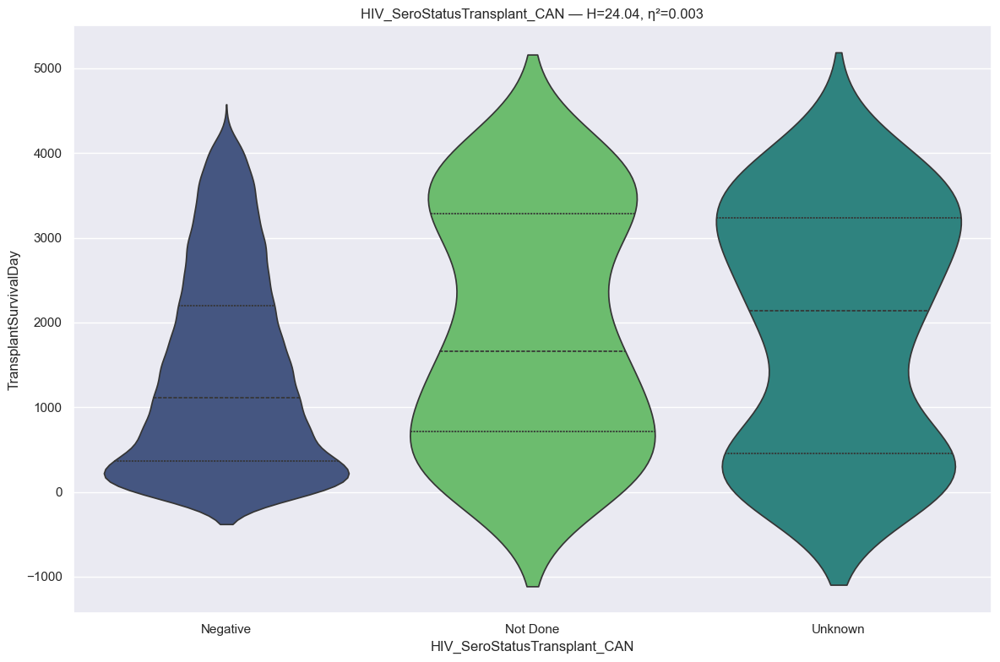

RANKING REPORT: HIV_SeroStatusTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   7847 records
 * Not Done                                          :     93 records
 * Unknown                                           :    106 records
BYPASSED CATEGORIES (n < min_n):
 * Positive                                          :     18 records
--------------------------------------------------------------------------------
Kruskal H: 24.0405 | P-value: 6.021164e-06 | Effect η²: 0.0027
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=3.4396e-04 | thr=0.0167 | r= 0.202 | *Sig*
Negative     vs Not Done     | p=6.8651e-04 | thr=0.0167 | r= 0.204 | *Sig*
Not Done     vs Unknown      | p=8.5708e-01 | thr=0.0167 | r=-0.015 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

::::::

In [294]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [295]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HEP C Serostatus Status
* Hepatitis C (HCV) serostatus indicates whether a person has antibodies to the virus (seropositive) or not (seronegative). A positive antibody test suggests past or present infection, requiring a follow-up HCV RNA test to confirm current infection. While not always reflecting active disease, antibody status helps guide treatment. 

In [296]:
# info
feature = u.get_feature_info(df, 'HEP_C_SerostatusStatus', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                           count unique       top  freq
HEP_C_SerostatusStatus_CAN  8064      4  Negative  7695

:::: NaN Count:
HEP_C_SerostatusStatus_CAN    0 



{'HEP_C_SerostatusStatus_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

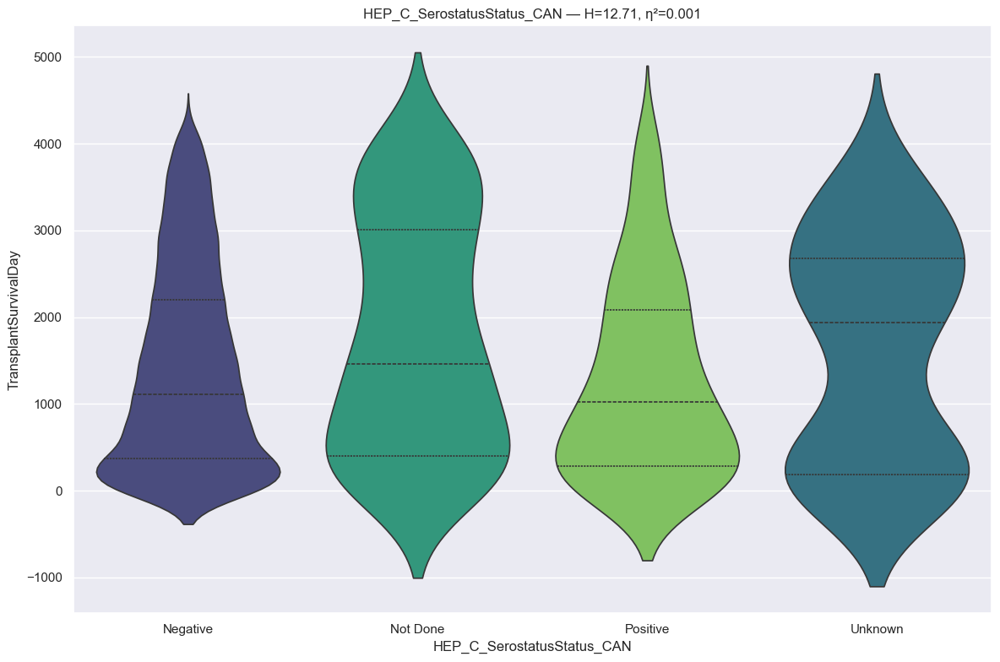

RANKING REPORT: HEP_C_SerostatusStatus_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   7695 records
 * Not Done                                          :    136 records
 * Positive                                          :    165 records
 * Unknown                                           :     68 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 12.7120 | P-value: 5.302783e-03 | Effect η²: 0.0012
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Not Done     vs Positive     | p=1.4112e-03 | thr=0.0083 | r=-0.214 | *Sig*
Negative     vs Not Done     | p=3.8421e-03 | thr=0.0083 | r= 0.144 | *Sig*
Negative     vs Positive     | p=8.1119e-02 | thr=0.0083 | r=-0.079 | Not Sig
Positive     vs Unknown      | p=8.2946e-02 | thr=0.0083 | r= 0.145 | No

In [297]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [298]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: HEP_C_SerostatusStatus_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   7695 records
 * Not Done                                          :    136 records
 * Positive                                          :    165 records
 * Unknown                                           :     68 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 12.7120 | P-value: 5.302783e-03 | Effect η²: 0.0012
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 4 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Negative

>>> Group_2 (1 categories)
  - Not Done

>>> Group_3 (1 categories)
  - Positive


In [299]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Epstein Barr Sero Status Transplant
* Epstein-Barr virus (EBV) serostatus indicates whether a person has been infected with EBV, which causes infectious mononucleosis and remains latent in the body. Over 90% of adults are seropositive, meaning they have antibodies (VCA or EBNA) from a past infection. Seronegative individuals are susceptible, while positive results define acute (IgM) or past (IgG) infection.

In [300]:
# info
feature = u.get_feature_info(df, 'EpsteinBarrSeroStatusTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                    count unique       top  freq
EpsteinBarrSeroStatusTransplant_CAN  8064      4  Positive  6601

:::: NaN Count:
EpsteinBarrSeroStatusTransplant_CAN    0 



{'EpsteinBarrSeroStatusTransplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

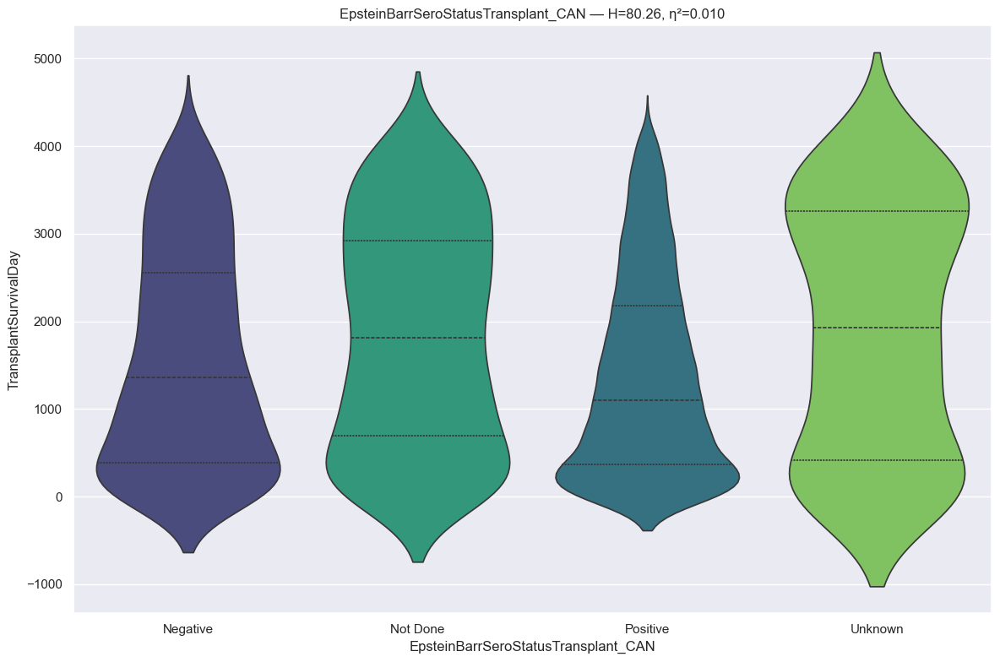

RANKING REPORT: EpsteinBarrSeroStatusTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    838 records
 * Not Done                                          :    474 records
 * Positive                                          :   6601 records
 * Unknown                                           :    151 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 80.2567 | P-value: 2.703833e-17 | Effect η²: 0.0096
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Not Done     vs Positive     | p=2.3924e-13 | thr=0.0083 | r=-0.201 | *Sig*
Positive     vs Unknown      | p=9.7745e-06 | thr=0.0083 | r= 0.210 | *Sig*
Negative     vs Positive     | p=1.0220e-04 | thr=0.0083 | r=-0.082 | *Sig*
Negative     vs Not Done     | p=4.4537e-04 | thr=0.0083 | r= 0.1

In [301]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [302]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: EpsteinBarrSeroStatusTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    838 records
 * Not Done                                          :    474 records
 * Positive                                          :   6601 records
 * Unknown                                           :    151 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 80.2567 | P-value: 2.703833e-17 | Effect η²: 0.0096
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - Negative

>>> Group_2 (2 categories)
  - Not Done
  - Unknown

>>> Group_3 (1 cate

In [303]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HIV NAT Pre Transplant
* HIV Nucleic Acid Testing (NAT) is highly recommended as part of baseline (pre) testing before starting HIV Pre-Exposure Prophylaxis (PrEP) to detect acute infection earlier than standard antibody/antigen tests, typically within 7–10 days of exposure. While often used at baseline, routine NAT is less commonly used for ongoing monitoring due to costs, but is essential for confirming negative status before starting oral or injectable PrEP to avoid potential drug resistance. 

In [304]:
# info
feature = u.get_feature_info(df, 'HIV_NAT_PreTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique      top  freq
HIV_NAT_PreTransplant_CAN  8064      4  Unknown  4553

:::: NaN Count:
HIV_NAT_PreTransplant_CAN    0 



{'HIV_NAT_PreTransplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

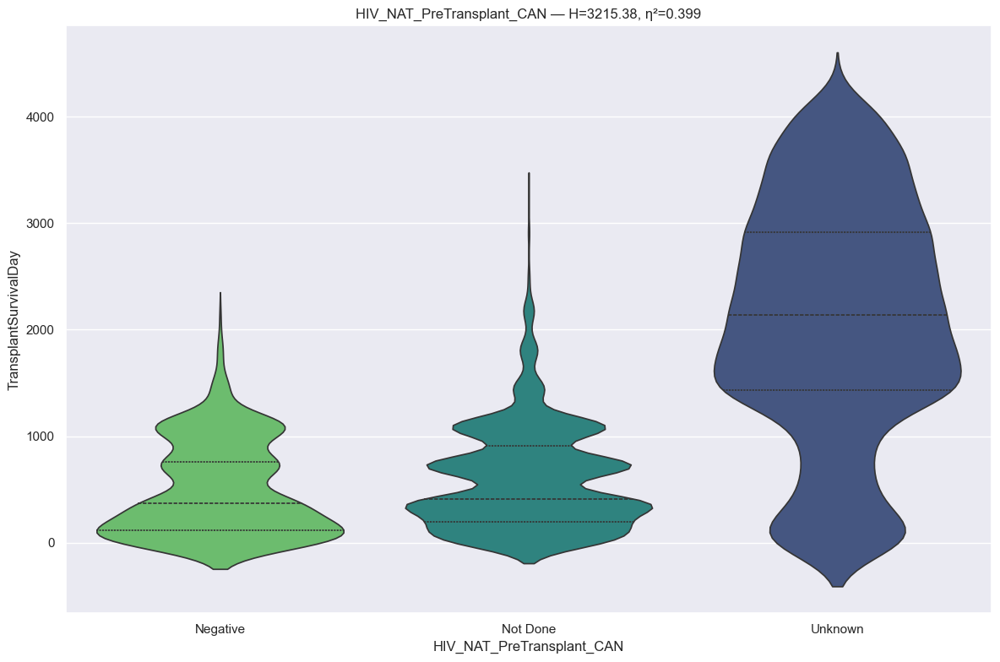

RANKING REPORT: HIV_NAT_PreTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    565 records
 * Not Done                                          :   2940 records
 * Unknown                                           :   4553 records
BYPASSED CATEGORIES (n < min_n):
 * Positive                                          :      6 records
--------------------------------------------------------------------------------
Kruskal H: 3215.3796 | P-value: 0.000000e+00 | Effect η²: 0.3989
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Not Done     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.728 | *Sig*
Negative     vs Unknown      | p=7.0475e-196 | thr=0.0167 | r= 0.769 | *Sig*
Negative     vs Not Done     | p=3.5968e-06 | thr=0.0167 | r= 0.123 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

::::::::

In [305]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [306]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HCV NAT Pre-Transplant
* HCV NAT (Nucleic Acid Test) detects HCV RNA, identifying active hepatitis C infections 1–2 weeks post-infection, significantly reducing the "window period" compared to antibody-only tests. It is used to confirm positive antibody results, diagnose acute cases, and measure viral load for treatment monitoring.

In [307]:
# info
feature = u.get_feature_info(df, 'HCV_NAT_PreTranspant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique      top  freq
HCV_NAT_PreTranspant_CAN  8064      4  Unknown  4550

:::: NaN Count:
HCV_NAT_PreTranspant_CAN    0 



{'HCV_NAT_PreTranspant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

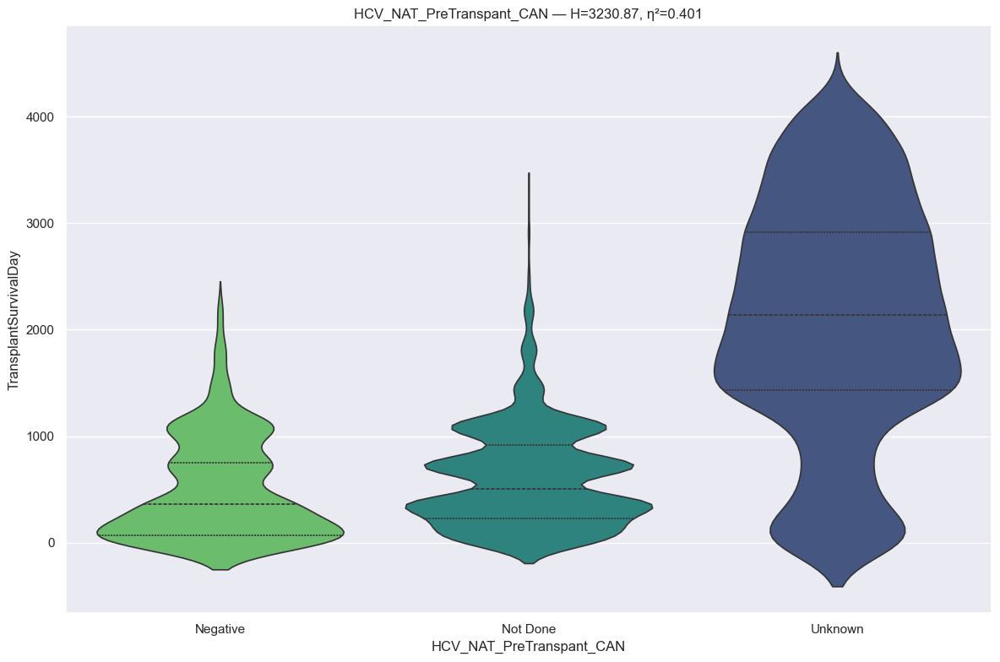

RANKING REPORT: HCV_NAT_PreTranspant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    783 records
 * Not Done                                          :   2721 records
 * Unknown                                           :   4550 records
BYPASSED CATEGORIES (n < min_n):
 * Positive                                          :     10 records
--------------------------------------------------------------------------------
Kruskal H: 3230.8735 | P-value: 0.000000e+00 | Effect η²: 0.4011
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Not Done     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.727 | *Sig*
Negative     vs Unknown      | p=4.7554e-258 | thr=0.0167 | r= 0.767 | *Sig*
Negative     vs Not Done     | p=1.8957e-13 | thr=0.0167 | r= 0.172 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::

In [308]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [309]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### HBV NAT Result
* A Hepatitis B Virus Nucleic Acid Test (HBV NAT) measures the amount of viral DNA in the blood to detect active infections. A positive/reactive NAT indicates the virus is multiplying and the person is contagious, often used to monitor chronic infections or confirm early infection. A negative/nonreactive NAT means no virus was detected.

In [310]:
# info
feature = u.get_feature_info(df, 'HBV_NAT_Result', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                   count unique      top  freq
HBV_NAT_Result_CAN  8064      4  Unknown  4551

:::: NaN Count:
HBV_NAT_Result_CAN    0 



{'HBV_NAT_Result_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

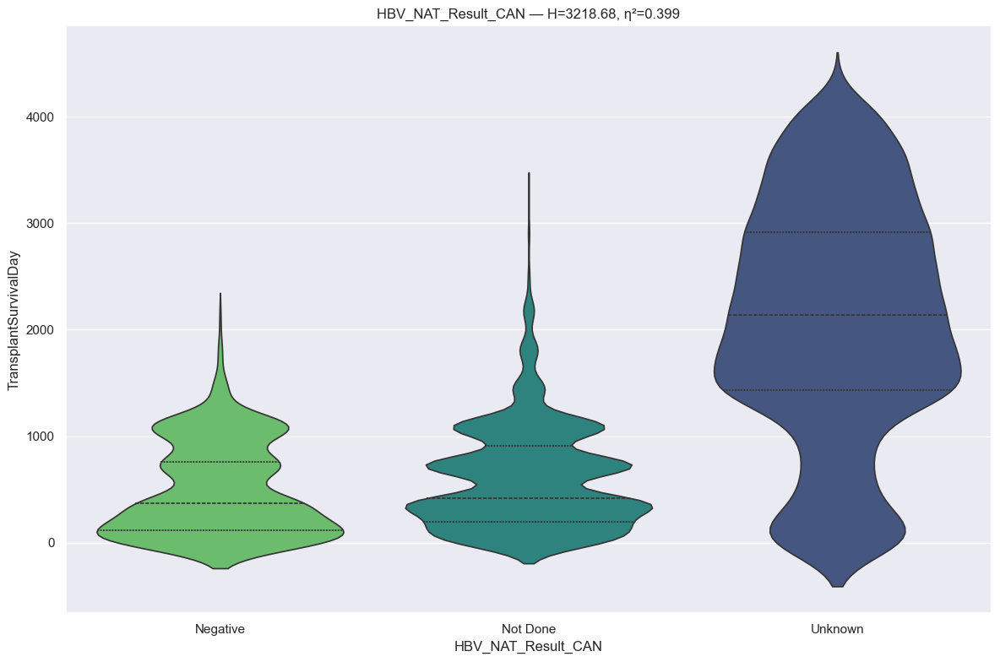

RANKING REPORT: HBV_NAT_Result_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    593 records
 * Not Done                                          :   2912 records
 * Unknown                                           :   4551 records
BYPASSED CATEGORIES (n < min_n):
 * Positive                                          :      8 records
--------------------------------------------------------------------------------
Kruskal H: 3218.6807 | P-value: 0.000000e+00 | Effect η²: 0.3994
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Not Done     vs Unknown      | p=0.0000e+00 | thr=0.0167 | r= 0.728 | *Sig*
Negative     vs Unknown      | p=7.5889e-206 | thr=0.0167 | r= 0.772 | *Sig*
Negative     vs Not Done     | p=4.7025e-07 | thr=0.0167 | r= 0.131 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::

In [311]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [312]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Inhaled Registration
* Life support inhaled refers to mechanical ventilation or respiratory support that forces oxygen into the lungs when a patient cannot breathe adequately on their own, often using a ventilator connected via a tube in the mouth (intubation) or neck (tracheostomy). It is used for critical conditions such as pneumonia, acute respiratory distress, or surgery. 

In [313]:
# info
feature = u.get_feature_info(df, 'LifeSupportInhaledRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                   count unique top  freq
LifeSupportInhaledRegistration_CAN  8064      2  No  8047

:::: NaN Count:
LifeSupportInhaledRegistration_CAN    0 



{'LifeSupportInhaledRegistration_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

In [314]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for LifeSupportInhaledRegistration_CAN
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

LifeSupportInhaledRegistration_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                                No         1424.314154                1112.0                 4195.0                    0.0          8047
                               Yes         1365.705882                1044.0                 3260.0                    1.0            17


In [315]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Previous Transplant Same Organ

In [316]:
# info
feature = u.get_feature_info(df, 'PreviousTransplantSameOrgan', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                count unique top  freq
PreviousTransplantSameOrgan_CAN  8064      2  No  7680

:::: NaN Count:
PreviousTransplantSameOrgan_CAN    0 



{'PreviousTransplantSameOrgan_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

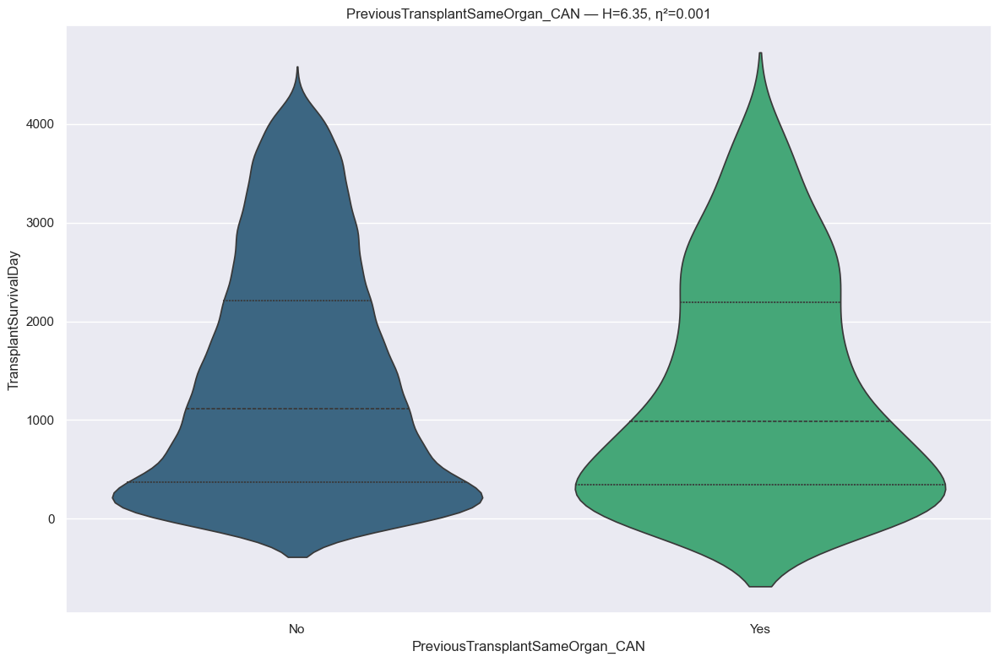

RANKING REPORT: PreviousTransplantSameOrgan_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7680 records
 * Yes                                               :    384 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 6.3461 | P-value: 1.176393e-02 | Effect η²: 0.0007
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.1764e-02 | thr=0.0500 | r=-0.076 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

PreviousTransplantSameOrgan_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                  

In [317]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [318]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Previous Transplant Any Organ

In [319]:
# info
feature = u.get_feature_info(df, 'PreviousTransplantAnyOrgan', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                               count unique top  freq
PreviousTransplantAnyOrgan_CAN  8064      2  No  7657

:::: NaN Count:
PreviousTransplantAnyOrgan_CAN    0 



{'PreviousTransplantAnyOrgan_CAN': CategoricalDtype(categories=['No', 'Yes'], ordered=False, categories_dtype=str)}

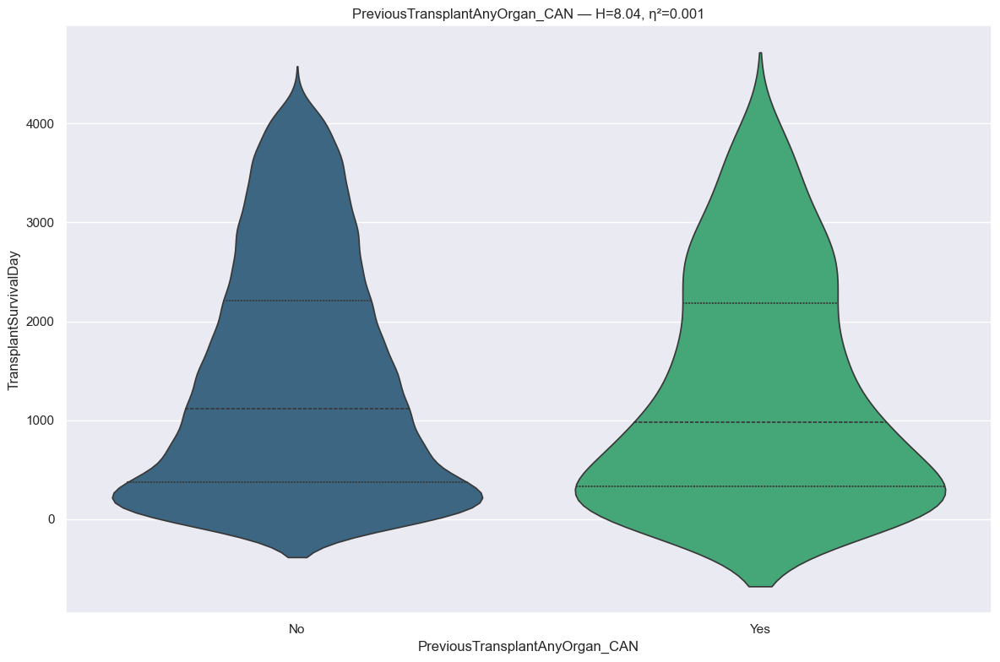

RANKING REPORT: PreviousTransplantAnyOrgan_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7657 records
 * Yes                                               :    407 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 8.0444 | P-value: 4.564425e-03 | Effect η²: 0.0009
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=4.5646e-03 | thr=0.0500 | r=-0.083 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

PreviousTransplantAnyOrgan_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                    

In [320]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [321]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RA1
The Rheumatoid Arthritis Diagnostic Panel 1 (often referred to in the context of RA testing) combines Rheumatoid Factor (RF) and Anti-Cyclic Citrullinated Peptide (anti-CCP) antibodies to diagnose rheumatoid arthritis. Anti-CCP is highly specific (>90%) for RA, whereas RF is more sensitive but less specific. These tests help differentiate RA from other joint diseases.

In [322]:
# info
feature = u.get_feature_info(df, 'AntigenRA1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique top  freq
AntigenRA1_CAN  8064     44   2  2707

:::: NaN Count:
AntigenRA1_CAN    0 



{'AntigenRA1_CAN': CategoricalDtype(categories=['1', '10', '101', '102', '11', '1101', '2', '201', '202',
                   '203', '205', '206', '207', '210', '23', '24', '2402',
                   '2403', '25', '26', '2601', '28', '29', '2901', '2902', '3',
                   '30', '3001', '3002', '301', '302', '31', '32', '33', '3301',
                   '3303', '34', '3402', '36', '66', '6601', '6602', '68',
                   '6801', '6802', '69', '74', '80', 'No Antigen', 'Not Tested',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

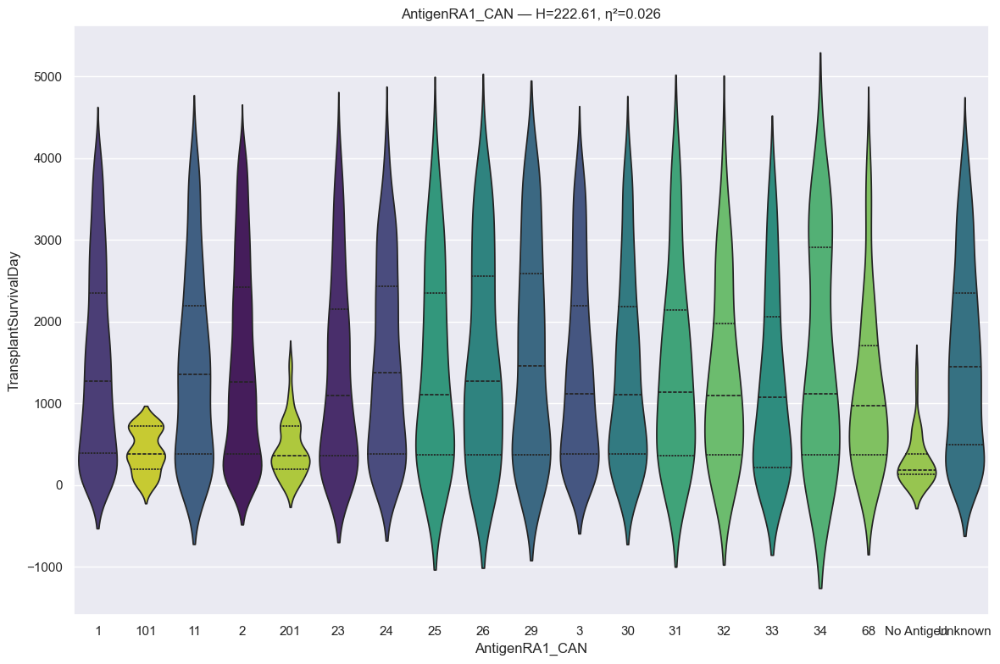

RANKING REPORT: AntigenRA1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :   1519 records
 * 101                                               :     64 records
 * 11                                                :    318 records
 * 2                                                 :   2707 records
 * 201                                               :    110 records
 * 23                                                :    357 records
 * 24                                                :    412 records
 * 25                                                :     59 records
 * 26                                                :     80 records
 * 29                                                :    155 records
 * 3                                                 :    816 records
 * 30                                                :    290 records
 * 31                                                :     61 records
 * 32                        

In [323]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [324]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRA1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :   1519 records
 * 101                                               :     64 records
 * 11                                                :    318 records
 * 2                                                 :   2707 records
 * 201                                               :    110 records
 * 23                                                :    357 records
 * 24                                                :    412 records
 * 25                                                :     59 records
 * 26                                                :     80 records
 * 29                                                :    155 records
 * 3                                                 :    816 records
 * 30                                                :    290 records
 * 31                                                :     61 records
 * 32                        

In [325]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RA2
* HLA-A2 (A2 antigen) is a common class I human leukocyte antigen (HLA) allele that frequently acts as a foreign transplantation antigen (alloantigen) in kidney and pancreas transplants, triggering recipient T-cell responses. Donor-specific sHLA-A2 levels in recipient serum are used to monitor for rejection, with elevated levels indicating potential damage. 

In [326]:
# info
feature = u.get_feature_info(df, 'AntigenRA2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique top freq
AntigenRA2_CAN  8064     44  68  753

:::: NaN Count:
AntigenRA2_CAN    0 



{'AntigenRA2_CAN': CategoricalDtype(categories=['1', '10', '101', '11', '1101', '1102', '2', '201', '202',
                   '203', '205', '23', '24', '2402', '2403', '25', '26', '2601',
                   '28', '29', '2901', '2902', '3', '30', '3001', '3002', '301',
                   '302', '31', '32', '33', '3301', '3303', '34', '3401',
                   '3402', '36', '43', '66', '6601', '6602', '68', '6801',
                   '6802', '69', '74', '80', '9', '98', 'No Antigen',
                   'Not Tested', 'Unknown'],
 , ordered=False, categories_dtype=str)}

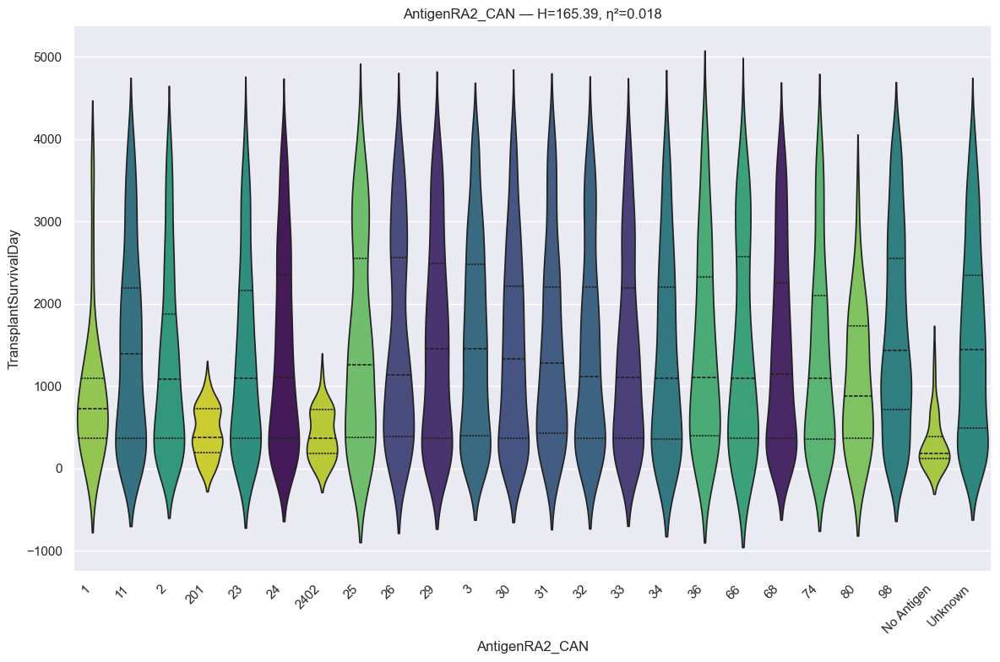

RANKING REPORT: AntigenRA2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     42 records
 * 11                                                :    411 records
 * 2                                                 :    667 records
 * 201                                               :     36 records
 * 23                                                :    282 records
 * 24                                                :    613 records
 * 2402                                              :     31 records
 * 25                                                :    137 records
 * 26                                                :    264 records
 * 29                                                :    352 records
 * 3                                                 :    715 records
 * 30                                                :    530 records
 * 31                                                :    301 records
 * 32                        

In [327]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [328]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRA2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     42 records
 * 11                                                :    411 records
 * 2                                                 :    667 records
 * 201                                               :     36 records
 * 23                                                :    282 records
 * 24                                                :    613 records
 * 2402                                              :     31 records
 * 25                                                :    137 records
 * 26                                                :    264 records
 * 29                                                :    352 records
 * 3                                                 :    715 records
 * 30                                                :    530 records
 * 31                                                :    301 records
 * 32                        

In [329]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RB1
* HLA-DRB1 matching in transplant medicine refers to identifying compatibility between donor and recipient to reduce the risk of graft-versus-host disease (GVHD) and improve survival, particularly in stem cell transplantation. DRB1 is a crucial locus within the human leukocyte antigen (HLA) system. Matching these alleles is essential for minimizing immune-mediated organ rejection. 

In [330]:
# info
feature = u.get_feature_info(df, 'AntigenRB1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique top  freq
AntigenRB1_CAN  8064     79   7  1360

:::: NaN Count:
AntigenRB1_CAN    0 



{'AntigenRB1_CAN': CategoricalDtype(categories=['12', '13', '1301', '1302', '14', '1401', '1402', '15',
                   '1501', '1502',
                   ...
                   '76', '77', '78', '8', '801', '81', '82', 'No Antigen',
                   'Not Tested', 'Unknown'],
 , ordered=False, categories_dtype=str)}

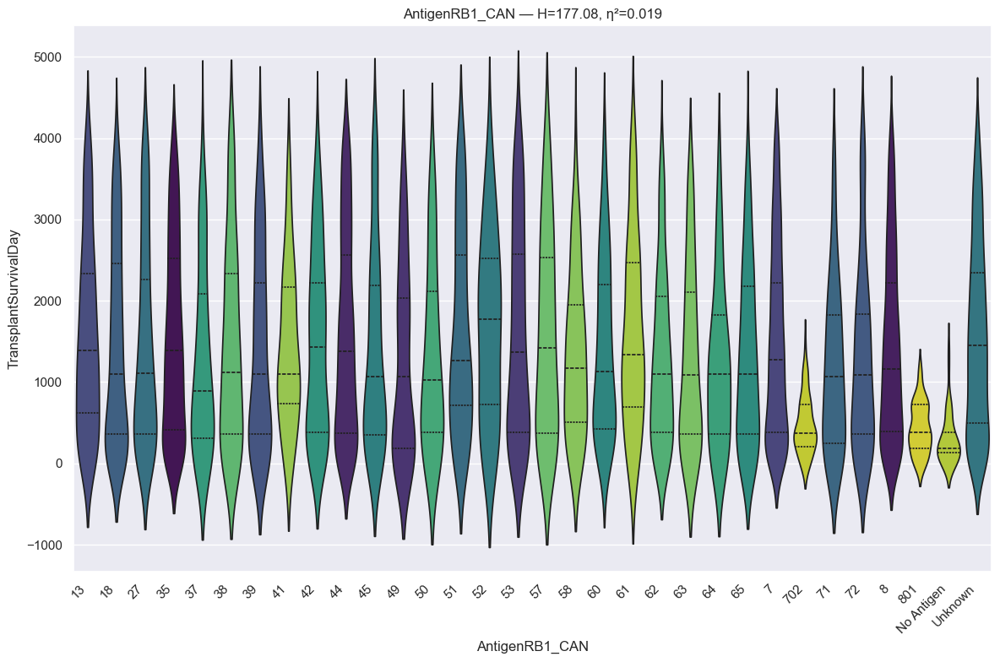

RANKING REPORT: AntigenRB1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 13                                                :    218 records
 * 18                                                :    431 records
 * 27                                                :    244 records
 * 35                                                :    803 records
 * 37                                                :     70 records
 * 38                                                :    118 records
 * 39                                                :    145 records
 * 41                                                :     66 records
 * 42                                                :    172 records
 * 44                                                :    641 records
 * 45                                                :    138 records
 * 49                                                :     93 records
 * 50                                                :     45 records
 * 51                        

In [331]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [332]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRB1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 13                                                :    218 records
 * 18                                                :    431 records
 * 27                                                :    244 records
 * 35                                                :    803 records
 * 37                                                :     70 records
 * 38                                                :    118 records
 * 39                                                :    145 records
 * 41                                                :     66 records
 * 42                                                :    172 records
 * 44                                                :    641 records
 * 45                                                :    138 records
 * 49                                                :     93 records
 * 50                                                :     45 records
 * 51                        

In [333]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RB2
* Antibody-mediated rejection (ABMR) in transplants occurs when the recipient’s immune system forms antibodies against donor antigens (such as HLA or RBC antigens), triggering inflammation and tissue injury. It is categorized as hyperacute, acute, or chronic, requiring immunosuppression and close monitoring for donor-specific antibodies (DSA).

In [334]:
# info
feature = u.get_feature_info(df, 'AntigenRB2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique top freq
AntigenRB2_CAN  8064     89  44  928

:::: NaN Count:
AntigenRB2_CAN    0 



{'AntigenRB2_CAN': CategoricalDtype(categories=['13', '1302', '14', '1401', '1402', '15', '1501', '1502',
                   '1503', '1510', '1516', '1517', '1518', '16', '18', '27',
                   '2703', '2704', '2705', '2708', '35', '3501', '3502', '3503',
                   '3508', '3512', '37', '38', '3801', '39', '3901', '3902',
                   '3905', '3906', '40', '4001', '4002', '4005', '4006', '41',
                   '4101', '4102', '42', '4201', '4202', '44', '4402', '4403',
                   '45', '46', '47', '48', '4801', '49', '5', '50', '5001',
                   '5002', '51', '5101', '5102', '52', '53', '54', '55', '5501',
                   '56', '5601', '57', '5701', '5703', '58', '59', '60', '61',
                   '62', '63', '64', '65', '67', '7', '70', '702', '71', '72',
                   '73', '75', '76', '77', '78', '8', '801', '81', '82', '8201',
                   '98', 'No Antigen', 'Not Tested', 'Unknown'],
 , ordered=False, categories_dtype=str)}

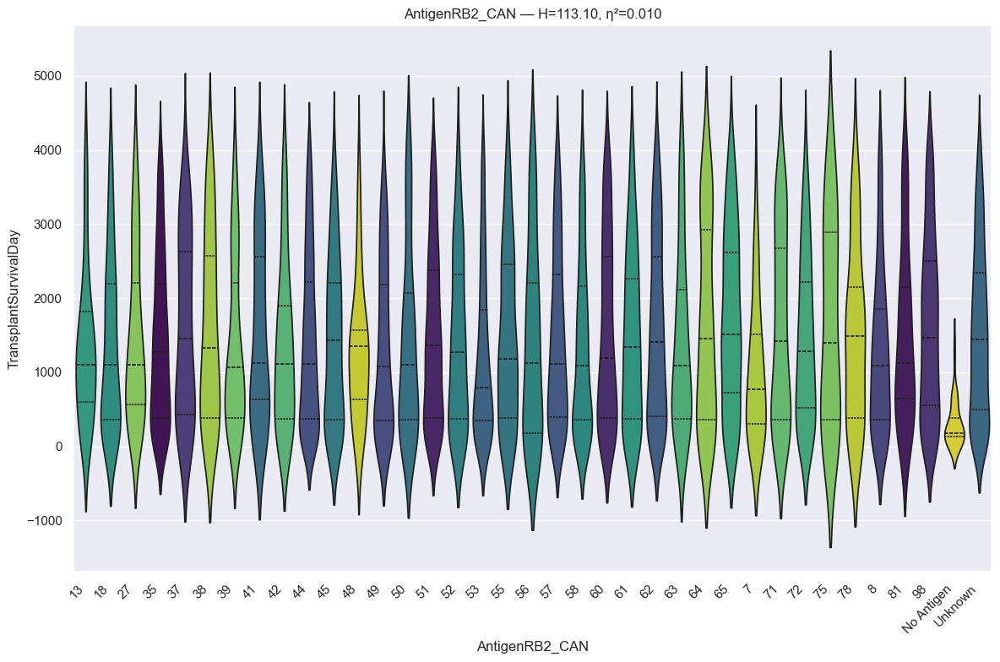

RANKING REPORT: AntigenRB2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 13                                                :     61 records
 * 18                                                :    177 records
 * 27                                                :    146 records
 * 35                                                :    488 records
 * 37                                                :     74 records
 * 38                                                :     80 records
 * 39                                                :    145 records
 * 41                                                :     84 records
 * 42                                                :    107 records
 * 44                                                :    928 records
 * 45                                                :    162 records
 * 48                                                :     35 records
 * 49                                                :    173 records
 * 50                        

In [335]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [336]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRB2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 13                                                :     61 records
 * 18                                                :    177 records
 * 27                                                :    146 records
 * 35                                                :    488 records
 * 37                                                :     74 records
 * 38                                                :     80 records
 * 39                                                :    145 records
 * 41                                                :     84 records
 * 42                                                :    107 records
 * 44                                                :    928 records
 * 45                                                :    162 records
 * 48                                                :     35 records
 * 49                                                :    173 records
 * 50                        

In [337]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RDR1
1. Recipient HLA-DR1 Antigen (RDR1) in Transplant Risk
In the context of transplant immunology, RDR1 refers to the Recipient HLA-DR1 allele.
Malignancy Risk: Studies have shown that the presence of the HLA-DR1 antigen in transplant recipients (RDR1) is a significant predictor of post-transplant malignancies, particularly non-melanoma skin cancers.
Predictive Modeling: Machine learning models have shown that a lower frequency of HLA-DR1 in transplant recipients is associated with a reduced risk of developing these cancers.
Context: This is often analyzed in lung transplant recipients and other solid-organ transplant recipients, where long-term immunosuppression is required. 
2. Plant RDR1 in Cancer Treatment (Xenograft Model) 
A different "RDR1" (RNA-dependent RNA polymerase 1) from plants has been studied for its potential in treating cancer, which can affect transplant patients. 
Antitumor Mechanism: Plant RDR1 has been used in research to boost miRNA expression in cancer cells, inhibiting tumor growth.
Application: Researchers have successfully delivered plant RDR1 into human cancer cell lines, demonstrating its ability to inhibit growth across various solid and blood cancers, suggesting it is a potential new therapeutic agent. 

In [338]:
# info
feature = u.get_feature_info(df, 'AntigenRDR1', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
AntigenRDR1_CAN  8064     47   4  1528

:::: NaN Count:
AntigenRDR1_CAN    0 



{'AntigenRDR1_CAN': CategoricalDtype(categories=['0', '1', '10', '101', '102', '103', '10300', '11', '1101',
                   '1104', '12', '1201', '1202', '13', '1301', '1302', '1303',
                   '1305', '14', '1401', '1404', '1454', '15', '1501', '1502',
                   '1503', '16', '1601', '1602', '17', '18', '2', '3', '301',
                   '302', '4', '401', '402', '403', '404', '405', '406', '407',
                   '411', '5', '6', '7', '8', '801', '802', '9', '901', '99',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

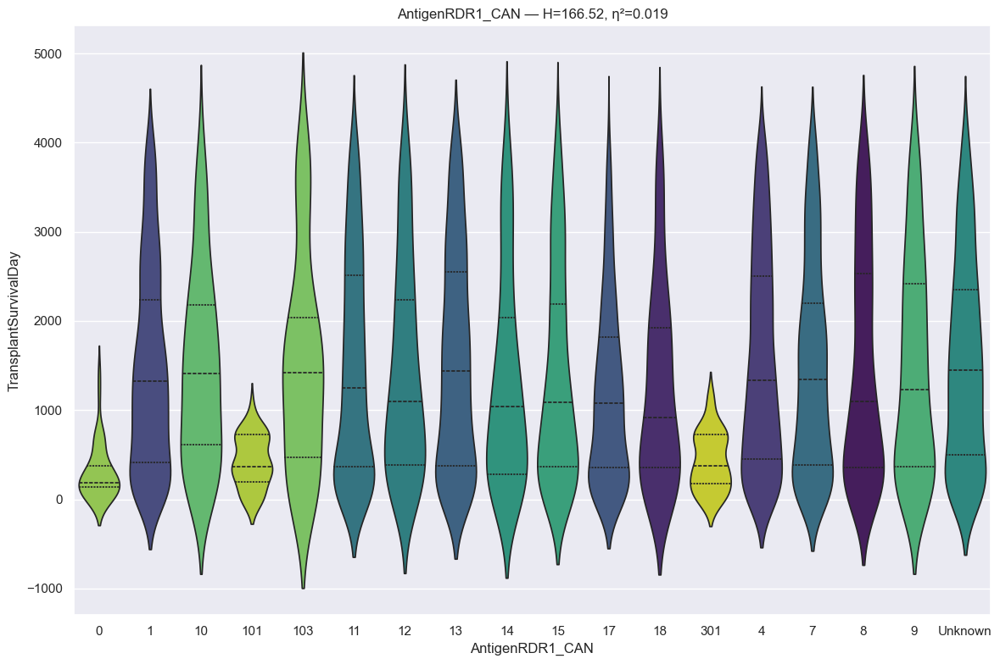

RANKING REPORT: AntigenRDR1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :     41 records
 * 1                                                 :   1066 records
 * 10                                                :    109 records
 * 101                                               :     32 records
 * 103                                               :     75 records
 * 11                                                :    729 records
 * 12                                                :    170 records
 * 13                                                :    596 records
 * 14                                                :    113 records
 * 15                                                :    333 records
 * 17                                                :    635 records
 * 18                                                :    108 records
 * 301                                               :     45 records
 * 4                        

In [339]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [340]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRDR1_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :     41 records
 * 1                                                 :   1066 records
 * 10                                                :    109 records
 * 101                                               :     32 records
 * 103                                               :     75 records
 * 11                                                :    729 records
 * 12                                                :    170 records
 * 13                                                :    596 records
 * 14                                                :    113 records
 * 15                                                :    333 records
 * 17                                                :    635 records
 * 18                                                :    108 records
 * 301                                               :     45 records
 * 4                        

In [341]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Antigen RDR2
* RDR2 is a minor histocompatibility antigen (MiHA)-specific cytotoxic T-cell clone (CTL), frequently associated with the human ATP-dependent interferon-responsive (ADIR) gene. It was isolated from a multiple myeloma (MM) patient who experienced a complete remission after receiving a donor lymphocyte infusion (DLI) following an allogeneic stem cell transplant (alloSCT).

In [342]:
# info
feature = u.get_feature_info(df, 'AntigenRDR2', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                count unique top  freq
AntigenRDR2_CAN  8064     51  15  1536

:::: NaN Count:
AntigenRDR2_CAN    0 



{'AntigenRDR2_CAN': CategoricalDtype(categories=['0', '1', '10', '101', '102', '103', '10300', '11', '1101',
                   '1103', '1104', '12', '1201', '1202', '13', '1301', '1302',
                   '1303', '1305', '14', '1401', '1402', '1403', '1404', '1406',
                   '1454', '15', '1501', '1502', '1503', '16', '1601', '1602',
                   '17', '18', '2', '3', '301', '302', '4', '401', '402', '403',
                   '404', '405', '407', '411', '7', '8', '801', '802', '803',
                   '9', '901', '98', '99', 'Unknown'],
 , ordered=False, categories_dtype=str)}

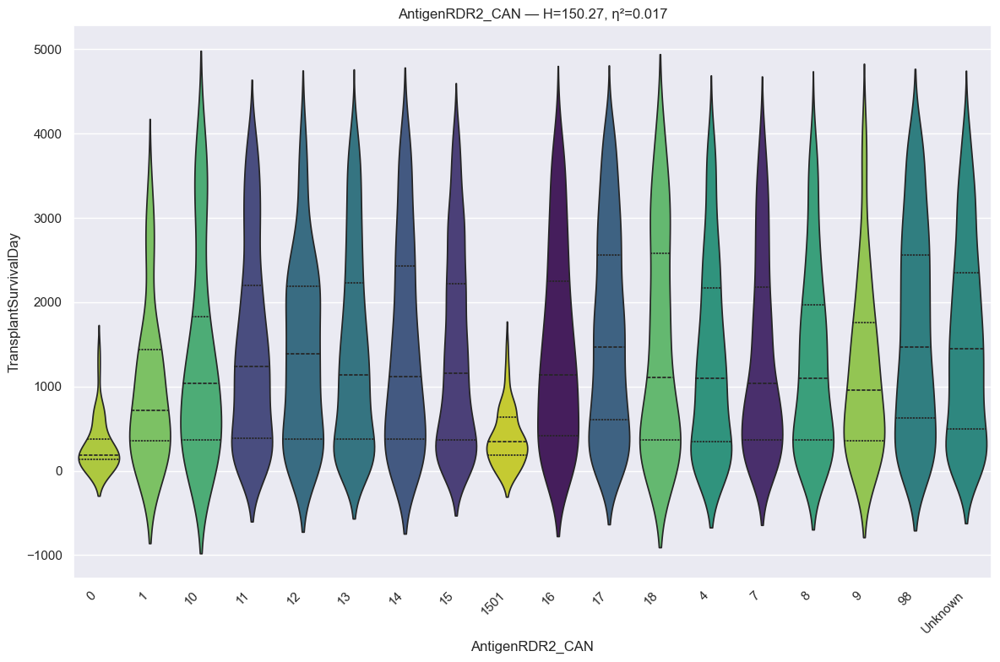

RANKING REPORT: AntigenRDR2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :     40 records
 * 1                                                 :     38 records
 * 10                                                :     86 records
 * 11                                                :    800 records
 * 12                                                :    215 records
 * 13                                                :   1185 records
 * 14                                                :    325 records
 * 15                                                :   1536 records
 * 1501                                              :     45 records
 * 16                                                :    216 records
 * 17                                                :    734 records
 * 18                                                :    169 records
 * 4                                                 :    408 records
 * 7                        

In [343]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [344]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: AntigenRDR2_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :     40 records
 * 1                                                 :     38 records
 * 10                                                :     86 records
 * 11                                                :    800 records
 * 12                                                :    215 records
 * 13                                                :   1185 records
 * 14                                                :    325 records
 * 15                                                :   1536 records
 * 1501                                              :     45 records
 * 16                                                :    216 records
 * 17                                                :    734 records
 * 18                                                :    169 records
 * 4                                                 :    408 records
 * 7                        

In [345]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Malignancy Between Registration Transplant

In [346]:
# info
feature = u.get_feature_info(df, 'MalignancyBetweenRegistrationTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                            count unique      top  freq
MalignancyBetweenRegistrationTransplant_CAN  8064      3  Unknown  5274

:::: NaN Count:
MalignancyBetweenRegistrationTransplant_CAN    0 



{'MalignancyBetweenRegistrationTransplant_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

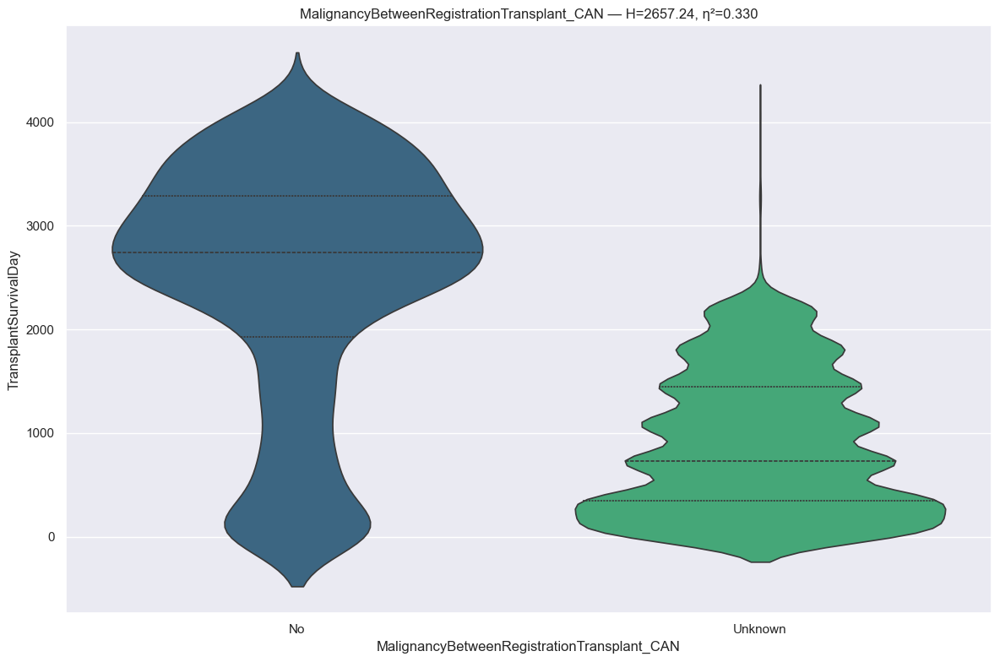

RANKING REPORT: MalignancyBetweenRegistrationTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   2779 records
 * Unknown                                           :   5274 records
BYPASSED CATEGORIES (n < min_n):
 * Yes                                               :     11 records
--------------------------------------------------------------------------------
Kruskal H: 2657.2383 | P-value: 0.000000e+00 | Effect η²: 0.3299
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=0.0000e+00 | thr=0.0500 | r=-0.698 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Unknown

>>> Other (1 categories)
  - Yes

MalignancyBetweenRegis

In [347]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [348]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### CMV IGG Transplant
* A CMV IgG test detects antibodies indicating past or present infection with Cytomegalovirus, a common herpes virus. Positive results usually show prior exposure and immunity, while rising IgG levels in paired samples indicate an active or recent infection. It is crucial for assessing risk in pregnant women and immunocompromised individuals

In [349]:
# info
feature = u.get_feature_info(df, 'CMV_IGG_Transplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique      top  freq
CMV_IGG_Transplant_CAN  8064      4  Unknown  5276

:::: NaN Count:
CMV_IGG_Transplant_CAN    0 



{'CMV_IGG_Transplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

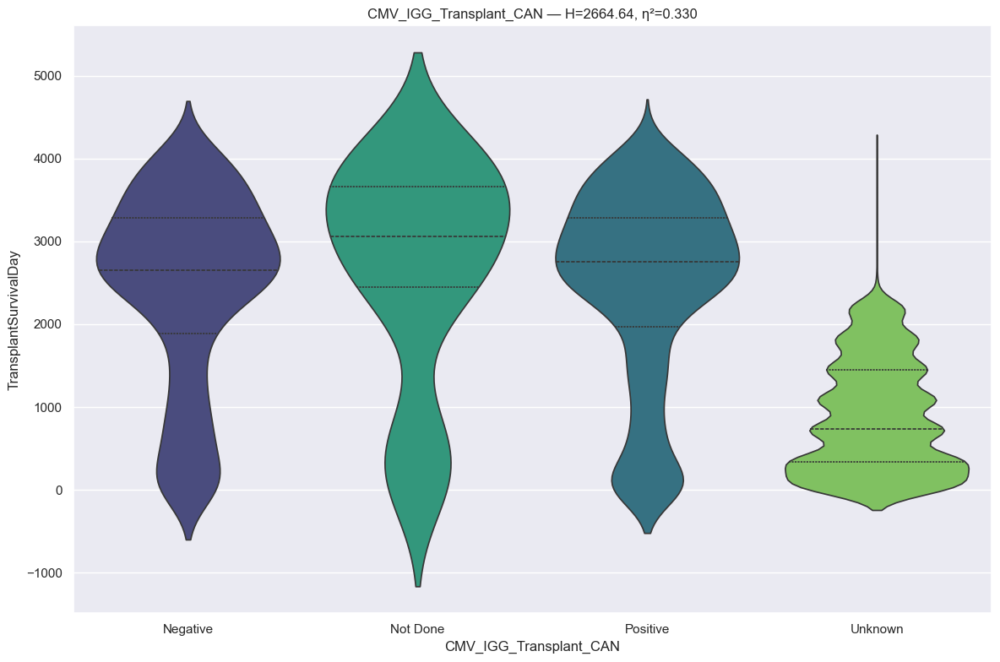

RANKING REPORT: CMV_IGG_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :    884 records
 * Not Done                                          :     58 records
 * Positive                                          :   1846 records
 * Unknown                                           :   5276 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2664.6393 | P-value: 0.000000e+00 | Effect η²: 0.3302
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Positive     vs Unknown      | p=0.0000e+00 | thr=0.0083 | r=-0.698 | *Sig*
Negative     vs Unknown      | p=3.6805e-242 | thr=0.0083 | r=-0.697 | *Sig*
Not Done     vs Unknown      | p=1.8085e-19 | thr=0.0083 | r=-0.688 | *Sig*
Negative     vs Not Done     | p=3.8735e-02 | thr=0.0083 | r= 0.162 | Not S

In [350]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [351]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### CMV IGM Transplant
* CMV IgM is an antibody test detecting the body’s initial immune response to a recent or active Cytomegalovirus (CMV) infection, with levels typically rising 1–2 weeks after exposure. A positive result indicates current infection or reactivation, though IgM can persist for months. It is often used to diagnose primary infection, especially in pregnancy.

In [352]:
# info
feature = u.get_feature_info(df, 'CMV_IGM_Transplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique      top  freq
CMV_IGM_Transplant_CAN  8064      4  Unknown  5315

:::: NaN Count:
CMV_IGM_Transplant_CAN    0 



{'CMV_IGM_Transplant_CAN': CategoricalDtype(categories=['Negative', 'Not Done', 'Positive', 'Unknown'], ordered=False, categories_dtype=str)}

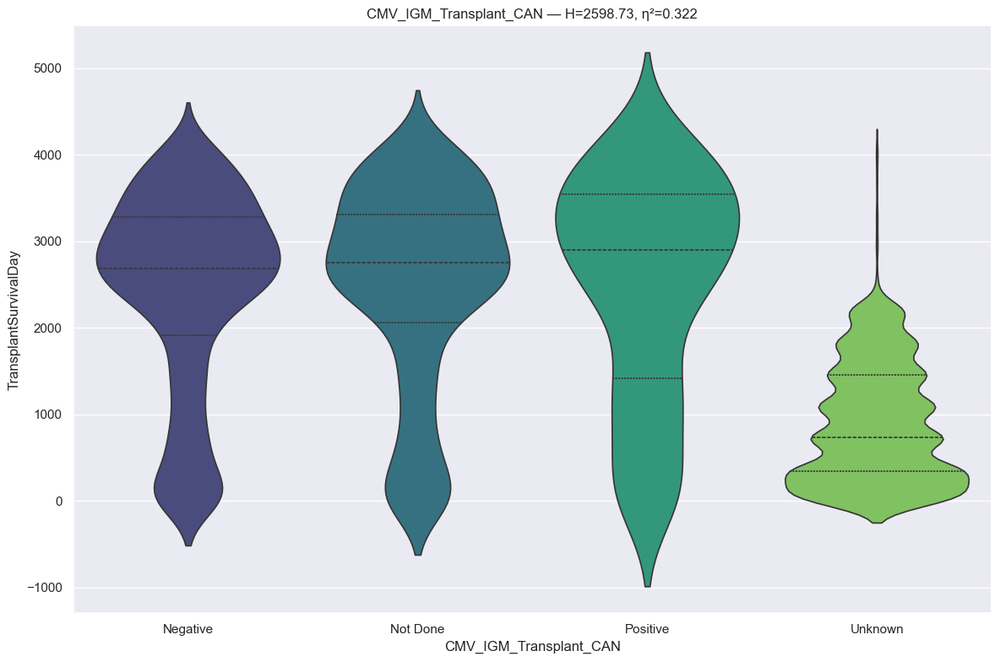

RANKING REPORT: CMV_IGM_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   1852 records
 * Not Done                                          :    780 records
 * Positive                                          :    117 records
 * Unknown                                           :   5315 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2598.7324 | P-value: 0.000000e+00 | Effect η²: 0.3221
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Negative     vs Unknown      | p=0.0000e+00 | thr=0.0083 | r=-0.690 | *Sig*
Not Done     vs Unknown      | p=2.3811e-219 | thr=0.0083 | r=-0.700 | *Sig*
Positive     vs Unknown      | p=3.6679e-34 | thr=0.0083 | r=-0.658 | *Sig*
Negative     vs Not Done     | p=1.7781e-01 | thr=0.0083 | r= 0.033 | Not S

In [353]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [354]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: CMV_IGM_Transplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Negative                                          :   1852 records
 * Not Done                                          :    780 records
 * Positive                                          :    117 records
 * Unknown                                           :   5315 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2598.7324 | P-value: 0.000000e+00 | Effect η²: 0.3221
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (3 categories)
  - Negative
  - Not Done
  - Positive

>>> Group_2 (1 categories)
  - Unknown



In [355]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Transplant Type

In [356]:
# info
feature = u.get_feature_info(df, 'TransplantType', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                   count unique top  freq
TransplantType_CAN  8064      3   O  8046

:::: NaN Count:
TransplantType_CAN    0 



{'TransplantType_CAN': CategoricalDtype(categories=['H', 'O', 'Unknown'], ordered=False, categories_dtype=str)}

In [357]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

[WARNING] Cannot perform statistical comparison for TransplantType_CAN
          Only 1 category has n ≥ 30.
          You can only compare MORE THAN ONE category since n < min_n.

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - O

TransplantType_CAN  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
                 O         1426.619935                1112.0                 4195.0                    0.0          8046
           Unknown          137.384615                 155.0                  198.0                    3.0            13
                 H          860.600000                1260.0                 1471.0                    0.0             5


In [358]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** Unable to determine statistical significance due to small sample size, removing this feature is reasonable due to its extreme sparsity and imbalance.

#### Primary Diagnosis Type

In [359]:
# info
feature = u.get_feature_info(df, 'PrimaryDiagnosisType', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                         count unique                           top  freq
PrimaryDiagnosisType_CAN  8064     34  DILATED MYOPATHY: IDIOPATHIC  2763

:::: NaN Count:
PrimaryDiagnosisType_CAN    0 



{'PrimaryDiagnosisType_CAN': CategoricalDtype(categories=['ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY',
                   'CANCER', 'CONGENITAL HEART DEFECT - PRIOR SURGERY UNKNOWN',
                   'CONGENITAL HEART DEFECT - WITH SURGERY',
                   'CONGENITAL HEART DEFECT - WITHOUT SURGERY',
                   'CORONARY ARTERY DISEASE',
                   'COVID-19: DILATED MYOPATHY: ACTIVE MYOCARDITIS',
                   'COVID-19: DILATED MYOPATHY: HISTORY OF MYOCARDITIS',
                   'DILATED MYOPATHY: ADRIAMYCIN',
                   'DILATED MYOPATHY: ALCOHOLIC', 'DILATED MYOPATHY: FAMILIAL',
                   'DILATED MYOPATHY: IDIOPATHIC', 'DILATED MYOPATHY: ISCHEMIC',
                   'DILATED MYOPATHY: MYOCARDITIS',
                   'DILATED MYOPATHY: OTHER SPECIFY',
                   'DILATED MYOPATHY: POST PARTUM', 'DILATED MYOPATHY: VIRAL',
                   'DILATED MYOPATHY: VIRAL (NOT COVID-19)',
                   'HEART RE-T

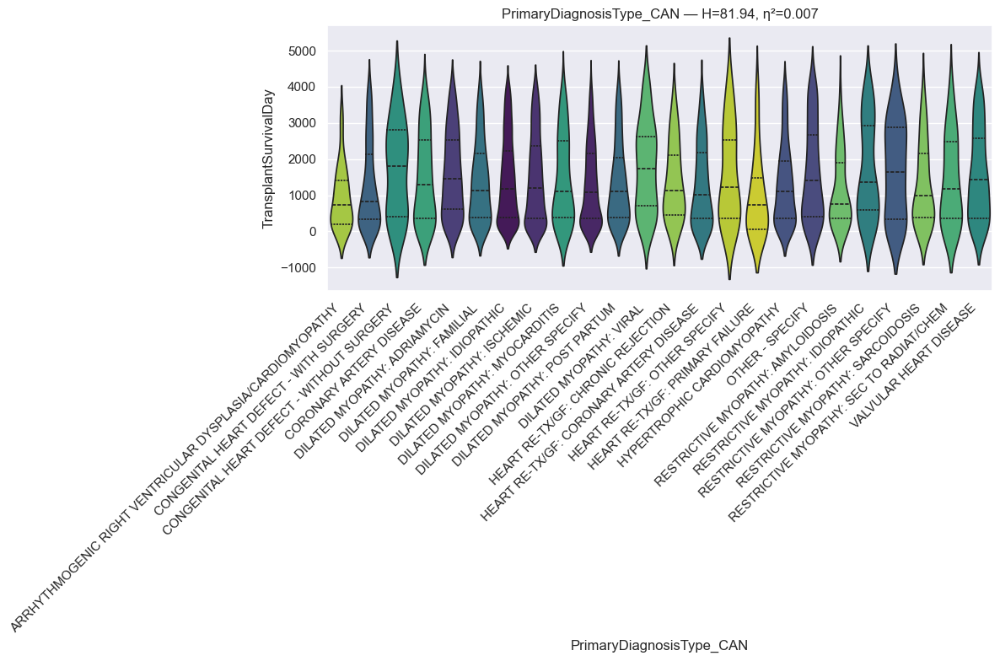

RANKING REPORT: PrimaryDiagnosisType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:     66 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    369 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     30 records
 * CORONARY ARTERY DISEASE                           :    117 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    336 records
 * DILATED MYOPATHY: FAMILIAL                        :    371 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   2763 records
 * DILATED MYOPATHY: ISCHEMIC                        :   1239 records
 * DILATED MYOPATHY: MYOCARDITIS                     :     98 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :    806 records
 * DILATED MYOPATHY: POST PARTUM                     :    370 records
 * DILATED MYOPATHY: VIRAL                           :     66 records
 * HEART RE-TX/GF: CHRONIC REJECTION                 :     46 records
 * HEART RE-

In [360]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": True,
    "rotation": 45
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [361]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PrimaryDiagnosisType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * ARRHYTHMOGENIC RIGHT VENTRICULAR DYSPLASIA/CARDIOMYOPATHY:     66 records
 * CONGENITAL HEART DEFECT - WITH SURGERY            :    369 records
 * CONGENITAL HEART DEFECT - WITHOUT SURGERY         :     30 records
 * CORONARY ARTERY DISEASE                           :    117 records
 * DILATED MYOPATHY: ADRIAMYCIN                      :    336 records
 * DILATED MYOPATHY: FAMILIAL                        :    371 records
 * DILATED MYOPATHY: IDIOPATHIC                      :   2763 records
 * DILATED MYOPATHY: ISCHEMIC                        :   1239 records
 * DILATED MYOPATHY: MYOCARDITIS                     :     98 records
 * DILATED MYOPATHY: OTHER SPECIFY                   :    806 records
 * DILATED MYOPATHY: POST PARTUM                     :    370 records
 * DILATED MYOPATHY: VIRAL                           :     66 records
 * HEART RE-TX/GF: CHRONIC REJECTION                 :     46 records
 * HEART RE-

In [362]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Dialysis Prior Registration
* Dialysis is a life-sustaining treatment for kidney failure that filters waste and excess fluids from the blood when the kidneys can no longer function, usually required when function drops below 10-15%. Hemodialysis typically takes 3-4 hours per session, three times a week, while peritoneal dialysis is done daily at home. Common side effects include fatigue, nausea, and low blood pressure, while long-term care requires careful management of diet and fluid intake.

In [363]:
# info
feature = u.get_feature_info(df, 'DialysisPriorRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                              count unique top  freq
DialysisPriorRegistration_CAN  8064      3  No  7684

:::: NaN Count:
DialysisPriorRegistration_CAN    0 



{'DialysisPriorRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

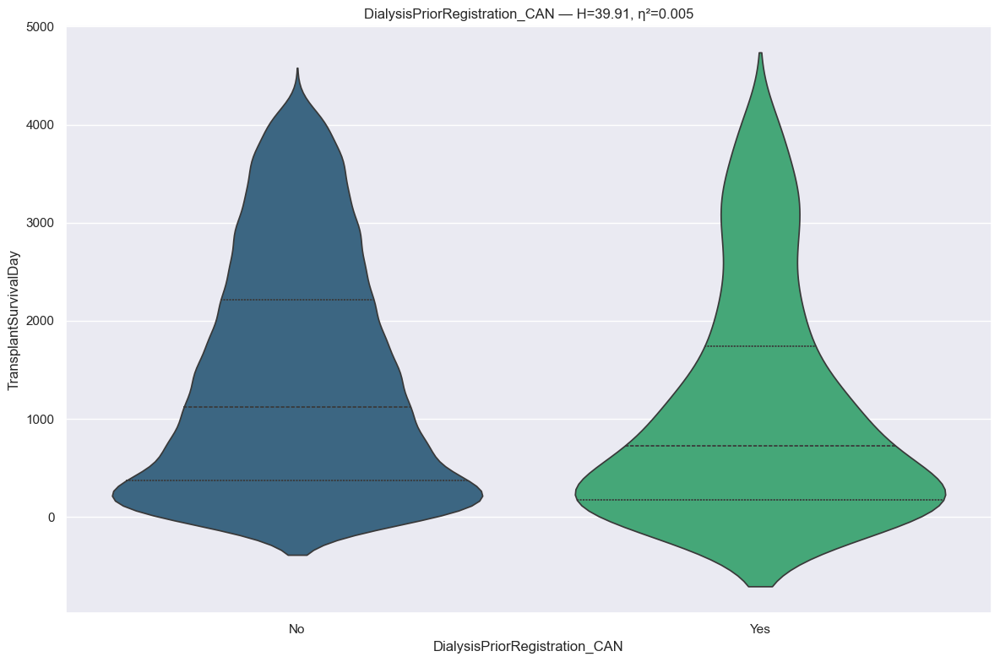

RANKING REPORT: DialysisPriorRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   7684 records
 * Yes                                               :    358 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     22 records
--------------------------------------------------------------------------------
Kruskal H: 39.9091 | P-value: 2.660636e-10 | Effect η²: 0.0048
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.6608e-10 | thr=0.0500 | r=-0.197 | *Sig*
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (1 categories)
  - Yes

>>> Other (1 categories)
  - Unknown

DialysisPriorRegistration_CAN  mean_su

In [364]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [365]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Life Support Transplant
* Life support comprises temporary medical techniques—such as mechanical ventilation, dialysis, and feeding tubes—designed to sustain vital functions when organs fail, often used in ICU settings while treating underlying illnesses. It can last from a few days to years, depending on the prognosis. Decisions are often deeply personal, involving ethical considerations regarding quality of life and the prolongation of the dying process.

In [366]:
# info
feature = u.get_feature_info(df, 'LifeSupportTransplant_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                          count unique  top  freq
LifeSupportTransplant_CAN  8064      3  Yes  6094

:::: NaN Count:
LifeSupportTransplant_CAN    0 



{'LifeSupportTransplant_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

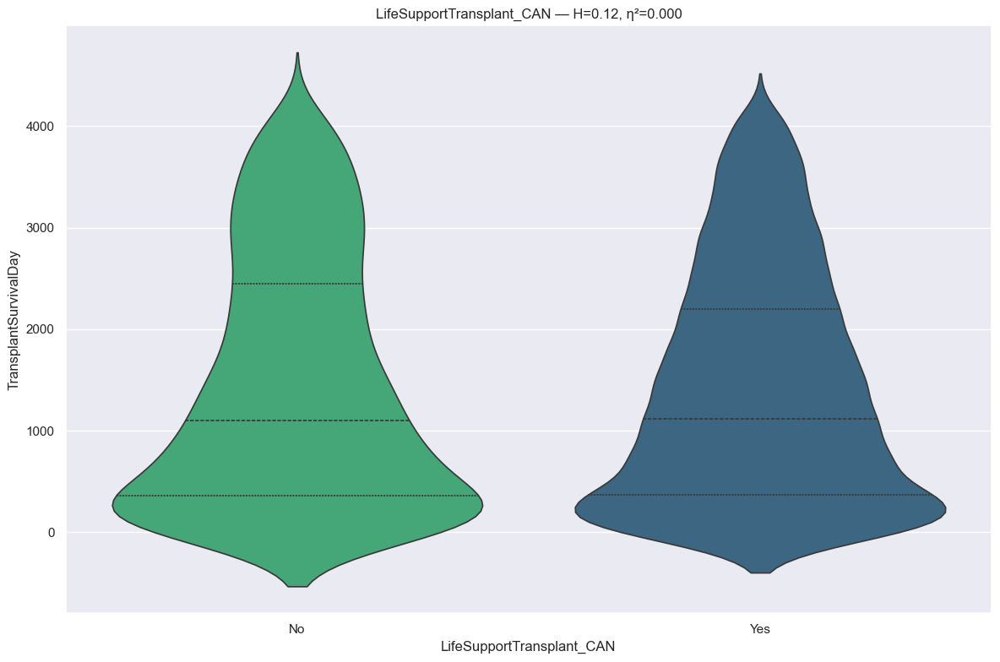

RANKING REPORT: LifeSupportTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   1957 records
 * Yes                                               :   6094 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :     13 records
--------------------------------------------------------------------------------
Kruskal H: 0.1210 | P-value: 7.279245e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=7.2793e-01 | thr=0.0500 | r= 0.005 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Other (1 categories)
  - Unknown

LifeSupportTransplant_CAN  mean_survival_days  median_survival_days  

In [367]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [368]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature is statistically significant and has practical significance from missing data, but the size is small, so we will remove the feature.

#### Prior Cardiac Surgery List And Transplant

In [369]:
# info
feature = u.get_feature_info(df, 'PriorCardiacSurgeryListAndTransplant', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                         count unique top  freq
PriorCardiacSurgeryListAndTransplant_CAN  8064      3  No  6494

:::: NaN Count:
PriorCardiacSurgeryListAndTransplant_CAN    0 



{'PriorCardiacSurgeryListAndTransplant_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

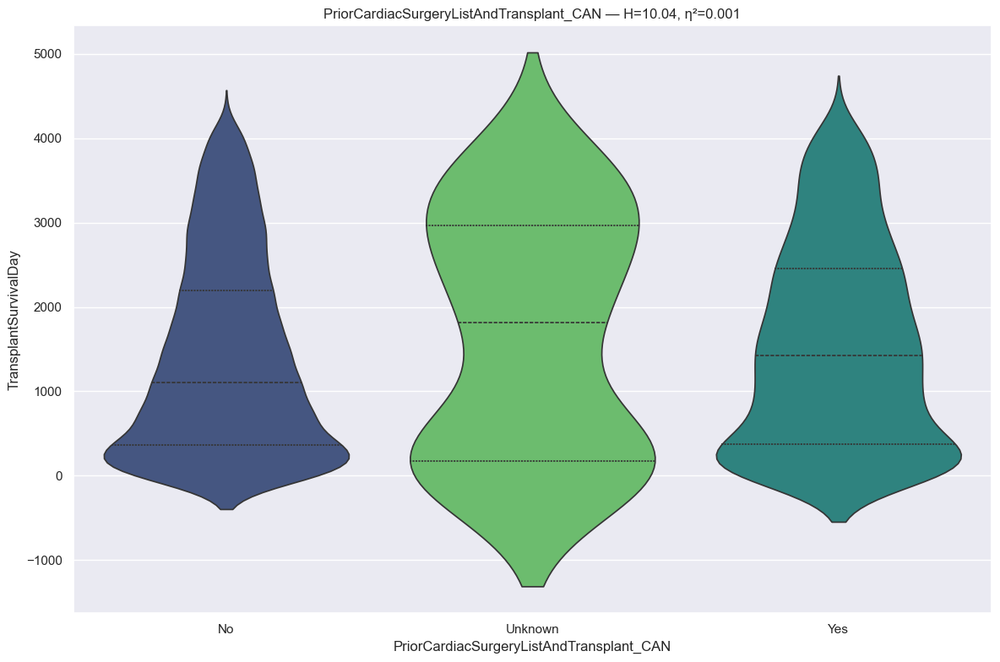

RANKING REPORT: PriorCardiacSurgeryListAndTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6494 records
 * Unknown                                           :     46 records
 * Yes                                               :   1524 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 10.0389 | P-value: 6.608082e-03 | Effect η²: 0.0010
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=1.8694e-03 | thr=0.0167 | r= 0.051 | *Sig*
No           vs Unknown      | p=4.8030e-01 | thr=0.0167 | r= 0.060 | Not Sig
Unknown      vs Yes          | p=7.0351e-01 | thr=0.0167 | r=-0.033 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::

In [370]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [371]:
# values for NominalSurvivalRanker
class_values = {"method": "fdr", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PriorCardiacSurgeryListAndTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6494 records
 * Unknown                                           :     46 records
 * Yes                                               :   1524 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 10.0389 | P-value: 6.608082e-03 | Effect η²: 0.0010
Correction Method: FDR
Pairwise Testing (Base Alpha: 0.05 | Method: FDR | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (2 categories)
  - Unknown
  - Yes



In [372]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: PriorCardiacSurgeryListAndTransplant_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6494 records
 * Unknown                                           :     46 records
 * Yes                                               :   1524 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 10.0389 | P-value: 6.608082e-03 | Effect η²: 0.0010
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 categories)
  - No

>>> Group_2 (2 categories)
  - Unknown
  - Yes



In [373]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### Malignancy

In [374]:
# info
feature = u.get_feature_info(df, r'^Malignancy_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

               count unique top  freq
Malignancy_CAN  8064      3  No  6986

:::: NaN Count:
Malignancy_CAN    0 



{'Malignancy_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

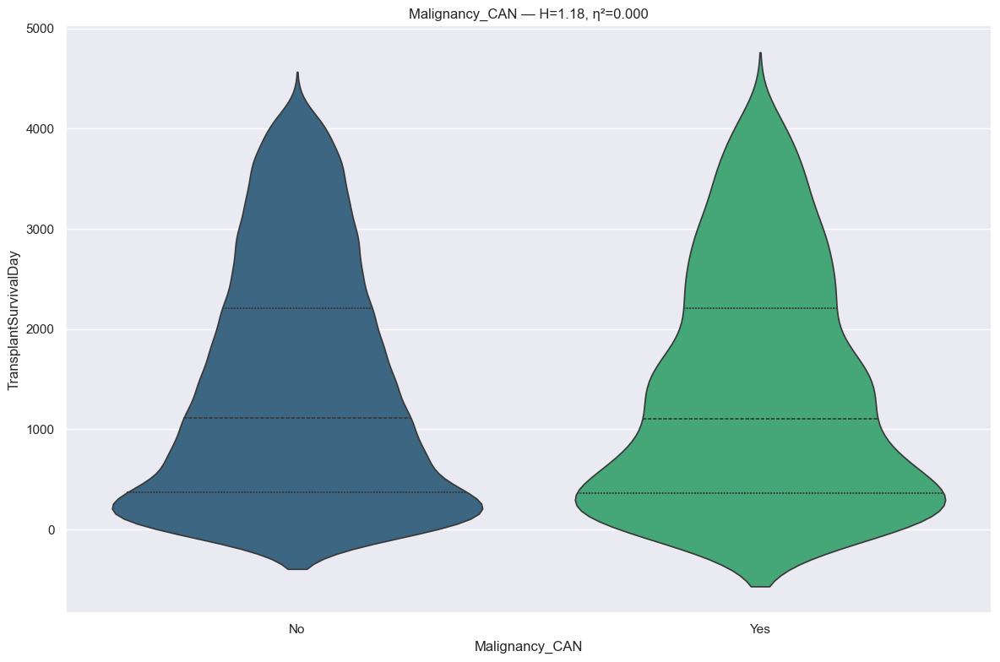

RANKING REPORT: Malignancy_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6986 records
 * Yes                                               :   1071 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      7 records
--------------------------------------------------------------------------------
Kruskal H: 1.1786 | P-value: 2.776386e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Yes          | p=2.7764e-01 | thr=0.0500 | r=-0.021 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Other (1 categories)
  - Unknown

Malignancy_CAN  mean_survival_days  median_survival_days  maximum_survival_days 

In [375]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [376]:
# values for NominalSurvivalRanker
class_values = {"method": "holm", "r_thresh": 0.04, "suppress_pairwise": True}  # more relaxed
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=True)

RANKING REPORT: Malignancy_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6986 records
 * Yes                                               :   1071 records
BYPASSED CATEGORIES (n < min_n):
 * Unknown                                           :      7 records
--------------------------------------------------------------------------------
Kruskal H: 1.1786 | P-value: 2.776386e-01 | Effect η²: 0.0000
Correction Method: HOLM
Pairwise Testing (Base Alpha: 0.05 | Method: HOLM | r_threshold: 0.04)
--------------------------------------------------------------------------------
[Pairwise comparison output suppressed]
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - No
  - Yes

>>> Other (1 categories)
  - Unknown



In [377]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Ventilatory Support After Registration

In [378]:
# info
feature = u.get_feature_info(df, 'VentilatorySupportAfterRegistration', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                                        count unique top  freq
VentilatorySupportAfterRegistration_CAN  8064      3  No  6620

:::: NaN Count:
VentilatorySupportAfterRegistration_CAN    0 



{'VentilatorySupportAfterRegistration_CAN': CategoricalDtype(categories=['No', 'Unknown', 'Yes'], ordered=False, categories_dtype=str)}

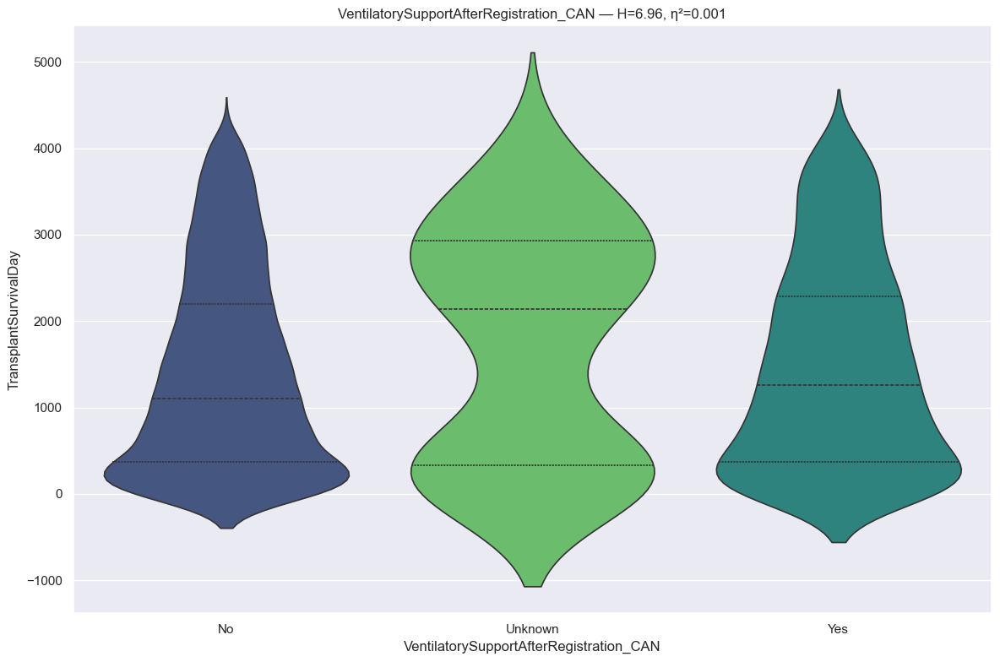

RANKING REPORT: VentilatorySupportAfterRegistration_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :   6620 records
 * Unknown                                           :     95 records
 * Yes                                               :   1349 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 6.9630 | P-value: 3.076184e-02 | Effect η²: 0.0006
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
No           vs Unknown      | p=3.4646e-02 | thr=0.0167 | r= 0.126 | Not Sig
Unknown      vs Yes          | p=8.7737e-02 | thr=0.0167 | r=-0.105 | Not Sig
No           vs Yes          | p=9.6715e-02 | thr=0.0167 | r= 0.029 | Not Sig
::::: Collapsed into 2 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES :::::::::::::::::::

In [379]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [380]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Heart Procedure Type

In [381]:
# info
feature = u.get_feature_info(df, 'HeartProcedureType', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                       count unique                 top  freq
HeartProcedureType_CAN  8064      5  Orthotopic Bicaval  6537

:::: NaN Count:
HeartProcedureType_CAN    0 



{'HeartProcedureType_CAN': CategoricalDtype(categories=['Heterotopic', 'Orthotopic Bicaval',
                   'Orthotopic Total (Bicaval, PV)', 'Orthotopic Traditional',
                   'Unknown'],
 , ordered=False, categories_dtype=str)}

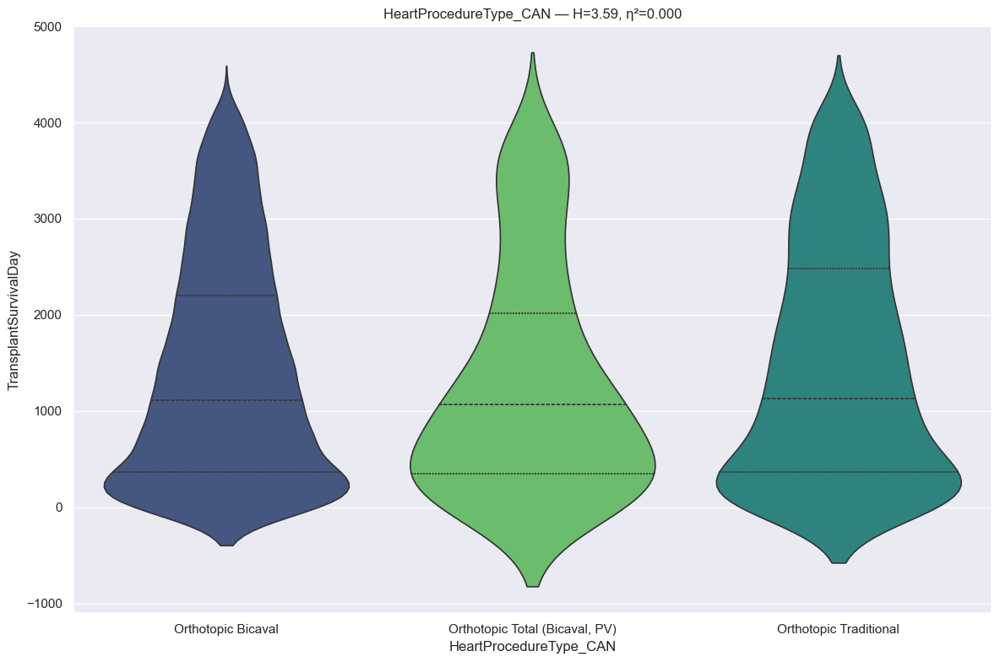

RANKING REPORT: HeartProcedureType_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * Orthotopic Bicaval                                :   6537 records
 * Orthotopic Total (Bicaval, PV)                    :    174 records
 * Orthotopic Traditional                            :   1335 records
BYPASSED CATEGORIES (n < min_n):
 * Heterotopic                                       :      5 records
 * Unknown                                           :     13 records
--------------------------------------------------------------------------------
Kruskal H: 3.5923 | P-value: 1.659364e-01 | Effect η²: 0.0002
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Orthotopic Total (Bicaval, PV) vs Orthotopic Traditional | p=7.3708e-02 | thr=0.0167 | r= 0.083 | Not Sig
Orthotopic Bicaval vs Orthotopic Total (Bicaval, PV) | p=8.6096e-02 | thr=0.0167 | r=-0.076 | Not Sig
Orthotopic Bicaval vs 

In [382]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [383]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** This feature does not have a statistically or practically significant impact on survival.

#### Transplant Year

In [384]:
# info
feature = u.get_feature_info(df, 'TransplantYear', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                     count        mean       std     min     25%     50%     75%     max
TransplantYear_CAN  8064.0  2016.09933  3.371633  2010.0  2013.0  2016.0  2019.0  2021.0

:::: NaN Count:
TransplantYear_CAN    0 



{'TransplantYear_CAN': dtype('int64')}

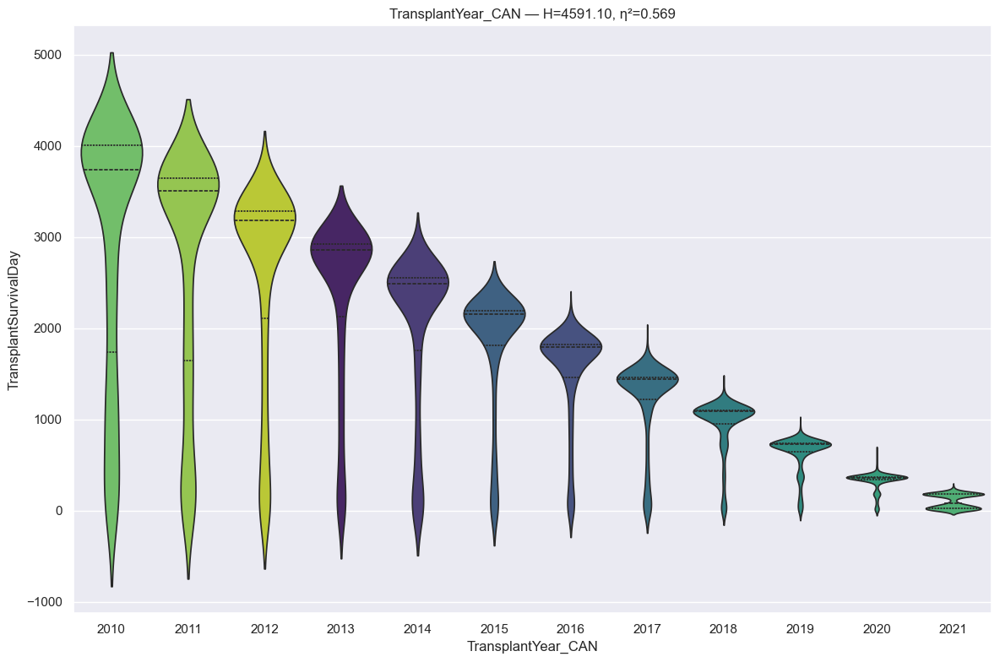

RANKING REPORT: TransplantYear_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 2010                                              :    475 records
 * 2011                                              :    544 records
 * 2012                                              :    549 records
 * 2013                                              :    580 records
 * 2014                                              :    588 records
 * 2015                                              :    607 records
 * 2016                                              :    712 records
 * 2017                                              :    731 records
 * 2018                                              :    827 records
 * 2019                                              :    856 records
 * 2020                                              :    838 records
 * 2021                                              :    757 records
BYPASSED CATEGORIES: None
---------------------------------------------------------------------

In [385]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": True,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [386]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** DO NOT USE!

#### Listing Year

In [387]:
# info
feature = u.get_feature_info(df, 'ListingYear_CAN', cat=False)
# dtype
{col: df[col].dtype for col in feature}

                  count         mean       std     min     25%     50%     75%     max
ListingYear_CAN  8064.0  2015.595362  3.544488  1999.0  2013.0  2016.0  2019.0  2021.0

:::: NaN Count:
ListingYear_CAN    0 



{'ListingYear_CAN': dtype('int64')}

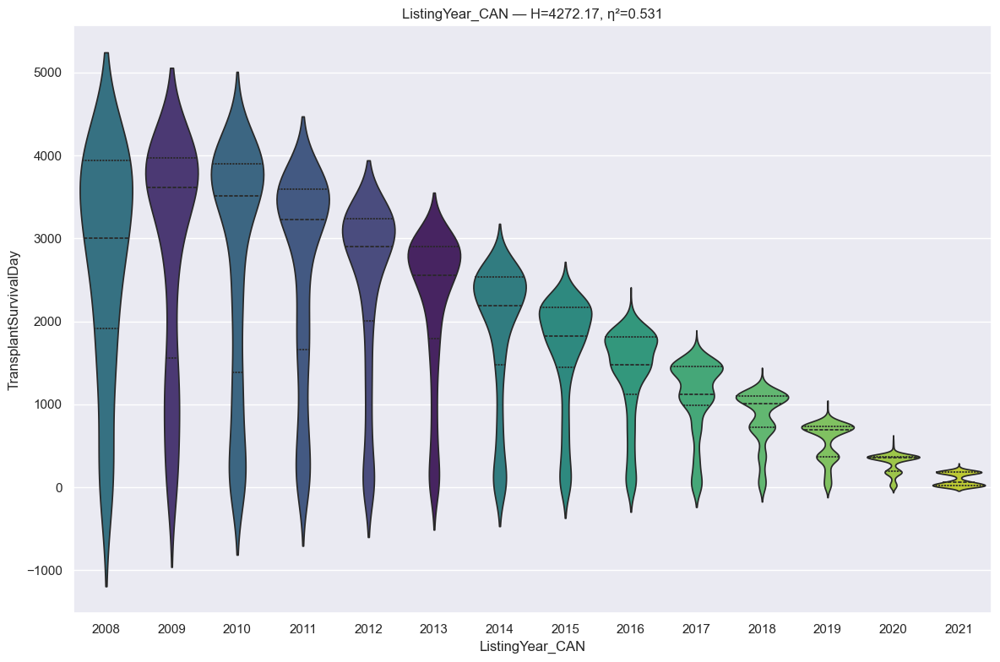

RANKING REPORT: ListingYear_CAN (n ≥ 30)
INCLUDED CATEGORIES:
 * 2008                                              :     48 records
 * 2009                                              :    177 records
 * 2010                                              :    516 records
 * 2011                                              :    532 records
 * 2012                                              :    582 records
 * 2013                                              :    599 records
 * 2014                                              :    614 records
 * 2015                                              :    658 records
 * 2016                                              :    692 records
 * 2017                                              :    721 records
 * 2018                                              :    775 records
 * 2019                                              :    800 records
 * 2020                                              :    743 records
 * 2021                     

In [388]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [389]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** DO NOT USE!

#### CrossMatchDone

In [390]:
# info
feature = u.get_feature_info(df, 'CrossMatchDone', cat=True)

               count unique  top  freq
CrossMatchDone  8064      3  Yes  7534

:::: NaN Count:
CrossMatchDone    0 

--- CrossMatchDone ---
dtype: category
Categories: ['No', 'Unknown', 'Yes']
Ordered: False



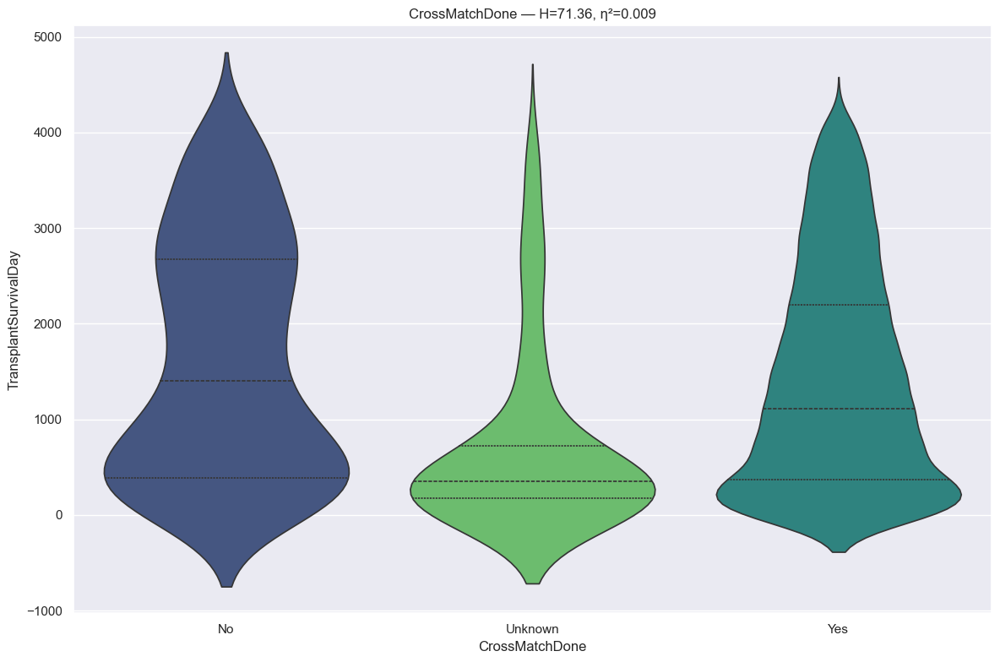

RANKING REPORT: CrossMatchDone (n ≥ 30)
INCLUDED CATEGORIES:
 * No                                                :    398 records
 * Unknown                                           :    132 records
 * Yes                                               :   7534 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 71.3634 | P-value: 3.188871e-16 | Effect η²: 0.0086
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0167 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Unknown      vs Yes          | p=1.1055e-15 | thr=0.0167 | r= 0.406 | *Sig*
No           vs Unknown      | p=1.6193e-15 | thr=0.0167 | r=-0.462 | *Sig*
No           vs Yes          | p=1.2575e-02 | thr=0.0167 | r=-0.074 | *Sig*
::::: Collapsed into 3 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (1 ca

In [391]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [392]:
# mapping dictionary
collapse_map = results['mapping']
# update feature & mapping dataframe
df[feature[0]] = (df[feature[0]].map(collapse_map).astype("category"))
mapping_df.loc[mapping_df["feature"] == feature[0], "consolidate"] = True
# sanity check
df[feature[0]].isna().any()

np.False_

#### MismatchLevel_AMIS

In [393]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_AMIS', cat=True)

                   count unique top  freq
MismatchLevel_AMIS  8064      4   2  3741

:::: NaN Count:
MismatchLevel_AMIS    0 

--- MismatchLevel_AMIS ---
dtype: category
Categories: ['0', '1', '2', 'Unknown']
Ordered: False



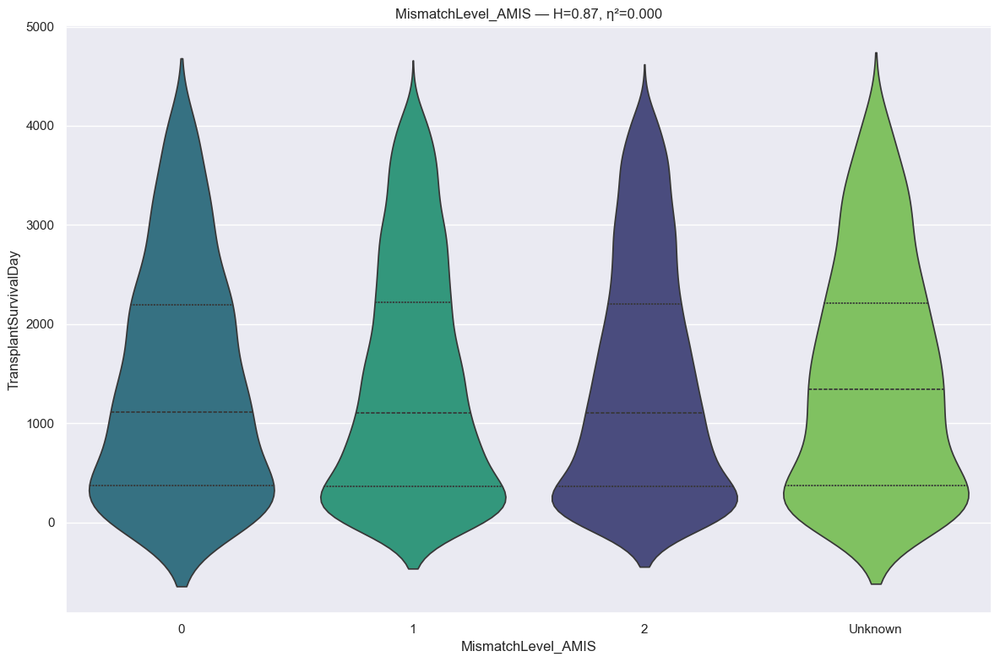

RANKING REPORT: MismatchLevel_AMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    523 records
 * 1                                                 :   3116 records
 * 2                                                 :   3741 records
 * Unknown                                           :    684 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.8680 | P-value: 8.331508e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
2            vs Unknown      | p=3.6518e-01 | thr=0.0083 | r= 0.022 | Not Sig
1            vs Unknown      | p=4.0394e-01 | thr=0.0083 | r= 0.020 | Not Sig
0            vs Unknown      | p=4.6796e-01 | thr=0.0083 | r= 0.024 | Not Sig
0            vs 1            | p=9.0359e-01 | thr=0.0083 | r= 0.003 | Not Sig

In [394]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [395]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### MismatchLevel_BMIS

In [396]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_BMIS', cat=True)

                   count unique top  freq
MismatchLevel_BMIS  8064      4   2  5262

:::: NaN Count:
MismatchLevel_BMIS    0 

--- MismatchLevel_BMIS ---
dtype: category
Categories: ['0', '1', '2', 'Unknown']
Ordered: False



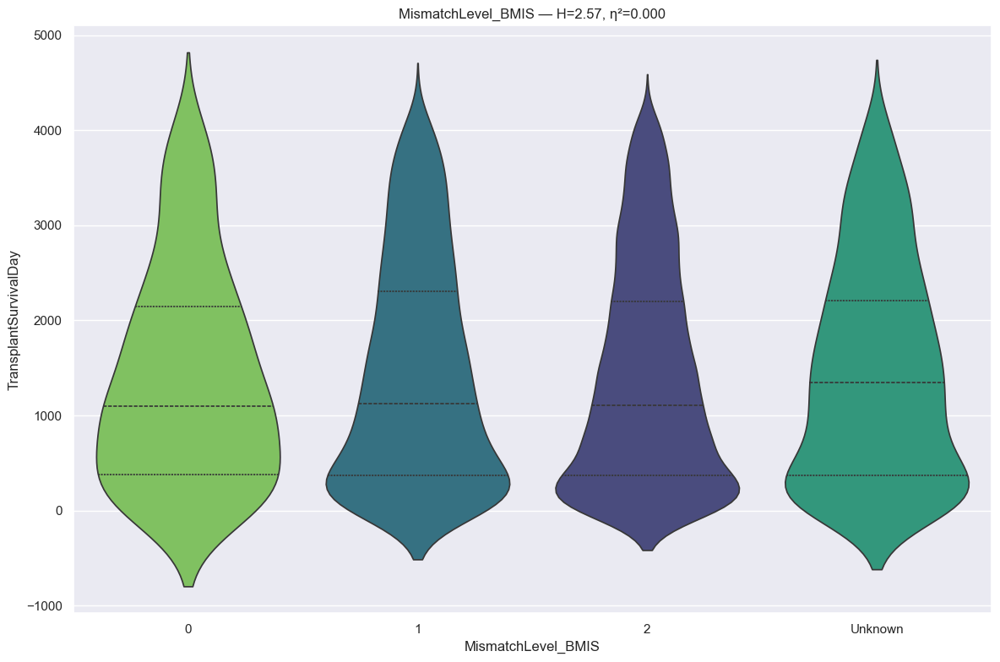

RANKING REPORT: MismatchLevel_BMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    174 records
 * 1                                                 :   1944 records
 * 2                                                 :   5262 records
 * Unknown                                           :    684 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2.5714 | P-value: 4.625256e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
1            vs 2            | p=1.9159e-01 | thr=0.0083 | r=-0.020 | Not Sig
2            vs Unknown      | p=2.5375e-01 | thr=0.0083 | r= 0.027 | Not Sig
0            vs Unknown      | p=6.5332e-01 | thr=0.0083 | r= 0.022 | Not Sig
0            vs 1            | p=7.6601e-01 | thr=0.0083 | r= 0.014 | Not Sig

In [397]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [398]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### MismatchLevel_DRMIS

In [399]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_DRMIS', cat=True)

                    count unique top  freq
MismatchLevel_DRMIS  8064      4   2  3952

:::: NaN Count:
MismatchLevel_DRMIS    0 

--- MismatchLevel_DRMIS ---
dtype: category
Categories: ['0', '1', '2', 'Unknown']
Ordered: False



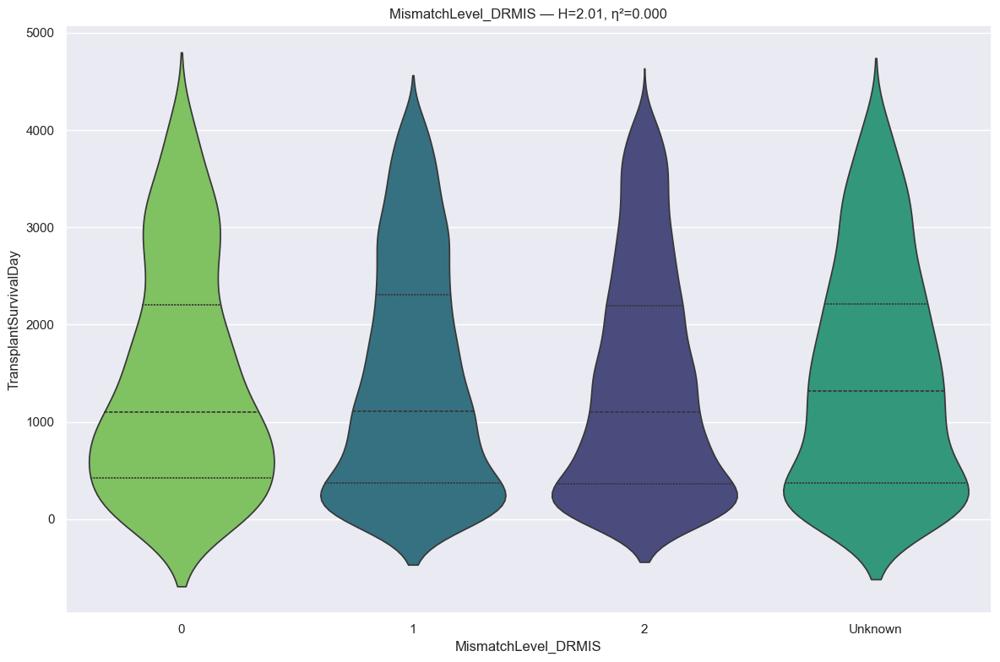

RANKING REPORT: MismatchLevel_DRMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 0                                                 :    393 records
 * 1                                                 :   3035 records
 * 2                                                 :   3952 records
 * Unknown                                           :    684 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 2.0114 | P-value: 5.700488e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0083 | r_threshold: 0.10)
--------------------------------------------------------------------------------
2            vs Unknown      | p=2.5008e-01 | thr=0.0083 | r= 0.028 | Not Sig
1            vs 2            | p=2.8921e-01 | thr=0.0083 | r=-0.015 | Not Sig
1            vs Unknown      | p=5.9884e-01 | thr=0.0083 | r= 0.013 | Not Sig
0            vs 2            | p=6.2716e-01 | thr=0.0083 | r=-0.015 | Not Si

In [400]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [401]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### MismatchLevel_HLAMIS

In [402]:
# info
feature = u.get_feature_info(df, 'MismatchLevel_HLAMIS', cat=True)

                     count unique top  freq
MismatchLevel_HLAMIS  8064      8   5  2701

:::: NaN Count:
MismatchLevel_HLAMIS    0 

--- MismatchLevel_HLAMIS ---
dtype: category
Categories: ['0', '1', '2', '3', '4', '5', '6', 'Unknown']
Ordered: False



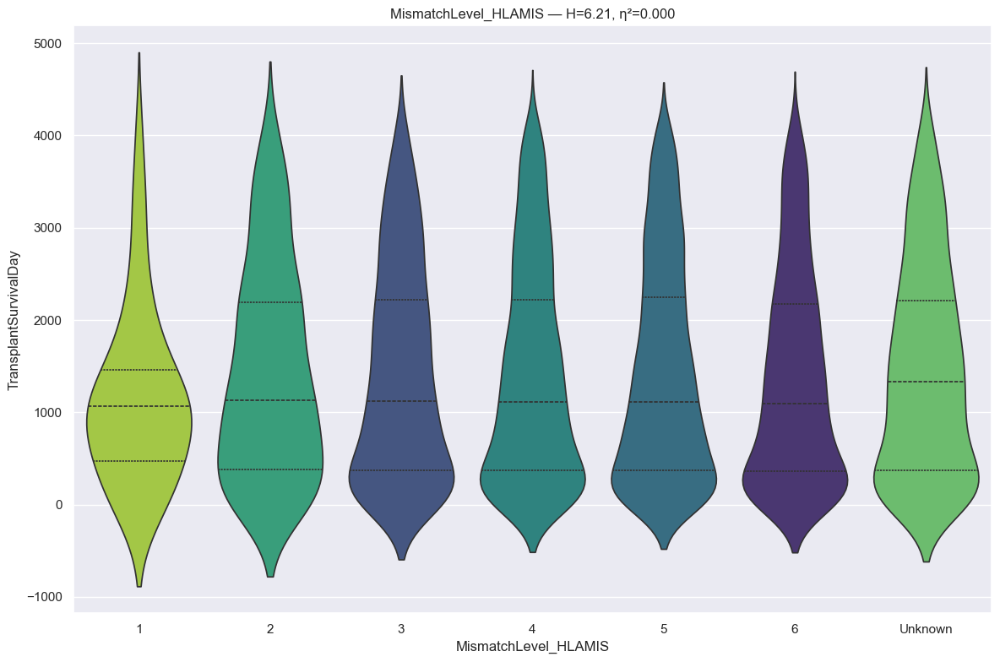

RANKING REPORT: MismatchLevel_HLAMIS (n ≥ 30)
INCLUDED CATEGORIES:
 * 1                                                 :     41 records
 * 2                                                 :    214 records
 * 3                                                 :    861 records
 * 4                                                 :   1928 records
 * 5                                                 :   2701 records
 * 6                                                 :   1622 records
 * Unknown                                           :    685 records
BYPASSED CATEGORIES (n < min_n):
 * 0                                                 :     12 records
--------------------------------------------------------------------------------
Kruskal H: 6.2118 | P-value: 3.998892e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0024 | r_threshold: 0.10)
--------------------------------------------------------------------------------
5            vs 6     

In [403]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [404]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival only for a small sample.

#### BloodGroupMatchLevel

In [405]:
# info
feature = u.get_feature_info(df, 'BloodGroupMatchLevel', cat=True)

                     count unique        top  freq
BloodGroupMatchLevel  8064      2  Identical  6807

:::: NaN Count:
BloodGroupMatchLevel    0 

--- BloodGroupMatchLevel ---
dtype: category
Categories: ['Compatible', 'Identical', 'Incompatible']
Ordered: False



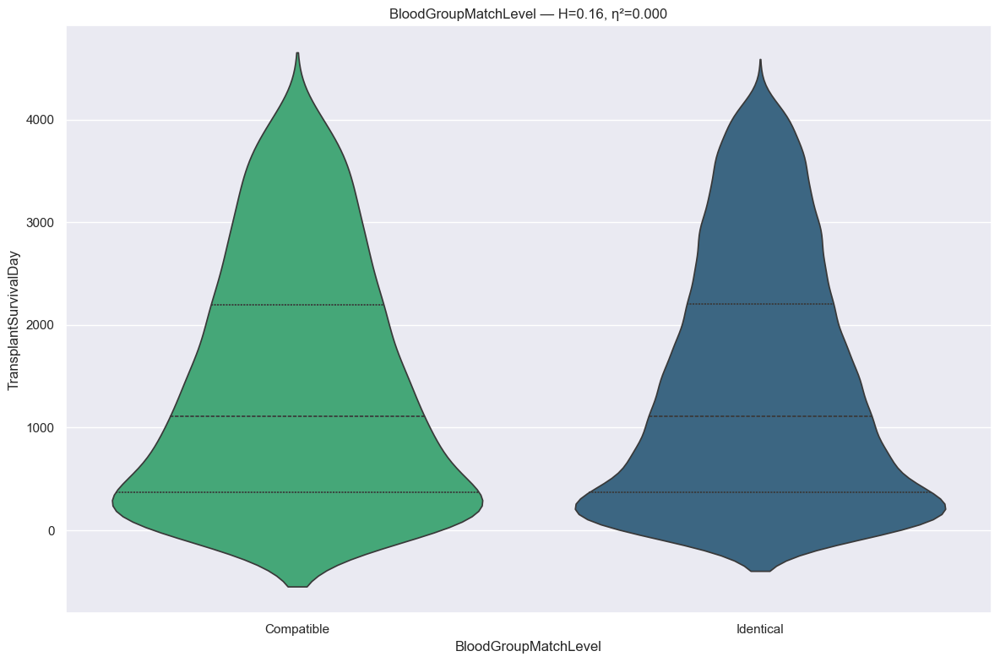

RANKING REPORT: BloodGroupMatchLevel (n ≥ 30)
INCLUDED CATEGORIES:
 * Compatible                                        :   1257 records
 * Identical                                         :   6807 records
BYPASSED CATEGORIES: None
--------------------------------------------------------------------------------
Kruskal H: 0.1583 | P-value: 6.906926e-01 | Effect η²: 0.0000
Correction Method: BONFERRONI
Pairwise Testing (Bonferroni Alpha: 0.0500 | r_threshold: 0.10)
--------------------------------------------------------------------------------
Compatible   vs Identical    | p=6.9070e-01 | thr=0.0500 | r= 0.007 | Not Sig
::::: Collapsed into 1 groups (excluding 'Other') :::::

:::::::::::::::::::::::::::::: GROUPED CATEGORIES ::::::::::::::::::::::::::::::

>>> Group_1 (2 categories)
  - Compatible
  - Identical

BloodGroupMatchLevel  mean_survival_days  median_survival_days  maximum_survival_days  minimum_survival_days  record_count
           Identical         1426.829440            

In [406]:
# values for NominalSurvivalRanker
class_values = {
    "r_thresh": 0.10,
    "min_n": 30,
    "method": "bonferroni",
    "suppress_pairwise": False,
    "rotation": 0
}
# NominalSurvivalRanker
mapping_df, results = ranker.cat_feature_ranker(data=df, mapping_data=mapping_df, 
                                                type_value=type_value, gender_value=gender_value,
                                                feature=feature, class_values=class_values, 
                                                re_run=False)

In [407]:
# remove
mapping_df, remove_cols = ranker.update_remove_cols_and_mapping(mapping_data=mapping_df, remove_cols=remove_cols,
                                                                feature=feature, type_value=type_value, 
                                                                gender_value=gender_value)

##### **Note:** The feature is not statistically significant and uninformative for survival.

#### Clean Up

In [408]:
# add to remove list
remove_cols.extend(feature)

# remove unwanted columns
df = df.drop(columns=remove_cols).copy()

# removed all unused categories
for col in df.select_dtypes(include="category"):
    df[col] = df[col].cat.remove_unused_categories()

# shape
print(df.shape)

# info
df.info(max_cols=df.shape[1])

(8064, 112)
<class 'pandas.DataFrame'>
RangeIndex: 8064 entries, 0 to 8063
Data columns (total 112 columns):
 #    Column                                        Non-Null Count  Dtype   
---   ------                                        --------------  -----   
 0    PreviousTransplantNumber_CAN                  8064 non-null   category
 1    WaitListDiagnosisCode_CAN                     8064 non-null   category
 2    Citizenship_CAN                               8064 non-null   category
 3    ResidencyStateRegistration_CAN                8064 non-null   category
 4    EducationLevel_CAN                            8064 non-null   category
 5    LifeSupportRegistration_ECMO_CAN              8064 non-null   category
 6    LifeSupportRegistration_IABP_CAN              8064 non-null   category
 7    LifeSupportMechanismRegistration_OTHER_CAN    8064 non-null   category
 8    VentricularDeviceBrandRegistration_CAN        8064 non-null   category
 9    FunctionalStatusRegistration_CAN      

#### Write to Disk

In [409]:
# save data: heart dataset
u.write_to_file(df, 'Female_CAN_Heart_PreML',path='../Data/', format='parquet')
u.write_to_file(mapping_df, 'Female_CAN_Heart_Mapping',path='../Data/', format='parquet')

8,064 records written to ../Data/Female_CAN_Heart_PreML.parquet
80 records written to ../Data/Female_CAN_Heart_Mapping.parquet
